# Imports

In [ ]:
!pip install pandas-market-calendars QuantStats python-dotenv

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.9/123.9 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.8/45.8 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.1/200.1 kB 13.1 MB/s eta 0:00:00


In [ ]:
!pip install git+https://github.com/AI4Finance-Foundation/FinRL.git

  Cloning https://github.com/AI4Finance-Foundation/FinRL.git to /tmp/pip-req-build-ftekc_11
  Running command git clone --filter=blob:none --quiet https://github.com/AI4Finance-Foundation/FinRL.git /tmp/pip-req-build-ftekc_11
  Resolved https://github.com/AI4Finance-Foundation/FinRL.git to commit c2386a7483e6736d53c99c4b56ae5e855fec37ab
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Cloning https://github.com/AI4Finance-Foundation/ElegantRL.git to /tmp/pip-install-4skwf0zm/elegantrl_54f797ddb193415280150e3330ffa924
  Running command git clone --filter=blob:none --quiet https://github.com/AI4Finance-Foundation/ElegantRL.git /tmp/pip-install-4skwf0zm/elegantrl_54f797ddb193415280150e3330ffa924
  Resolved https://github.com/AI4Finance-Foundation/ElegantRL.git to commit 8ea76afc3e7f1564ae9f0e69e70254116d575fe9
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.7/1

In [ ]:
import warnings

warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", message="Module \"zipline.assets\" not found", category=UserWarning)
# Suppress date warnings for HMA
warnings.filterwarnings("ignore", category=UserWarning, module="statsmodels")

In [ ]:
import os
import glob
import zipfile
import math
import time
import random
import requests
import pandas as pd
import numpy as np
from pathlib import Path
from datetime import datetime
from collections import defaultdict
from typing import List, Union, Callable, Optional

from dotenv import dotenv_values
from cryptography.fernet import Fernet

import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tsa.seasonal import seasonal_decompose
from scipy.stats import skew, kurtosis

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.dates as mdates
import matplotlib.ticker as mtick
import seaborn as sns
import quantstats as qs

import pandas_market_calendars as mcal

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

import gymnasium as gym
from gymnasium import spaces
from gymnasium.utils import seeding

from stable_baselines3.common.vec_env import DummyVecEnv
from stable_baselines3.common.torch_layers import BaseFeaturesExtractor
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.logger import Figure
from stable_baselines3.common.callbacks import BaseCallback, EvalCallback, StopTrainingOnNoModelImprovement
from stable_baselines3 import A2C, DDPG, PPO, SAC, TD3
from stable_baselines3.common.logger import TensorBoardOutputFormat

from sklearn.preprocessing import MaxAbsScaler

from finrl import config
from finrl.meta.preprocessor.preprocessors import FeatureEngineer
from finrl.agents.stablebaselines3.models import DRLAgent
from finrl.meta.preprocessor.preprocessors import GroupByScaler

In [ ]:
pd.set_option("display.max_columns", None)

# Alphavantage ETFs data extraction

Procedure to encript existing API keys and store the keys in a file for later use.

In [ ]:
# from cryptography.fernet import Fernet

# # STEP 1: Generate and save the Fernet key
# fernet_key = Fernet.generate_key()
# with open("fernet.key", "wb") as key_file:
#     key_file.write(fernet_key)
# print("Fernet key saved to 'fernet.key'")

# # STEP 2: Encrypt the API keys and save to .env file
# fernet = Fernet(fernet_key)

# # Define your API keys here
# api_keys = [
#     'KEY_1',
#     'KEY_2',
#     'KEY_3',
#     # ...
# ]

# with open("encrypted_keys.env", "w") as f:
#     for i, key in enumerate(api_keys):
#         encrypted = fernet.encrypt(key.encode()).decode()
#         f.write(f"API_KEY_{i}={encrypted}\n")

# print("Encrypted keys saved to 'encrypted_keys.env'")

Procedure to load encripted API keys from the files.

In [ ]:
# Load encrypted API keys from Drive
env_path = '/content/encrypted_keys.env'
fernet_key_path = '/content/fernet.key'

# Load Fernet key
with open(fernet_key_path, 'rb') as f:
    fernet = Fernet(f.read())

# Load encrypted keys
env_vars = dotenv_values(env_path)
# Alpha Vantage API keys
API_KEYS = []

for i in range(len(env_vars)):
    key_var = env_vars.get(f'API_KEY_{i}')
    if key_var:
        decrypted = fernet.decrypt(key_var.encode()).decode()
        API_KEYS.append(decrypted)

In [ ]:
# ETF symbols
ETF_SYMBOLS = ['IWF', 'IWD', 'IWM', 'IYR', 'XLC', 'XLY', 'XLP', 'XLE', 'XLF', 'XLV', 'XLI', 'XLB', 'XLRE', 'XLK', 'XLU',
               'AGG', 'TLT', 'SHY', 'LQD', 'EWC', 'EWU', 'VGK', 'EZU', 'MCHI', 'EWH', 'EWJ', 'EWY', 'EIDO', 'INDA',
               'EZA', 'EWA', 'ENZL', 'EWZ', 'GLD', 'SLV', 'REET', 'DIA', 'SPY', 'QQQ']

BASE_URL = 'https://www.alphavantage.co/query'
SAVE_DIR = '/content/alpha_etfs'

def get_random_api_key():
    return random.choice(API_KEYS)

def fetch_json(params):
    for attempt in range(5):
        try:
            response = requests.get(BASE_URL, params=params)
            if response.status_code == 200:
                data = response.json()
                if "Note" in data:
                    print("API rate limit hit. Sleeping 60s...")
                    time.sleep(60)
                    continue
                return data
        except Exception as e:
            print(f"Fetch error: {e}")
        time.sleep(5)
    return None

def fetch_daily_data(symbol):
    params = {
        'function': 'TIME_SERIES_DAILY',
        'symbol': symbol,
        'outputsize': 'full',
        'apikey': get_random_api_key()
    }
    data = fetch_json(params)
    if data and 'Time Series (Daily)' in data:
        df = pd.DataFrame.from_dict(data['Time Series (Daily)'], orient='index')
        df = df.rename(columns={
            '1. open': 'Open',
            '2. high': 'High',
            '3. low': 'Low',
            '4. close': 'Close',
            '5. volume': 'Volume'
        })
        df.index = pd.to_datetime(df.index)
        df = df.sort_index()
        df = df.astype(float)
        return df
    print(f"Failed to fetch daily data for {symbol}")
    return None

def fetch_dividends(symbol):
    params = {
        'function': 'DIVIDENDS',
        'symbol': symbol,
        'apikey': get_random_api_key()
    }
    data = fetch_json(params)

    if data and isinstance(data, dict) and 'data' in data:
        records = data['data']
        if not records:
            return pd.DataFrame(columns=['Dividend'])

        df = pd.DataFrame(records)
        if 'ex_dividend_date' not in df.columns or 'amount' not in df.columns:
            print(f"Missing keys in dividend data for {symbol}")
            return pd.DataFrame(columns=['Dividend'])

        df['Date'] = pd.to_datetime(df['ex_dividend_date'])
        df['Dividend'] = pd.to_numeric(df['amount'], errors='coerce')
        df = df[['Date', 'Dividend']].dropna().set_index('Date')
        return df

    print(f"No valid dividend data for {symbol}")
    return pd.DataFrame(columns=['Dividend'])

def fetch_splits(symbol):
    params = {
        'function': 'SPLITS',
        'symbol': symbol,
        'apikey': get_random_api_key()
    }
    data = fetch_json(params)

    if data and isinstance(data, dict) and 'data' in data:
        records = data['data']
        if not records:
            return pd.DataFrame(columns=['Split'])

        df = pd.DataFrame(records)
        if 'effective_date' not in df.columns or 'split_factor' not in df.columns:
            print(f"Missing keys in split data for {symbol}")
            return pd.DataFrame(columns=['Split'])

        df['Date'] = pd.to_datetime(df['effective_date'])
        df['Split'] = pd.to_numeric(df['split_factor'], errors='coerce')
        df = df[['Date', 'Split']].dropna().set_index('Date')
        return df

    print(f"No valid split data for {symbol}")
    return pd.DataFrame(columns=['Split'])

SAVE_DIR = '/content/alpha_etfs'
ZIP_PATH = '/content/alpha_etfs.zip'

# Step 1: Extract ZIP if folder doesn't exist but ZIP exists
if os.path.exists(ZIP_PATH) and not os.path.exists(SAVE_DIR):
    print(f"Extracting {ZIP_PATH} to {SAVE_DIR}...")
    with zipfile.ZipFile(ZIP_PATH, 'r') as zip_ref:
        zip_ref.extractall(SAVE_DIR)
    print("Extraction complete.")

# Step 2: Save CSVs with skip-if-exists check
for symbol in ETF_SYMBOLS:
    print(f"Processing {symbol}...")
    etf_path = os.path.join(SAVE_DIR, symbol)
    os.makedirs(etf_path, exist_ok=True)

    # Paths to CSVs
    price_path = os.path.join(etf_path, 'price.csv')
    dividends_path = os.path.join(etf_path, 'dividends.csv')
    splits_path = os.path.join(etf_path, 'splits.csv')

    # Price
    if not os.path.exists(price_path):
        print("Fetching price...")
        price_df = fetch_daily_data(symbol)
        if not price_df.empty:
            price_df.to_csv(price_path)
            time.sleep(60)  # respect rate limits
        else:
            print("Skipped: No price data.")
    else:
        print("Skipped price.csv (already exists)")

    # Dividends
    if not os.path.exists(dividends_path):
        print("Fetching dividends...")
        div_df = fetch_dividends(symbol)
        if not div_df.empty:
            div_df.to_csv(dividends_path)
            time.sleep(60)  # respect rate limits
        else:
            print("No dividend data found, saving empty CSV.")
            pd.DataFrame(columns=['Dividend']).to_csv(dividends_path, index=False)
    else:
        print("Skipped dividends.csv (already exists)")

    # Splits
    if not os.path.exists(splits_path):
        print("Fetching splits...")
        split_df = fetch_splits(symbol)
        if not split_df.empty:
            split_df.to_csv(splits_path)
            time.sleep(60)  # respect rate limits
        else:
            print("No split data found, saving empty CSV.")
            pd.DataFrame(columns=['Split']).to_csv(splits_path, index=False)
    else:
        print("Skipped splits.csv (already exists)")


# Zip all data
with zipfile.ZipFile(ZIP_PATH, 'w') as zf:
    for root, _, files in os.walk(SAVE_DIR):
        for file in files:
            filepath = os.path.join(root, file)
            arcname = os.path.relpath(filepath, SAVE_DIR)
            zf.write(filepath, arcname)

Extracting /content/alpha_etfs.zip to /content/alpha_etfs...
Extraction complete.
Processing IWF...
Skipped price.csv (already exists)
Skipped dividends.csv (already exists)
Skipped splits.csv (already exists)
Processing IWD...
Skipped price.csv (already exists)
Skipped dividends.csv (already exists)
Skipped splits.csv (already exists)
Processing IWM...
Skipped price.csv (already exists)
Skipped dividends.csv (already exists)
Skipped splits.csv (already exists)
Processing IYR...
Skipped price.csv (already exists)
Skipped dividends.csv (already exists)
Skipped splits.csv (already exists)
Processing XLC...
Skipped price.csv (already exists)
Skipped dividends.csv (already exists)
Skipped splits.csv (already exists)
Processing XLY...
Skipped price.csv (already exists)
Skipped dividends.csv (already exists)
Skipped splits.csv (already exists)
Processing XLP...
Skipped price.csv (already exists)
Skipped dividends.csv (already exists)
Skipped splits.csv (already exists)
Processing XLE...
Skip

In [ ]:
adjusted_etf_data = {}

def compute_adjusted_close(price, dividends, splits, symbol):
    df = price.copy()
    df['Adj Close'] = df['Close']

    # Apply splits
    if not splits.empty:
        for date, row in splits.sort_index().iterrows():
            split_ratio = row['Split']
            if split_ratio > 0:
              adjustment_factor = 1 / split_ratio
              df.loc[df.index < date, ['Adj Close']] *= adjustment_factor


    # Apply dividends
    if not dividends.empty:
        dividends = dividends.sort_index()
        for date, row in dividends.iterrows():
            if date in df.index:
                close_price = df.loc[date, 'Close']
                dividend = row['Dividend']
                if close_price > 0:  # Prevent divide-by-zero
                    factor = 1 - (dividend / close_price)
                    if factor > 0:
                        df.loc[df.index < date, ['Adj Close']] *= factor

    # Returning the final price series
    return df

with zipfile.ZipFile('/content/alpha_etfs.zip', 'r') as z:
    for symbol in ETF_SYMBOLS:
        try:
            # Read price data
            price_df = pd.read_csv(z.open(f'{symbol}/price.csv'), index_col=0, parse_dates=True)

            # Try reading dividends.csv
            try:
                with z.open(f'{symbol}/dividends.csv') as div_file:
                    dividends_df = pd.read_csv(div_file, index_col=0, parse_dates=True)
                    if dividends_df.empty:
                        dividends_df = pd.DataFrame(columns=['Dividend'])
            except KeyError:
                dividends_df = pd.DataFrame(columns=['Dividend'])

            # Try reading splits.csv
            try:
                with z.open(f'{symbol}/splits.csv') as split_file:
                    splits_df = pd.read_csv(split_file, index_col=0, parse_dates=True)
                    if splits_df.empty:
                        splits_df = pd.DataFrame(columns=['Split'])
            except KeyError:
                splits_df = pd.DataFrame(columns=['Split'])

            # Compute adjusted close
            adjusted_df = compute_adjusted_close(price_df, dividends_df, splits_df, symbol)
            adjusted_etf_data[symbol] = adjusted_df

        except Exception as e:
            print(f"Error processing {symbol}: {e}")

In [ ]:
adjusted_etf_data["EWU"].loc["2016-11-01":"2016-11-15"]

,Open,High,Low,Close,Volume,Adj Close
2016-11-01,30.10,30.140,29.7800,29.90,1280258.5,42.785713
2016-11-02,29.98,30.000,29.6600,29.74,1696814.5,42.556759
2016-11-03,30.04,30.060,29.7400,29.76,2772545.5,42.585379
2016-11-04,29.56,29.700,29.4300,29.46,1756398.5,42.156090
2016-11-07,29.78,29.900,29.7400,29.90,1368086.0,21.392856
2016-11-08,29.81,30.110,29.7738,30.01,1361599.0,21.471559
2016-11-09,29.99,30.545,29.9900,30.39,3136562.0,21.743442
2016-11-10,30.42,30.530,30.1500,30.39,2452196.0,21.743442
2016-11-11,30.14,30.170,29.9101,30.10,1996695.0,21.535953
2016-11-14,29.89,29.990,29.7800,29.96,2011782.0,21.435785


# Exploratory Data Analysis (EDA)

#### Structural Checks

In [ ]:
# ETF datasets
for symbol, df in adjusted_etf_data.items():
    print(f"{symbol}: Shape = {df.shape}, Columns = {list(df.columns)}")

IWF: Shape = (6257, 6), Columns = ['Open', 'High', 'Low', 'Close', 'Volume', 'Adj Close']
IWD: Shape = (6257, 6), Columns = ['Open', 'High', 'Low', 'Close', 'Volume', 'Adj Close']
IWM: Shape = (6257, 6), Columns = ['Open', 'High', 'Low', 'Close', 'Volume', 'Adj Close']
IYR: Shape = (6242, 6), Columns = ['Open', 'High', 'Low', 'Close', 'Volume', 'Adj Close']
XLC: Shape = (1714, 6), Columns = ['Open', 'High', 'Low', 'Close', 'Volume', 'Adj Close']
XLY: Shape = (6401, 6), Columns = ['Open', 'High', 'Low', 'Close', 'Volume', 'Adj Close']
XLP: Shape = (6401, 6), Columns = ['Open', 'High', 'Low', 'Close', 'Volume', 'Adj Close']
XLE: Shape = (6401, 6), Columns = ['Open', 'High', 'Low', 'Close', 'Volume', 'Adj Close']
XLF: Shape = (6401, 6), Columns = ['Open', 'High', 'Low', 'Close', 'Volume', 'Adj Close']
XLV: Shape = (6401, 6), Columns = ['Open', 'High', 'Low', 'Close', 'Volume', 'Adj Close']
XLI: Shape = (6401, 6), Columns = ['Open', 'High', 'Low', 'Close', 'Volume', 'Adj Close']
XLB: Shape

#### Time Coverage Validation

In [ ]:
# ETF datasets
for symbol, df in adjusted_etf_data.items():
    print(f"{symbol}: {df.index.min().date()} to {df.index.max().date()}")

IWF: 2000-05-26 to 2025-04-11
IWD: 2000-05-26 to 2025-04-11
IWM: 2000-05-26 to 2025-04-11
IYR: 2000-06-19 to 2025-04-11
XLC: 2018-06-19 to 2025-04-11
XLY: 1999-11-01 to 2025-04-11
XLP: 1999-11-01 to 2025-04-11
XLE: 1999-11-01 to 2025-04-11
XLF: 1999-11-01 to 2025-04-11
XLV: 1999-11-01 to 2025-04-11
XLI: 1999-11-01 to 2025-04-11
XLB: 1999-11-01 to 2025-04-11
XLRE: 2015-10-08 to 2025-04-11
XLK: 1999-11-01 to 2025-04-11
XLU: 1999-11-01 to 2025-04-11
AGG: 2003-09-26 to 2025-04-11
TLT: 2002-07-26 to 2025-04-11
SHY: 2002-07-26 to 2025-04-11
LQD: 2002-07-26 to 2025-04-11
EWC: 1999-11-01 to 2025-04-11
EWU: 1999-11-01 to 2025-04-11
VGK: 2005-03-10 to 2025-04-11
EZU: 2001-01-02 to 2025-04-11
MCHI: 2011-03-31 to 2025-04-11
EWH: 1999-11-01 to 2025-04-11
EWJ: 1999-11-01 to 2025-04-11
EWY: 2000-05-12 to 2025-04-11
EIDO: 2010-05-07 to 2025-04-11
INDA: 2012-02-03 to 2025-04-11
EZA: 2003-02-07 to 2025-04-11
EWA: 1999-11-01 to 2025-04-11
ENZL: 2010-09-02 to 2025-04-11
EWZ: 2000-07-14 to 2025-04-11
GLD: 

#### Missing Values Analysis

In [ ]:
# ETF datasets
for symbol, df in adjusted_etf_data.items():
    print(f"######### {symbol} missing values - start #########")
    print(df.isnull().sum())
    print(f"######### {symbol} missing values - end   #########\n")

######### IWF missing values - start #########
Open         0
High         0
Low          0
Close        0
Volume       0
Adj Close    0
dtype: int64
######### IWF missing values - end   #########

######### IWD missing values - start #########
Open         0
High         0
Low          0
Close        0
Volume       0
Adj Close    0
dtype: int64
######### IWD missing values - end   #########

######### IWM missing values - start #########
Open         0
High         0
Low          0
Close        0
Volume       0
Adj Close    0
dtype: int64
######### IWM missing values - end   #########

######### IYR missing values - start #########
Open         0
High         0
Low          0
Close        0
Volume       0
Adj Close    0
dtype: int64
######### IYR missing values - end   #########

######### XLC missing values - start #########
Open         0
High         0
Low          0
Close        0
Volume       0
Adj Close    0
dtype: int64
######### XLC missing values - end   #########

######### 

#### ETF Return Histograms

In [ ]:
n = len(adjusted_etf_data)
rows = (n + 2) // 3  # 3 plots per row
fig, axes = plt.subplots(rows, 3, figsize=(18, 4 * rows))

for i, (symbol, df) in enumerate(adjusted_etf_data.items()):
    row, col = divmod(i, 3)
    ax = axes[row, col]
    returns = df['Adj Close'].pct_change().dropna()
    ax.hist(returns, bins=50, alpha=0.7)
    ax.set_title(f"Return Distribution: {symbol}")

# Hide any unused axes
for j in range(i+1, rows*3):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()

All ETFs returns have Kurtosis i.e. there distribution have thick tails. Some ETFs are left-skewed i.e. they have risk of large sudden price drops where as some ETFs are right-skewed i.e. occasionally they have large gains. ETFs like IYR, EWU, EZU, EWJ, EZA shows extremely high kurtosis and thus are prone to extreme outliers. ETFs like AGG, EWG and EWJ show strong negative skewness which means that they are more likely to experience big sudden drops rather than rallies. Since the data returns of these assets are not normal standard Gaussian based methods like mean-variance optimization should not be used instead DRL based approach is a better choice as it can adapt to the skewed and fat-tailed environments.

As there is higher probability of extreme events, incorporate risk-sensitive reward penalties (e.g. tail risk measures) should be considered while designing the DRL agent.

In [ ]:
for symbol, df in adjusted_etf_data.items():
    returns = df['Adj Close'].pct_change().dropna()
    kurt = kurtosis(returns, fisher=False)
    skness = skew(returns)
    print(f"{symbol}: Kurtosis = {kurt:.4f} Skewness: {skness:.4f}")

IWF: Kurtosis = 29.8031 Skewness: 0.0343
IWD: Kurtosis = 15.5930 Skewness: -0.2124
IWM: Kurtosis = 8.4000 Skewness: -0.2639
IYR: Kurtosis = 118.9638 Skewness: -3.7306
XLC: Kurtosis = 9.3421 Skewness: -0.2857
XLY: Kurtosis = 9.6078 Skewness: -0.1380
XLP: Kurtosis = 12.4854 Skewness: 0.0191
XLE: Kurtosis = 14.7806 Skewness: -0.1814
XLF: Kurtosis = 17.7492 Skewness: 0.3078
XLV: Kurtosis = 14.7021 Skewness: 0.2690
XLI: Kurtosis = 10.7099 Skewness: -0.1665
XLB: Kurtosis = 8.3188 Skewness: -0.2126
XLRE: Kurtosis = 17.9539 Skewness: -0.6846
XLK: Kurtosis = 10.7854 Skewness: 0.3281
XLU: Kurtosis = 15.6943 Skewness: 0.2458
AGG: Kurtosis = 53.0825 Skewness: -1.8204
TLT: Kurtosis = 6.4525 Skewness: 0.0541
SHY: Kurtosis = 10.1469 Skewness: 0.2607
LQD: Kurtosis = 60.5695 Skewness: 0.0127
EWC: Kurtosis = 12.4667 Skewness: -0.3055
EWU: Kurtosis = 169.3896 Skewness: -5.1187
VGK: Kurtosis = 13.5385 Skewness: -0.3376
EZU: Kurtosis = 868.1923 Skewness: 17.9593
MCHI: Kurtosis = 12.4072 Skewness: 0.4855
EW

#### Stationarity Test (ADF)

In [ ]:
for symbol, df in adjusted_etf_data.items():
    returns = df['Adj Close'].pct_change().dropna()
    result = adfuller(returns)
    print(f"{symbol}: ADF Statistic = {result[0]:.4f}, p-value = {result[1]:.4f}")

IWF: ADF Statistic = -19.8444, p-value = 0.0000
IWD: ADF Statistic = -15.0466, p-value = 0.0000
IWM: ADF Statistic = -17.8643, p-value = 0.0000
IYR: ADF Statistic = -14.4805, p-value = 0.0000
XLC: ADF Statistic = -13.5198, p-value = 0.0000
XLY: ADF Statistic = -15.2923, p-value = 0.0000
XLP: ADF Statistic = -17.7567, p-value = 0.0000
XLE: ADF Statistic = -19.9486, p-value = 0.0000
XLF: ADF Statistic = -14.3271, p-value = 0.0000
XLV: ADF Statistic = -16.8328, p-value = 0.0000
XLI: ADF Statistic = -19.1161, p-value = 0.0000
XLB: ADF Statistic = -18.9205, p-value = 0.0000
XLRE: ADF Statistic = -14.1353, p-value = 0.0000
XLK: ADF Statistic = -19.7732, p-value = 0.0000
XLU: ADF Statistic = -20.4803, p-value = 0.0000
AGG: ADF Statistic = -12.8298, p-value = 0.0000
TLT: ADF Statistic = -14.6357, p-value = 0.0000
SHY: ADF Statistic = -11.5368, p-value = 0.0000
LQD: ADF Statistic = -14.1604, p-value = 0.0000
EWC: ADF Statistic = -15.3154, p-value = 0.0000
EWU: ADF Statistic = -18.0995, p-value 

#### Rolling Volatility on ETF Returns

In [ ]:
symbols = list(adjusted_etf_data.keys())
n = len(symbols)
rows = (n + 2) // 3

fig, axes = plt.subplots(rows, 3, figsize=(18, 6 * rows))

for i, symbol in enumerate(symbols):
    row, col = divmod(i, 3)
    ax = axes[row, col]

    df = adjusted_etf_data[symbol]
    returns = df['Adj Close'].pct_change()

    rolling_vol_15d = returns.rolling(window=15).std()
    rolling_vol_30d = returns.rolling(window=30).std()

    ax.plot(rolling_vol_15d, label='15D Vol', alpha=0.7)
    ax.plot(rolling_vol_30d, label='30D Vol', alpha=0.7)
    ax.set_title(f"{symbol} Volatility")
    ax.legend()

# Remove any empty unused axes
for j in range(i+1, rows*3):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()

#### Volatility Clustering Test (Ljung-Box on Squared ETF Returns)

In [ ]:
for symbol, df in adjusted_etf_data.items():
    returns = df['Adj Close'].pct_change().dropna()
    squared_returns = returns**2

    lb_test = acorr_ljungbox(squared_returns, lags=[10], return_df=True)
    p_value = lb_test['lb_pvalue'].values[0]

    result = "Significant autocorrelation" if p_value < 0.05 else "No significant autocorrelation"

    print(f"{symbol}: p-value = {p_value:.4f} - {result}")

IWF: p-value = 0.0000 - Significant autocorrelation
IWD: p-value = 0.0000 - Significant autocorrelation
IWM: p-value = 0.0000 - Significant autocorrelation
IYR: p-value = 0.0000 - Significant autocorrelation
XLC: p-value = 0.0000 - Significant autocorrelation
XLY: p-value = 0.0000 - Significant autocorrelation
XLP: p-value = 0.0000 - Significant autocorrelation
XLE: p-value = 0.0000 - Significant autocorrelation
XLF: p-value = 0.0000 - Significant autocorrelation
XLV: p-value = 0.0000 - Significant autocorrelation
XLI: p-value = 0.0000 - Significant autocorrelation
XLB: p-value = 0.0000 - Significant autocorrelation
XLRE: p-value = 0.0000 - Significant autocorrelation
XLK: p-value = 0.0000 - Significant autocorrelation
XLU: p-value = 0.0000 - Significant autocorrelation
AGG: p-value = 0.0000 - Significant autocorrelation
TLT: p-value = 0.0000 - Significant autocorrelation
SHY: p-value = 0.0000 - Significant autocorrelation
LQD: p-value = 0.0000 - Significant autocorrelation
EWC: p-valu

# Save the Dataset to HDFS

In [ ]:
# Define folder structure
output_folder = "price_data"

# Create folders if they don't exist
os.makedirs(output_folder, exist_ok=True)

# Save adjusted_etf_data
for symbol, df in adjusted_etf_data.items():
    path = os.path.join(output_folder, f"etf_{symbol}.parquet")
    df.to_parquet(path)

# Now Zip the whole folder
zip_filename = "price_data.zip"
with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
    for filename in os.listdir(output_folder):
        file_path = os.path.join(output_folder, filename)
        zipf.write(file_path, arcname=filename)

print(f"All datasets saved and zipped as {zip_filename}")

All datasets saved and zipped as price_data.zip


# Final Model Design

#### Extract and Populate saved price and macroeconomic dataset

In [ ]:
# Define new zip files and extraction folders
price_zip_filename = "price_data.zip"
macro_zip_filename = "macro_data.zip"
etf_folder = "price_data"
macro_folder = "macro_data"

# Step 1: Extract if folders not already present
if not os.path.exists(etf_folder):
    print("Extracting ETF price data...")
    with zipfile.ZipFile(price_zip_filename, 'r') as zip_ref:
        zip_ref.extractall(etf_folder)
else:
    print("ETF price data already extracted.")

if not os.path.exists(macro_folder):
    print("Extracting macroeconomic data...")
    with zipfile.ZipFile(macro_zip_filename, 'r') as zip_ref:
        zip_ref.extractall(macro_folder)
else:
    print("Macroeconomic data already extracted.")

# Step 2: Load data into dictionaries
macroeconomic_df = {}
adjusted_etf_data = {}

# Load macro datasets
for filename in os.listdir(macro_folder):
    if filename.endswith(".parquet"):
        region = filename.split(".parquet")[0]
        df = pd.read_parquet(os.path.join(macro_folder, filename))
        macroeconomic_df[region] = df

# Load ETF datasets
for filename in os.listdir(etf_folder):
    if filename.endswith(".parquet"):
        symbol = filename.split("etf_")[1].split(".parquet")[0]
        df = pd.read_parquet(os.path.join(etf_folder, filename))
        adjusted_etf_data[symbol] = df

print("All datasets successfully loaded into memory.")

Extracting ETF price data...
Extracting macroeconomic data...
All datasets successfully loaded into memory.


#### Pre-Compute Rolling Stage 1 Variables

##### HMA

In [ ]:
def compute_rolling_hmm_for_etfs(adjusted_etf_data, lookback_weeks=156, save_dir="hmm_rolling"):
    """
    Computes HMM rolling regimes for each ETF based on past `lookback_weeks` of returns,
    saving and loading from HDFS (local folder simulated as save_dir).
    """
    # === 1. Extract if folder is missing but zip is present ===
    if not os.path.exists(save_dir):
        zip_filename = f"{save_dir}.zip"
        if os.path.exists(zip_filename):
            print(f"[UNZIP] Extracting existing {zip_filename}...")
            with zipfile.ZipFile(zip_filename, 'r') as zip_ref:
                zip_ref.extractall(save_dir)
            print(f"[UNZIP DONE] Extracted to {save_dir}")

    os.makedirs(save_dir, exist_ok=True)

    lookback_days = lookback_weeks * 5  # Approximate: 5 business days per week

    hmm_etf_data = {}

    for symbol, df in adjusted_etf_data.items():
        save_path = os.path.join(save_dir, f"hmm_rolling_{symbol}.parquet")

        # === Check if already processed and saved ===
        if os.path.exists(save_path):
            print(f"[CACHE] Loading {symbol} from saved file...")
            df_with_hmm = pd.read_parquet(save_path)
            hmm_etf_data[symbol] = df_with_hmm
            continue

        # === Otherwise compute ===
        print(f"[CALC] Computing HMM for {symbol}...")

        # Ensure 'Adj Close' exists and is usable
        if 'Adj Close' not in df.columns or df['Adj Close'].isna().all():
            print(f"Skipping {symbol} due to missing 'Adj Close'")
            continue

        df = df.copy()
        df['Return'] = df['Adj Close'].pct_change()

        # Smoothing for very low volatility ETFs
        if symbol in ['EWJ', 'EZU']:
            df['Return'] = df['Return'].rolling(3).mean()
            df['Return'] = (df['Return'] - df['Return'].mean()) / df['Return'].std()

        df.dropna(subset=['Return'], inplace=True)

        # Initialize regime columns
        df['Regime'] = np.nan
        df['Prob_Regime_0'] = np.nan
        df['Prob_Regime_1'] = np.nan
        df['HMM_LogLikelihood'] = np.nan
        df['HMM_AIC'] = np.nan
        df['HMM_BIC'] = np.nan

        for current_end_idx in range(lookback_days, len(df)):
            window_df = df.iloc[current_end_idx - lookback_days : current_end_idx]

            try:
                model = sm.tsa.MarkovRegression(window_df['Return'], k_regimes=2, trend='n', switching_variance=True)
                res = model.fit(disp=False)

                # Get the last regime probabilities from the training window
                smoothed_probs = res.smoothed_marginal_probabilities.iloc[-1]

                df.at[df.index[current_end_idx], 'Regime'] = smoothed_probs.idxmax()
                df.at[df.index[current_end_idx], 'Prob_Regime_0'] = smoothed_probs[0]
                df.at[df.index[current_end_idx], 'Prob_Regime_1'] = smoothed_probs[1]

                # Save model evaluation metrics (for later use)
                df.at[df.index[current_end_idx], 'HMM_LogLikelihood'] = res.llf
                df.at[df.index[current_end_idx], 'HMM_AIC'] = res.aic
                df.at[df.index[current_end_idx], 'HMM_BIC'] = res.bic

            except Exception as e:
                print(f"HMM error for {symbol} at {df.index[current_end_idx].date()}: {e}")

        # Save result immediately
        df.to_parquet(save_path)
        print(f"[SAVED] HMM results saved for {symbol} at {save_path}")

        hmm_etf_data[symbol] = df
        print(f"HMM rolling prediction completed for {symbol}")

    # === 2. Save ZIP to WORKING DIRECTORY ===
    zip_filename = f"{save_dir}.zip"
    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for root, _, files in os.walk(save_dir):
            for file in files:
                if file.endswith('.parquet'):
                    file_path = os.path.join(root, file)
                    arcname = os.path.relpath(file_path, save_dir)  # Save relative path inside zip
                    zipf.write(file_path, arcname)

    print(f"[ZIPPED] All files are zipped into {zip_filename}")

    return hmm_etf_data

adjusted_etf_data = compute_rolling_hmm_for_etfs(adjusted_etf_data)

[UNZIP] Extracting existing hmm_rolling.zip...
[UNZIP DONE] Extracted to hmm_rolling
[CACHE] Loading SHY from saved file...
[CACHE] Loading XLV from saved file...
[CACHE] Loading REET from saved file...
[CACHE] Loading IWD from saved file...
[CACHE] Loading XLE from saved file...
[CACHE] Loading XLY from saved file...
[CACHE] Loading VGK from saved file...
[CACHE] Loading EWJ from saved file...
[CACHE] Loading IWF from saved file...
[CACHE] Loading XLU from saved file...
[CACHE] Loading ENZL from saved file...
[CACHE] Loading XLC from saved file...
[CACHE] Loading IWM from saved file...
[CACHE] Loading XLP from saved file...
[CACHE] Loading GLD from saved file...
[CACHE] Loading TLT from saved file...
[CACHE] Loading XLF from saved file...
[CACHE] Loading EWZ from saved file...
[CACHE] Loading SPY from saved file...
[CACHE] Loading EWU from saved file...
[CACHE] Loading EWA from saved file...
[CACHE] Loading XLK from saved file...
[CACHE] Loading DIA from saved file...
[CACHE] Loading 

#### Backtesting with DRL Agent

##### New Environment

In [ ]:
class PortfolioOptimizationEnv(gym.Env):
    """
    A FinRL‑style portfolio‑allocation Gym environment returning **two** 3‑D states.
    **First:** Macroeconomic features of 13 regions.
    **Second:** Features of 36 assets which includes Price, HMM and Technical indicators.
    """

    def __init__(
        self,
        price: pd.DataFrame,
        macro: pd.DataFrame,
        initial_amount: float,
        *,
        features: List[str] = ("close", "high", "low"),
        valuation_feature: str = "close",
        time_column: str = "date",
        region_column: str = "region",
        time_format: str = "%Y-%m-%d",
        tic_column: str = "tic",
        time_window: int = 1,
        macro_lookback_years: int = 5,
        reward_type: str = "sharpe",  # "log_return" | "sharpe"
        reward_scaling: float = 1.0,
        invalid_alpha: float = 2.0,
        commission_fee_pct: float = 0.0,
        commission_fee_model: Optional[str] = None,  # "trf" | "wvm" | None
        cwd: str | Path = "./",
    ) -> None:
        """
        Parameters
        ----------
        price
            *Pre‑processed* and *normalized* market dataframe.
        macro
            *Pre‑processed* and *normalized* macroeconomic dataframe.
        reward_type
            `"log_return"` (per‑step log‑return) or `"sharpe"`
            (annualised Sharpe of returns observed so far).
        """
        super().__init__()

        self.df = price.copy()
        self.macro = macro.copy()
        self._initial_amount = float(initial_amount)
        self._features = list(features)
        self._valuation_feature = valuation_feature
        self._time_column = time_column
        self._tic_column = tic_column
        self._time_window = int(time_window)
        self._macro_lookback_years = int(macro_lookback_years)
        self._reward_type = reward_type.lower()
        self._reward_scaling = float(reward_scaling)
        self._invalid_alpha = float(invalid_alpha)
        self._commission_fee_pct = float(commission_fee_pct)
        self._commission_fee_model = commission_fee_model
        self._cwd = Path(cwd)

        # ─── Basic preparation

        # Price variation for valuation_feature only
        price_var = self.df[[self._time_column, self._tic_column, self._valuation_feature]].copy()
        price_var["prev_val"] = price_var.groupby(self._tic_column)[self._valuation_feature].shift(1)
        price_var[self._valuation_feature] = price_var[self._valuation_feature] / price_var["prev_val"]
        price_var[self._valuation_feature] = price_var[self._valuation_feature].fillna(1.0)
        self._df_price_variation = price_var[[self._time_column, self._tic_column, self._valuation_feature]]

        # Indetifying all the available trading assets
        self._tic_list = self.df[self._tic_column].unique()

        self.portfolio_size = len(self._tic_list)
        self._sorted_times = np.sort(self.df[self._time_column].unique())
        self.episode_length = len(self._sorted_times) - self._time_window + 1

        self._region_column = region_column
        self.num_regions = self.macro[self._region_column].nunique()
        self._region_list = self.macro[self._region_column].unique().tolist()
        self._macro_column = [col for col in self.macro.columns if col not in (self._time_column, self._region_column)]

        # ─── action & observation spaces
        self.action_space = spaces.Box(
            low=0.0,
            high=1.0,
            # cash + each asset
            shape=(1 + self.portfolio_size,),
            dtype=np.float32,
        )

        # create observation as box space
        self.observation_space = spaces.Dict({
            "price": spaces.Box(low=-np.inf, high=np.inf, shape=(len(self._features), self.portfolio_size, self._time_window), dtype=np.float32),
            "macro": spaces.Box(low=-np.inf, high=np.inf, shape=(len(self._macro_column), self.num_regions, self._macro_lookback_years * 12), dtype=np.float32),
        })

        # ─── bookkeeping
        self._results_dir = self._cwd / "results" / "rl"
        self._results_dir.mkdir(parents=True, exist_ok=True)

        self._seed()  # initialise RNG
        self.reset()  # builds first state

    # ------------------------------------------------------------------
    #   Public helpers (for agents to grab test data)
    # ------------------------------------------------------------------
    def save_asset_memory(self):
        """Return per-timestep portfolio *daily_return*."""
        asset_return_pd = pd.DataFrame(
            {
                "date": self._date_memory,
                "daily_return": self._portfolio_return_memory,
            }
        )
        return asset_return_pd

    def save_action_memory(self):
        """Return a dataframe of actions (weights) per date."""
        act = pd.DataFrame(self._actions_memory, columns=["cash"] + list(self._tic_list))
        asset_weights_pd = pd.concat(
            [pd.Series(self._date_memory, name="date"), act], axis=1
        ).set_index("date")
        return asset_weights_pd

    # ------------------------------------------------------------------
    #   Gym API
    # ------------------------------------------------------------------
    def reset(self, *, seed: Optional[int] = None, options=None):
        if seed is not None:
            self._seed(seed)
        # start at first index that has full look‑back window
        self._time_index = self._time_window - 1

        # resetting environments internal memory
        self._asset_memory = {"initial": [self._initial_amount], "final": [self._initial_amount]}
        self._portfolio_return_memory = [0.0]
        self._portfolio_reward_memory = [0.0]
        self._actions_memory = [np.array([1.0] + [0.0] * self.portfolio_size, dtype=np.float32)]
        self._final_weights = [self._actions_memory[0]]
        self._date_memory = [self._sorted_times[self._time_index]]

        self._portfolio_value = self._initial_amount
        self._terminal = False

        self._state, self._info = self._get_state_and_info_from_time_index(self._time_index)

        return self._state, self._info

    def step(self, actions: np.ndarray):
        # check if done
        self._terminal = self._time_index >= len(self._sorted_times) - 1

        # ─── terminal check
        if self._terminal:
            return self._finish_episode()

        # ensure proper type
        actions = np.asarray(actions, dtype=np.float32).flatten()

        # normalise via softmax if user didn’t provide a valid simplex
        if not (np.min(actions) >= 0 and math.isclose(actions.sum(), 1.0, abs_tol=1e-6)):
            actions = self._softmax(actions)

        # log chosen weights before trading
        self._actions_memory.append(actions)

        # prices move to next day
        last_weights = self._final_weights[-1]

        # ─── advance time
        self._time_index += 1
        self._state, self._info = self._get_state_and_info_from_time_index(self._time_index)

        # Infer tradable mask from 'is_tradable' column in current timestep
        current_time = self._sorted_times[self._time_index]
        tradability_df = self.df[self.df[self._time_column] == current_time]

        # ─── transaction costs (optional)
        if self._commission_fee_model == "wvm":
            delta = actions - last_weights
            fees = np.abs(delta[1:] * self._portfolio_value).sum() * self._commission_fee_pct
            if fees > actions[0] * self._portfolio_value:  # insufficient cash -> cancel
                actions = last_weights.copy()
                fees = 0.0
            self._portfolio_value -= fees
        elif self._commission_fee_model == "trf":
            mu_prev, mu = 1.0, 0.0
            fee = self._commission_fee_pct
            while abs(mu - mu_prev) > 1e-10:
                mu_prev = mu
                mu = (
                    1
                    - fee * actions[0]
                    - (2 * fee - fee**2) * np.maximum(last_weights[1:] - mu_prev * actions[1:], 0).sum()
                ) / (1 - fee * actions[0])
            self._portfolio_value *= mu

        # ─── portfolio re‑valuation
        variation = self._price_variation  # includes cash=1
        mask = tradability_df.sort_values(by=self._tic_column)["is_tradable"].values.astype(bool)

        # Apply tradability mask: treat untradable assets as having no price change (like cash)
        safe_variation = np.ones_like(variation)
        # only tradable assets get price movement
        safe_variation[1:][mask] = variation[1:][mask]

        # Revalue portfolio using safe variation
        new_portfolio = self._portfolio_value * (actions * safe_variation)
        self._portfolio_value = new_portfolio.sum()
        new_weights = new_portfolio / self._portfolio_value

        # logs
        self._asset_memory["initial"].append(self._asset_memory["final"][-1])
        self._asset_memory["final"].append(self._portfolio_value)
        self._final_weights.append(new_weights)
        self._date_memory.append(self._info["end_time"])

        rate_of_return = self._portfolio_value / self._asset_memory["final"][-2]
        portfolio_return = rate_of_return - 1.0
        self._portfolio_return_memory.append(portfolio_return)

        # ─── reward
        # Adding penalty to the reward if agent selects delisted or not yet listed asset
        mask = tradability_df.sort_values(by=self._tic_column)["is_tradable"].values.astype(bool)
        invalid_exposure = np.maximum(actions[1:] * (~mask), 0).sum()
        invalid_penalty = -self._invalid_alpha * invalid_exposure

        reward = self._compute_reward(portfolio_return) + invalid_penalty
        self._portfolio_reward_memory.append(reward)

        self._reward = reward * self._reward_scaling

        return self._state, self._reward, self._terminal, False, self._info

    def render(self, mode="human"):
        return self._state

    # ------------------------------------------------------------------
    #   core helpers
    # ------------------------------------------------------------------
    def _get_state_and_info_from_time_index(self, t: int):
        """Build flattened state vector + aux info for step `t`."""
        end_time = self._sorted_times[t]
        start_time = self._sorted_times[t - self._time_window + 1]

        # select pre-aligned window
        window_df = self.df[(self.df[self._time_column] >= start_time) & (self.df[self._time_column] <= end_time)]

        # Build the state matrix (f × tics × time_window) for price
        state = None
        for tic in self._tic_list:
            tic_data = window_df[window_df[self._tic_column] == tic]
            tic_data = tic_data[self._features].to_numpy().T  # shape: f × t
            tic_data = tic_data[..., np.newaxis]  # shape: f × t × 1
            state = tic_data if state is None else np.append(state, tic_data, axis=2)
        state = state.transpose((0, 2, 1))  # reshape to (f × n × t)

        # price variation for current day (for valuation feature only)
        price_row = self._df_price_variation[
            self._df_price_variation[self._time_column] == end_time
        ]
        variation = price_row[self._valuation_feature].values.astype(np.float32)
        # check if the variation size is equal to the portfolio size
        if variation.size < self.portfolio_size:
            variation = np.ones(self.portfolio_size, dtype=np.float32)
        self._price_variation = np.insert(variation, 0, 1.0)  # prepend cash

        # Build the state matrix (f × regions × time_window) for macro
        # Where time_window = macro_lookback_years * 12 months (as it is monthly data)
        macro_end = pd.to_datetime(end_time)
        macro_start = macro_end - pd.DateOffset(months=self._macro_lookback_years * 12)
        macro_state = np.stack([
            self.macro.loc[
                (self.macro[self._region_column] == region)
                & (self.macro[self._time_column] >= macro_start)
                & (self.macro[self._time_column] < macro_end),
                self._macro_column
            ].values.T
            for region in self._region_list
        ], axis=1)  # shape: (f × regions × t)

        info = dict(
            tics=self._tic_list,
            start_time=start_time,
            end_time=end_time,
            price_variation=self._price_variation,
        )

        # Consilidating state = macro_state + price_regime_state
        state_dict = {
            "price": state.astype(np.float32),
            "macro": macro_state.astype(np.float32),
        }

        return state_dict, info

    # ------------------------------------------------------------------
    def _compute_reward(self, instantaneous_return: float) -> float:
        """Return reward according to chosen `reward_type`."""
        if self._reward_type == "log_return":
            return float(np.log1p(instantaneous_return))
        if self._reward_type == "sharpe":
            r = np.array(self._portfolio_return_memory[1:] + [instantaneous_return])
            if r.size < 2 or r.std() == 0:
                return 0.0
            return float((r.mean() / r.std()) * np.sqrt(252))
        raise ValueError(f"Unsupported reward_type '{self._reward_type}'")

    # ------------------------------------------------------------------
    def _finish_episode(self):
        """Handle terminal rendering & metric dump (unchanged except paths)."""
        # quick export
        metrics = pd.DataFrame(
            {
                "date": self._date_memory,
                "returns": self._portfolio_return_memory,
                "rewards": self._portfolio_reward_memory,
                "actions": self._actions_memory,
                "portfolio_values": self._asset_memory["final"],
            }
        ).set_index("date")

        # Adding to metrics to use in the tensorbord plotting
        self._info["episode_metrics"] = metrics

        print("=================================")
        print(f"Initial value: {self._asset_memory['final'][0]:,.2f}")
        print(f"Final value: {self._portfolio_value:,.2f}")
        print(f"Accum. return: {self._portfolio_value / self._asset_memory['final'][0]:.4f}")
        print(f"Max DrawDown : {qs.stats.max_drawdown(metrics['portfolio_values']):.4f}")
        print(f"Sharpe ratio : {qs.stats.sharpe(metrics['returns']):.4f}")
        print("=================================")

        self._terminal = True
        return self._state, 0.0, True, False, self._info

    # ------------------------------------------------------------------
    def _softmax(self, x: np.ndarray) -> np.ndarray:
        e = np.exp(x)
        return e / np.sum(e)

    # ------------------------------------------------------------------
    def _seed(self, seed: Optional[int] = None):
        self.np_random, seed_ = seeding.np_random(seed)
        return [seed_]

    # ------------------------------------------------------------------
    def get_sb_env(self):
        """Return a DummyVecEnv‑wrapped version for SB3 compatibility."""
        e = DummyVecEnv([lambda: self])
        obs = e.reset()
        return e, obs

##### Attention Based Feature Extractors

In [ ]:
class LSTMMacroFeatureExtractor(BaseFeaturesExtractor):
    """
    Price + Macro extractor with **per-region LSTM summariser**.

    Observation dict keys / shapes:
        "price": (18, 37, 30)   # f, n, t   — daily
        "macro": (28, 13, 60)   # f, R, t   — monthly
    """

    def __init__(
        self,
        observation_space,
        embed_dim: int = 128,
        n_heads: int = 8,
        n_layers: int = 1,
    ):
        super().__init__(observation_space, features_dim=embed_dim)

        # ---------------- shapes -----------------
        self.f_price, self.n_assets, self.t_price = observation_space.spaces["price"].shape
        self.f_macro, self.n_regions, self.t_macro = observation_space.spaces["macro"].shape

        # ---------------- price projection -------
        self.price_proj = nn.Linear(self.f_price, embed_dim)

        # ---------------- LSTM summariser --------
        # input: (T=60, f_macro=28) -> final hidden state  (embed_dim)
        self.region_lstm = nn.LSTM(
            input_size=self.f_macro,
            hidden_size=embed_dim,
            num_layers=1,
            batch_first=True,      # (B, T, f_macro)
            bidirectional=False,
        )

        # embeddings
        self.asset_emb  = nn.Embedding(self.n_assets, embed_dim)
        self.time_emb   = nn.Embedding(self.t_price, embed_dim)
        self.region_emb = nn.Embedding(self.n_regions, embed_dim)

        # CLS token
        self.cls_token = nn.Parameter(torch.zeros(1, 1, embed_dim))

        # Transformer encoder (batch_first=True keeps (B, seq, D))
        enc_layer = nn.TransformerEncoderLayer(
            d_model=embed_dim, nhead=n_heads, dim_feedforward=4 * embed_dim, batch_first=True
        )
        self.transformer = nn.TransformerEncoder(enc_layer, num_layers=n_layers)

        # pre-computed index buffers
        price_asset_idx = torch.arange(self.n_assets).unsqueeze(1).repeat(1, self.t_price)
        price_time_idx  = torch.arange(self.t_price).unsqueeze(0).repeat(self.n_assets, 1)
        self.register_buffer("asset_idx", price_asset_idx.reshape(-1),  persistent=False)
        self.register_buffer("time_idx",  price_time_idx.reshape(-1),   persistent=False)
        self.register_buffer("region_idx", torch.arange(self.n_regions), persistent=False)

    # =========================================================
    def forward(self, obs: dict) -> torch.Tensor:
        B = obs["price"].size(0)

        # ---------- A. price tokens ---------------------------
        price = obs["price"].permute(0, 2, 3, 1).contiguous()        # (B, 37, 30, 18)
        price_tok = self.price_proj(price.view(B, -1, self.f_price)) # (B, 1110, D)
        price_tok += (
            self.asset_emb(self.asset_idx.expand(B, -1))
            + self.time_emb(self.time_idx.expand(B, -1))
        )

        # ---------- B. macro tokens via LSTM ------------------
        macro = obs["macro"].permute(0, 2, 3, 1).contiguous()        # (B, 13, 60, 28)
        B, R, T, F = macro.shape
        macro_reshaped = macro.view(B * R, T, F)                     # (B*13, 60, 28)

        # run LSTM
        _, (h_last, _) = self.region_lstm(macro_reshaped)            # h_last: (1, B*13, D)
        region_repr = h_last.squeeze(0).view(B, R, -1)               # (B, 13, D)

        macro_tok = region_repr + self.region_emb(self.region_idx.expand(B, -1))  # (B, 13, D)

        # ---------- C. concat + CLS + Transformer -------------
        cls = self.cls_token.expand(B, 1, -1)                        # (B, 1, D)
        tokens = torch.cat([cls, price_tok, macro_tok], dim=1)       # (B, 1+1110+13, D)
        encoded = self.transformer(tokens)                           # (B, seq, D)
        features = encoded[:, 0]                                     # CLS summary
        return features

class BiLSTMMacroFeatureExtractor(BaseFeaturesExtractor):
    """
    Price path: token projection + (asset, time) embeddings
    Macro path: bidirectional LSTM per region  ->  projection to D
    Tokens:  [CLS]  +  price tokens  +  macro tokens  ->  Transformer ->  CLS summary
    """

    def __init__(
        self,
        observation_space,
        embed_dim: int = 128,
        n_heads: int = 8,
        n_layers: int = 2,
    ):
        super().__init__(observation_space, features_dim=embed_dim)

        # -------- read shapes from the Dict observation space -------
        self.f_price, self.n_assets, self.t_price = observation_space.spaces["price"].shape
        self.f_macro, self.n_regions, self.t_macro = observation_space.spaces["macro"].shape

        # -------- price path ----------------------------------------
        self.price_proj = nn.Linear(self.f_price, embed_dim)
        self.asset_emb  = nn.Embedding(self.n_assets, embed_dim)
        self.time_emb   = nn.Embedding(self.t_price,  embed_dim)

        # -------- macro path (Bi-LSTM) ------------------------------
        self.region_lstm = nn.LSTM(
            input_size=self.f_macro,
            hidden_size=embed_dim,          # D per direction
            num_layers=1,
            batch_first=True,
            bidirectional=True,
        )
        self.bilstm_proj = nn.Linear(2 * embed_dim, embed_dim)  # 2D -> D
        self.region_emb  = nn.Embedding(self.n_regions, embed_dim)

        # -------- CLS + Transformer --------------------------------
        self.cls_token = nn.Parameter(torch.zeros(1, 1, embed_dim))
        enc_layer = nn.TransformerEncoderLayer(
            d_model=embed_dim,
            nhead=n_heads,
            dim_feedforward=4 * embed_dim,
            batch_first=True,
        )
        self.transformer = nn.TransformerEncoder(enc_layer, num_layers=n_layers)

        # -------- precompute positional indices ---------------------
        asset_idx = torch.arange(self.n_assets).unsqueeze(1).repeat(1, self.t_price).reshape(-1)
        time_idx  = torch.arange(self.t_price ).unsqueeze(0).repeat(self.n_assets, 1).reshape(-1)
        self.register_buffer("asset_idx", asset_idx, persistent=False)
        self.register_buffer("time_idx",  time_idx,  persistent=False)
        self.register_buffer("region_idx", torch.arange(self.n_regions), persistent=False)

    # ===============================================================
    def forward(self, obs: dict) -> torch.Tensor:
        B = obs["price"].size(0)

        # ---- 1. price tokens --------------------------------------
        price = obs["price"].permute(0, 2, 3, 1).contiguous()            # (B, A, T_p, f_price)
        price_tok = self.price_proj(price.view(B, -1, self.f_price))     # (B, A*T_p, D)
        price_tok += (
            self.asset_emb(self.asset_idx.expand(B, -1)) +
            self.time_emb(self.time_idx.expand(B,  -1))
        )

        # ---- 2. macro tokens via Bi-LSTM ---------------------------
        macro = obs["macro"].permute(0, 2, 3, 1).contiguous()            # (B, R, T_m, f_macro)
        macro_seq = macro.view(B * self.n_regions, self.t_macro, self.f_macro)

        _, (h_n, _) = self.region_lstm(macro_seq)                        # h_n: (2, B*R, D)
        h_fwd = h_n[0]                                                   # (B*R, D)
        h_bwd = h_n[1]                                                   # (B*R, D)
        h_concat = torch.cat([h_fwd, h_bwd], dim=-1)                     # (B*R, 2D)

        region_repr = self.bilstm_proj(h_concat)                         # (B*R, D)
        region_repr = region_repr.view(B, self.n_regions, -1)            # (B, R, D)

        macro_tok = region_repr + self.region_emb(self.region_idx.expand(B, -1))  # (B, R, D)

        # ---- 3. CLS + Transformer ---------------------------------
        cls = self.cls_token.expand(B, 1, -1)                            # (B, 1, D)
        tokens = torch.cat([cls, price_tok, macro_tok], dim=1)           # (B, 1 + A*T_p + R, D)
        encoded = self.transformer(tokens)
        return encoded[:, 0]                                             # (B, D)  CLS summary

class NoMacroMultiHeadAttentionFeatureExtractor(BaseFeaturesExtractor):
    """
    Multi-Head Attention Feature Extractor for (f, n, t) tensors.
    Adds positional (time) and type (asset) embeddings.
    Outputs flat feature vector for SB3.
    """

    def __init__(self, observation_space, embed_dim=64, n_heads=4):
        # Calculate flattened output dimension = embed_dim
        super().__init__(observation_space, features_dim=embed_dim)
        price_shape = observation_space.spaces["price"].shape  # (f, n, t)
        macro_shape = observation_space.spaces["macro"].shape  # (f_macro, R, t_macro)

        # Extract tensor dimensions (f, n, t) & (f_macro, R, t_macro)
        self.f, self.n, self.t = price_shape
        self.f_macro, self.R, self.t_macro = macro_shape

        # Project f to embed_dim
        self.token_projection = nn.Linear(self.f, embed_dim)

        # Positional Encoding for time
        self.positional_embedding = nn.Parameter(torch.randn(self.t, embed_dim))

        # Asset Embedding for each asset
        self.asset_embedding = nn.Parameter(torch.randn(self.n, embed_dim))

        # Multi-Head Attention
        self.attention = nn.MultiheadAttention(embed_dim=embed_dim, num_heads=n_heads, batch_first=True)

    def forward(self, observations: torch.Tensor) -> torch.Tensor:
        # seperating two data sources
        price = observations["price"]

        # observations: [batch_size, f, n, t]
        batch_size = price.shape[0]

        # Permute to [batch_size, n, t, f]
        x = price.permute(0, 2, 3, 1)

        # Flatten n * t tokens to [batch_size, n * t, f]
        x = x.reshape(batch_size, self.n * self.t, self.f)

        # Project tokens to embed_dim
        x = self.token_projection(x)  # [batch_size, n * t, embed_dim]

        # Add positional and asset embeddings
        pos_embed = self.positional_embedding.repeat(self.n, 1)  # [n * t, embed_dim]
        asset_embed = self.asset_embedding.repeat_interleave(self.t, dim=0)  # [n * t, embed_dim]
        x = x + pos_embed + asset_embed

        # Apply Multi-Head Attention
        x, _ = self.attention(x, x, x)

        # Pool across sequence dimension (n * t)
        x = x.mean(dim=1)  # [batch_size, embed_dim]

        return x

##### New DRL Agent

In [ ]:
class TensorboardCallback(BaseCallback):
    """
    Custom callback for plotting additional values in tensorboard.
    """

    def __init__(self, verbose=0, dump_freq=1000):
        super().__init__(verbose)
        self.dump_freq = dump_freq

    def _on_step(self) -> bool:
        try:
            # track the reward at every step but just dump at the predefined interval
            self.logger.record(key="train/reward", value=self.locals["rewards"][0])
            if self.num_timesteps % self.dump_freq == 0:
                self.logger.dump(self.num_timesteps)

        except BaseException as error:
            print(error)
            try:
                self.logger.record(key="train/reward", value=self.locals["reward"][0])

            except BaseException as inner_error:
                # Handle the case where neither "rewards" nor "reward" is found
                self.logger.record(key="train/reward", value=None)
                # Print the original error and the inner error for debugging
                print("Original Error:", error)
                print("Inner Error:", inner_error)
        return True

MODELS = {"a2c": A2C, "ddpg": DDPG, "td3": TD3, "sac": SAC, "ppo": PPO}

class AttentionDRLAgent(DRLAgent):
    @staticmethod
    def train_model(
        model, tb_log_name, eval_env, min_initial_pass=5, max_no_improvement=2, freq_eval=500
    ):  # this function is static method, so it can be called without creating an instance of the class
        # Stop training if there is no improvement after more than 3 evaluations
        model_path = f"{config.TRAINED_MODEL_DIR}/{tb_log_name}"
        zip_filename = f"{model_path}/best_model.zip"

        stop_train_callback = StopTrainingOnNoModelImprovement(max_no_improvement_evals=max_no_improvement, min_evals=min_initial_pass, verbose=1)
        eval_callback = EvalCallback(eval_env, eval_freq=freq_eval, callback_after_eval=stop_train_callback, verbose=1, best_model_save_path=model_path)
        tensorboard_callback = TensorboardCallback()
        model = model.learn(
            # Almost infinite number of timesteps, but the training will stop early
            # as soon as the the number of consecutive evaluations without model
            # improvement is greater than 3
            total_timesteps=int(1e10),
            tb_log_name=tb_log_name,
            callback=[tensorboard_callback, eval_callback],
        )

        best_model = model.load(zip_filename)
        return best_model

    @staticmethod
    def DRL_prediction(model, environment, deterministic=True):
        """Patched version of DRL_prediction"""
        test_env, test_obs = environment.get_sb_env()
        account_memory = None
        actions_memory = None

        test_env.reset()
        max_steps = environment.episode_length - 1

        for i in range(environment.episode_length):
            action, _states = model.predict(test_obs, deterministic=deterministic)
            test_obs, rewards, dones, info = test_env.step(action)

            if i == max_steps - 1:
                account_memory = test_env.env_method(method_name="save_asset_memory")
                actions_memory = test_env.env_method(method_name="save_action_memory")

            if dones[0]:
                print("hit end!")
                break

        return account_memory[0], actions_memory[0]

    @staticmethod
    def DRL_prediction_load_from_file(model_name, environment, cwd, deterministic=True):
        if model_name not in MODELS:
            raise ValueError(
                f"Model '{model_name}' not found in MODELS."
            )  # this is more informative than NotImplementedError("NotImplementedError")
        try:
            # load agent
            model = MODELS[model_name].load(cwd)
            print("Successfully load model", cwd)
        except BaseException as error:
            raise ValueError(f"Failed to load agent. Error: {str(error)}") from error

        return AttentionDRLAgent.DRL_prediction(model, environment, deterministic)

    @staticmethod
    def run_equally_weighted(environment):
      # equally weighted portfolio
      test_env, test_obs = environment.get_sb_env()
      account_memory = None
      actions_memory = None

      test_env.reset()
      max_steps = environment.episode_length - 1

      for i in range(environment.episode_length):
          action = [0] + [1 / environment.portfolio_size] * environment.portfolio_size
          _, _, dones, _ = test_env.step([action])

          if i == max_steps - 1:
              account_memory = test_env.env_method(method_name="save_asset_memory")
              actions_memory = test_env.env_method(method_name="save_action_memory")

          if dones[0]:
              print("hit end!")
              break

      return account_memory[0], actions_memory[0]

##### Preprocess Data for FinRL

In [ ]:
# Define NYSE calendar
nyse_calendar = mcal.get_calendar('XNYS')

def get_previous_trading_day(date):
    """Find the previous available trading day <= given date."""
    # Search backwards up to 7 calendar days before the given date
    schedule = nyse_calendar.schedule(start_date=date - pd.Timedelta(days=7), end_date=date)
    if not schedule.empty:
        return schedule.index[-1]  # last trading day in the window
    else:
        raise ValueError(f"No trading day found around {date}")

def get_next_trading_day(date):
    """Find the next available trading day >= given date."""
    schedule = nyse_calendar.schedule(start_date=date, end_date=date + pd.Timedelta(days=7))
    if not schedule.empty:
        return schedule.index[0]
    else:
        raise ValueError(f"No trading day found around {date}")

def convert_etf_to_finrl_format(adjusted_etf_data, full_etf_list, start, end):
    combined_data = []

    # Adjust start_date to next trading day
    start = get_next_trading_day(pd.to_datetime(start))
    end = get_previous_trading_day(pd.to_datetime(end))
    full_dates = nyse_calendar.schedule(start_date=start, end_date=end).index

    # Initialize trading mask
    trading_mask = np.zeros((len(full_dates), len(full_etf_list)), dtype=bool)

    for ticker in full_etf_list:
      if ticker in adjusted_etf_data:
        df = adjusted_etf_data[ticker]
        df_filtered = df[(df.index >= start) & (df.index <= end)].copy()

        # Initial data-cleanup
        # Forward fill and drop still missing datapoints
        df_filtered = df_filtered.ffill().dropna()

        # Create trading mask for active vs not active period
        is_tradable = np.zeros(len(full_dates), dtype=bool)
        start = df_filtered.index.min()
        end = df_filtered.index.max()
        is_tradable[(full_dates >= start) & (full_dates <= end)] = True

        # Create rows for non-existant period
        df_filtered = df_filtered.reindex(full_dates)
        # Add trading mask to DataFrame
        df_filtered["is_tradable"] = is_tradable.astype(float)

        # Fill the dead period with zeros and ones to avoid NaNs
        ones_column = ['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'Prob_Regime_0']
        df_filtered[ones_column] = df_filtered[ones_column].fillna(1.0)
        df_filtered = df_filtered.fillna(0.0)

        # Standard FinRL formatting
        df_filtered["date"] = df_filtered.index
        df_filtered["open"] = df_filtered["Open"]
        df_filtered["high"] = df_filtered["High"]
        df_filtered["low"] = df_filtered["Low"]
        df_filtered["close"] = df_filtered["Close"]
        df_filtered["adjcp"] = df_filtered["Adj Close"]
        df_filtered["volume"] = df_filtered["Volume"]
        df_filtered["tic"] = ticker

        # Complete variables for DRL
        df_filtered = df_filtered[["date", "open", "high", "low", "close", "adjcp", "volume", "tic",
                                   "Regime", "Prob_Regime_0", "Prob_Regime_1", "is_tradable"]]
        # keep the adjcp un-scaled copy
        df_filtered["orig_adjcp_close"] = df_filtered["adjcp"]
        combined_data.append(df_filtered)

    if not combined_data:
        raise ValueError("No ETF passed HMM + FinRL filtering.")

    final_df = pd.concat(combined_data).sort_values(by=["date", "tic"]).reset_index(drop=True)

    return final_df

def data_split(df, start, end, target_date_col="date", tic_column="tic"):
    """
    split the dataset into training or testing using date
    :param data: (df) pandas dataframe, start, end
    :return: (df) pandas dataframe
    """
    data = df[(df[target_date_col] >= start) & (df[target_date_col] < end)]
    data = data.sort_values([target_date_col, tic_column], ignore_index=True)
    data.index = data[target_date_col].factorize()[0]
    return data

def run_equally_weighted_backtest(test_price, test_macro):
    # Setup environment
    env_settings = {
        "initial_amount": 1000000,
        "features": ['open', 'high', 'low', 'close', 'adjcp', 'volume'],
        "valuation_feature": "orig_adjcp_close",
        "commission_fee_pct": 0.02,
        "commission_fee_model": "trf",
    }

    # Test phase
    e_test_gym = PortfolioOptimizationEnv(price=test_price, macro=test_macro, **env_settings)
    df_daily_return, df_actions = AttentionDRLAgent.run_equally_weighted(environment=e_test_gym)

    return df_daily_return, df_actions

def preprocess_etf_data(adjusted_etf_data, full_etf_list, tech_indicators, train_start, train_end, test_start, test_end, data_start="1999-11-01"):
    # Convert price data into FinRL format for full data period until test end to calculte complete technical indicators
    finrl_fmt = convert_etf_to_finrl_format(adjusted_etf_data, full_etf_list, data_start, test_end)

    # Feature Engineering
    fe = FeatureEngineer(use_technical_indicator=True, tech_indicator_list=tech_indicators)
    fe_df = fe.preprocess_data(finrl_fmt)

    # Set technical indicators to zero for span where ticker is non-existant
    fe_df.loc[fe_df["is_tradable"] == 0.0, tech_indicators] = 0.0

    # Split train/test
    train = data_split(fe_df, train_start, train_end)
    test = data_split(fe_df, test_start, test_end)

    cols_to_scale = [
        "open", "high", "low", "close", "adjcp", "volume",
        "Prob_Regime_0", "Prob_Regime_1"
    ] + tech_indicators

    # define scaler to only apply to selected columns
    scaler = GroupByScaler(
        by="tic",
        scaler=MaxAbsScaler,
        columns=cols_to_scale,
    )
    # scaler is fit on test and used to transform the data of both train and test
    train = scaler.fit_transform(train)
    test = scaler.transform(test)
    return train, test, scaler

def preprocess_macro_data(macroeconomic_df: dict, train_start: str, train_end: str, test_start: str, test_end: str,
                          backdated_years: int = 5):
    # Convert macroeconomic data into FinRL format
    for region, df in macroeconomic_df.items():
        df["region"] = region
        df["date"] = df.index
    finrl_macro_fmt = pd.concat(macroeconomic_df).sort_values(by=["date", "region"]).reset_index(drop=True)

    # Split train/test for macroeconomic data
    train_start_dt = pd.to_datetime(train_start)
    macro_train_start = train_start_dt - pd.DateOffset(months=backdated_years * 12)
    train_macro = data_split(finrl_macro_fmt, macro_train_start, train_end, tic_column="region")

    test_start_dt = pd.to_datetime(test_start)
    macro_test_start = test_start_dt - pd.DateOffset(months=backdated_years * 12)
    test_macro = data_split(finrl_macro_fmt, macro_test_start, test_end, tic_column="region")

    # Scale macroeconomic variable as per the train data
    macro_cols_to_scale = [
        col for col in finrl_macro_fmt.columns
        if not col.endswith("_MASK") and col not in ["region", "date"]
    ]
    scaler_macro = GroupByScaler(
        by="region",
        scaler=MaxAbsScaler,
        columns=macro_cols_to_scale,
    )
    train_macro = scaler_macro.fit_transform(train_macro)
    test_macro = scaler_macro.transform(test_macro)

    return train_macro, test_macro, scaler_macro

def run_drl_backtest(train_price, train_macro, test_price, test_macro, tech_indicators, feature_extractor, extractor_parameters,
                     lookback_days=30, macro_lookback_years=5, reward_type="sharpe", load_saved=False):
    # Setup environment
    env_settings = {
        "initial_amount": 1000000,
        "features": ['open', 'high', 'low', 'close', 'adjcp', 'volume', 'Regime', 'Prob_Regime_0', 'Prob_Regime_1', 'is_tradable'] + tech_indicators,
        "valuation_feature": "orig_adjcp_close",
        "reward_type": reward_type,  # "log_return" | "sharpe"
        "time_window": lookback_days,
        "commission_fee_pct": 0.02,
        "macro_lookback_years": macro_lookback_years,
        "commission_fee_model": "trf",
    }

    # Train phase
    e_train_gym = PortfolioOptimizationEnv(price=train_price, macro=train_macro, **env_settings)
    env_train, _ = e_train_gym.get_sb_env()

    # Evaluation environment for auto-convergence
    e_validation_gym = PortfolioOptimizationEnv(price=train_price, macro=train_macro, **env_settings)
    env_validation, _ = e_validation_gym.get_sb_env()

    policy_settings = {
        "features_extractor_class": feature_extractor,
        "features_extractor_kwargs": extractor_parameters,
        # Sharing feature extractor for computation efficiency
        "share_features_extractor": True,
    }

    model_settings = {
        "batch_size": 128,
        "buffer_size": 100000,
        "learning_rate": 0.0005,
        "learning_starts": 1000,
        "ent_coef": "auto_2.0",
    }

    agent = AttentionDRLAgent(env=env_train)
    model = agent.get_model("sac", policy="MultiInputPolicy", policy_kwargs=policy_settings, model_kwargs=model_settings, verbose=1, tensorboard_log=config.TENSORBOARD_LOG_DIR)

    print("\n========================= Policy Network Structure - Start =========================")
    print(model.policy)
    print("========================= Policy Network Structure - End ========================\n")

    log_file_name = f"SAC_{feature_extractor.__name__}_{lookback_days}_{reward_type}_{macro_lookback_years}"
    model_path = f"{config.TRAINED_MODEL_DIR}/{log_file_name}/best_model.zip"
    e_test_gym = PortfolioOptimizationEnv(price=test_price, macro=test_macro, **env_settings)

    if not load_saved:
      # Create model
      trained_model = agent.train_model(model=model, tb_log_name=log_file_name, eval_env=env_validation, min_initial_pass=5, max_no_improvement=2, freq_eval=500)
      # Test using trained model
      df_daily_return, df_actions = AttentionDRLAgent.DRL_prediction(model=trained_model, environment=e_test_gym)
    else:
      # Test using pre-trained model
      df_daily_return, df_actions = AttentionDRLAgent.DRL_prediction_load_from_file("sac", e_test_gym, model_path)

    return df_daily_return, df_actions

##### Tensorboard

In [ ]:
os.makedirs(config.DATA_SAVE_DIR, exist_ok=True)
os.makedirs(config.TRAINED_MODEL_DIR, exist_ok=True)
os.makedirs(config.TENSORBOARD_LOG_DIR, exist_ok=True)
os.makedirs(config.RESULTS_DIR, exist_ok=True)

In [ ]:
%load_ext tensorboard
%tensorboard --logdir tensorboard_log

<IPython.core.display.Javascript object>

##### Backtest Tracker

In [ ]:
def get_kelly_standard(
    cov_arr: np.ndarray, returns: np.ndarray
) -> np.ndarray:
    """Compute Kelly values.

    Args:
        cov_arr (np.ndarray): array of covariances without NaNs
        returns (np.ndarray): array of returns without NaNs

    Returns:
        np.ndarray: array of Kelly values
    """
    kelly = np.empty_like(returns)
    for i in range(cov_arr.shape[0]):
        # Use copies to avoid issues with non-contiguous arrays
        inv_cov = np.linalg.inv(cov_arr[i])
        ret_day = returns[i].copy()
        kelly[i] = np.dot(inv_cov, ret_day)
    return kelly

def get_kelly_wrap_standard(cov_arr: pd.DataFrame, returns: pd.DataFrame) -> pd.DataFrame:
    """Wrapper around the standard function to build Kelly DataFrame.

    Args:
        cov_arr (pd.DataFrame): DataFrame of covariances
        returns (pd.DataFrame): DataFrame of excess returns

    Returns:
        pd.DataFrame: Kelly values
    """

    # Get dimensions to reshape the array
    dim0 = len(cov_arr.index.get_level_values(0).unique())
    dim1 = len(cov_arr.index.get_level_values(1).unique())
    dim3 = cov_arr.shape[1]

    # Get array of Kelly values
    kelly = get_kelly_standard(
        cov_arr.values.reshape(dim0, dim1, dim3), returns.values
    )

    # Return DataFrame
    return pd.DataFrame(kelly, columns=returns.columns, index=returns.index)

def get_kelly(
    returns: Union[pd.DataFrame, pd.Series],
    window: int = 400,
    r: float = 0.05,
    correlation=False,
    days: int = 250,
) -> pd.DataFrame:
    """Gets Kelly optimal investment fraction

    Parameters
    ----------
    returns : pd.DataFrame or pd.Series
        Series containing the daily returns of a security
    window : int, optional
        Minimum periods to calculate the parameters. Default 400.
    r : int, optional
        Risk-free yearly returns. Example: Treasury bills. Default 0.05.
    correlation : bool, optional
        If a portfolio of securities is given, indicate whether the
        securities are correlationated or not.
    days : int, optional
        Number of days to use. Default 250

    Returns
    -------
    kelly : pd.DataFrame
        Frame containing the corresponding Kelly values for each security
    """
    r_adjusted = (1 + r) ** (1 / days) - 1
    mean = returns.expanding(window).mean().dropna()
    return_exces = mean - r_adjusted

    if correlation:
        roll_cov = returns.expanding(window).cov().dropna()
        kelly = get_kelly_wrap_standard(roll_cov, return_exces)
    else:
        var = returns.expanding(window).var().dropna()
        kelly = return_exces / var

    return kelly

def get_portfolio_returns(data, weights):
    daily_returns = (data * weights).sum(axis=1)
    return daily_returns

def format_pct_axis(x, _):
    return f"{x:.0%}"

class BacktestTracker:
    """
    Maintains all backtest results.
    """

    def __init__(self, start: str, end: str):
        self.all_returns = pd.DataFrame()
        self.all_actions = {}
        self.start = start
        self.end = end

    def _clip_date_range(self, df: pd.DataFrame) -> pd.DataFrame:
        """Trim the DataFrame to the trackers start and end date."""
        df = df.copy()
        df["date"] = pd.to_datetime(df["date"])
        return df[(df["date"] >= self.start) & (df["date"] <= self.end)]

    def add_returns(self, df_daily_return: pd.DataFrame, key: str):
        """
        Add a single backtest result to the tracker.

        Parameters:
        - df_daily_return: DataFrame with ['date', 'daily_return'] columns
        """
        df = self._clip_date_range(df_daily_return.copy())
        df = df[["date", "daily_return"]].rename(columns={"daily_return": key})
        df["date"] = pd.to_datetime(df["date"])
        df.set_index("date", inplace=True)
        df = df.dropna()

        if self.all_returns.empty:
            self.all_returns = df
        else:
            self.all_returns = self.all_returns.join(df, how="outer")

    def add_backtest(self, df_daily_return: pd.DataFrame, df_actions: pd.DataFrame, key: str):
        """
        Add a single backtest result to the tracker.

        Parameters:
        - df_daily_return: DataFrame with ['date', 'daily_return'] columns
        - df_actions: DataFrame with weights for each asset
        - key: str, name to use as column (e.g., 'CSAT_30_sharpe')
        """
        self.all_actions[key] = df_actions.copy()
        self.add_returns(df_daily_return, key)

    def add_benchmark(self, df_price_data: pd.DataFrame, key: str):
        """
        Add a single bechmark to the tracker.

        Parameters:
        - df_price_data: DataFrame with date as index and either 'adjcp' or 'Adj Close'] column
        - key: str, name to use as benchmark (e.g., 'SPY')
        """
        df = df_price_data.copy()
        df["date"] = df.index
        df = self._clip_date_range(df)
        df.set_index("date", inplace=True)

        price_col = "adjcp" if "adjcp" in df.columns else "Adj Close"
        df["daily_return"] = df[price_col].pct_change()
        df = df[["daily_return"]].dropna().reset_index()

        self.add_returns(df, key)

    def add_buy_and_hold(self, adjusted_etf_data: dict, key: str = "BuyAndHold"):
        prices = []
        for ticker, df in adjusted_etf_data.items():
            series = df.loc[self.start: self.end, "adjcp" if "adjcp" in df.columns else "Adj Close"].copy()
            series.name = ticker
            prices.append(series)

        prices_df = pd.concat(prices, axis=1).sort_index()
        prices_df = prices_df.dropna(how="any", axis=1)

        # Calculate log returns from initial portfolio value (no rebalance)
        start_prices = prices_df.iloc[0]
        weights = start_prices / start_prices.sum()
        daily_returns = prices_df.pct_change().dropna()
        portfolio_returns = daily_returns.dot(weights)

        df = pd.DataFrame({
            "date": portfolio_returns.index,
            "daily_return": portfolio_returns.values
        })
        self.add_returns(df, key)

    def add_kelly_portfolio(self, portfolios_to_use, window_size=200, rf=0.05, key: str = "KellyEnsemble"):

        rets = self.all_returns[portfolios_to_use].copy().dropna()

        kelly_weights = get_kelly(rets, window=window_size, r=rf, correlation=True)

        # Restrict short-selling
        kelly_weights[kelly_weights < 0] = 0

        # Restrict leveraged positions
        daily_weights_sum = kelly_weights.sum(axis=1)
        leverage_cond = daily_weights_sum > 1
        kelly_weights = kelly_weights[leverage_cond].div(daily_weights_sum[leverage_cond], axis=0)

        # Align the full returns data with Kelly weights
        ret_aligned = rets.loc[kelly_weights.index]

        kelly_multivariate_returns = get_portfolio_returns(ret_aligned, kelly_weights)

        df = pd.DataFrame({
            "date": kelly_multivariate_returns.index,
            "daily_return": kelly_multivariate_returns.values
        })
        self.add_returns(df, key)
        self.all_actions[key] = kelly_weights.copy()

    def metrics(self, benchmark='SPY', rf=0.05, initial_wealth=100000) -> pd.DataFrame:
        """
        Generate a clean performance summary using quantstats for each portfolio.

        Parameters:
        - benchmark: column name in all_returns to use for relative metrics

        Returns:
        - summary_df: DataFrame with rows as metrics and columns as strategies
        """

        results = {}
        pct = 100

        rets = self.all_returns.dropna()
        for col in rets.columns:
            ret = rets[col]
            if ret.empty:
                continue
            stats = {}
            benchmark_return = self.all_returns[benchmark].loc[ret.index]
            stats["Cumulative Return (%)"] = f"{qs.stats.comp(ret) * pct:.2f}%"
            stats["Final Wealth"] = f"${initial_wealth * (1 + qs.stats.comp(ret)):.2f}"
            stats["CAGR (%)"] = f"{qs.stats.cagr(ret, rf) * pct:.2f}%"
            stats["Sharpe Ratio"] = f"{qs.stats.sharpe(ret, rf):.2f}"
            stats['Sortino Ratio'] = f"{qs.stats.sortino(ret, rf):.2f}"
            stats['Information Ratio'] = f"{qs.stats.information_ratio(ret, benchmark_return):.2f}"
            stats['Calmar Ratio'] = f"{qs.stats.calmar(ret):.2f}"
            stats['Skew'] = f"{qs.stats.skew(ret):.2f}"
            stats['Kurtosis'] = f"{qs.stats.kurtosis(ret):.2f}"
            stats['Expected Daily (%)'] = f"{qs.stats.expected_return(ret, prepare_returns=False) * pct:.2f}%"
            expected_monthly = qs.stats.expected_return(ret, aggregate="ME", prepare_returns=False)
            stats['Expected Monthly (%)'] = f"{expected_monthly * pct:.2f}%"
            expected_yearly = qs.stats.expected_return(ret, aggregate="YE", prepare_returns=False)
            stats['Expected Yearly (%)'] = f"{expected_yearly * pct:.2f}%"
            stats['Daily Value-at-Risk (%)'] = f"{qs.stats.value_at_risk(ret) * pct:.2f}%"
            stats['Volatility (ann.)'] = f"{qs.stats.volatility(ret):.4f}"

            # Compute price series from returns (initial wealth = 1.0)
            equity_curve = (1 + ret).cumprod()

            # Convert price series to drawdown series
            dd_series = qs.stats.to_drawdown_series(equity_curve)

            # Compute drawdown details
            dd_details = qs.stats.drawdown_details(dd_series)
            stats['Max Drawdown (%)'] = f"{dd_details['max drawdown'].min() * pct:.2f}%"
            stats['Longest DD Days'] = f"{dd_details['days'].max():.0f}"
            stats['Avg. Drawdown (%)'] = f"{dd_details['max drawdown'].mean() * pct:.2f}%"
            stats['Avg. Drawdown Days'] = f"{dd_details['days'].mean():.2f}"

            greeks = qs.stats.greeks(ret, benchmark_return)
            stats['Beta'] = f"{greeks.iloc[0]:.4f}"
            stats['Alpha'] = f"{greeks.iloc[1]:.4f}"
            results[col] = stats

        summary_df = pd.DataFrame(results)
        return summary_df

    def plot_monthly_heatmap(self, figsize=(20, 4), cmap="RdYlGn"):
        """
        Plots a monthly returns heatmap for each strategy using quantstats monthly returns.

        Parameters:
        - figsize: Size of each subplot (width, height)
        - cmap: Colormap for heatmaps
        """
        num_strategies = len(self.all_returns.columns)
        if num_strategies == 0:
            print("No returns to plot.")
            return

        n_cols = 3
        n_rows = math.ceil(num_strategies / n_cols)

        fig, axs = plt.subplots(n_rows, n_cols, figsize=(figsize[0], figsize[1] * n_rows))
        axs = axs.flatten() if num_strategies > 1 else [axs]

        for i, col in enumerate(self.all_returns.columns):
            returns = self.all_returns[col].dropna()
            if returns.empty:
                continue
            monthly = qs.stats.monthly_returns(returns, eoy=False, compounded=True) * 100
            sns.heatmap(monthly, annot=True, fmt=".1f", cmap=cmap, center=0,
                        cbar=False, ax=axs[i], annot_kws={"size": 7})
            axs[i].set_title(col)
            axs[i].set_ylabel('')
            axs[i].set_xlabel('')

        # Hide unused axes
        for j in range(i + 1, len(axs)):
            axs[j].axis("off")

        plt.tight_layout()
        plt.show()

    def plot_return_distributions(self, bins=20, figsize=(20, 4), color="tab:blue"):
        """
        Plot return distribution histogram with KDE and average return line for each strategy.

        Parameters:
        - bins: Number of histogram bins
        - figsize: Size of each subplot (width, height)
        - color: Color of the histogram bars
        """
        num_strategies = len(self.all_returns.columns)
        if num_strategies == 0:
            print("No return series to plot.")
            return

        n_cols = 3
        n_rows = math.ceil(num_strategies / n_cols)
        fig, axs = plt.subplots(n_rows, n_cols, figsize=(figsize[0], figsize[1] * n_rows))
        axs = axs.flatten() if num_strategies > 1 else [axs]

        for i, col in enumerate(self.all_returns.columns):
            rets = self.all_returns[col].dropna()
            if rets.empty:
                continue

            sns.histplot(rets, kde=True, ax=axs[i], bins=bins, color=color, stat="density")
            avg = rets.mean()
            axs[i].axvline(avg, color="red", linestyle="--", linewidth=1.5, label="Average")
            axs[i].set_title(f"Distribution of Monthly {col} Returns")
            axs[i].set_xlabel("")
            axs[i].set_ylabel("Density")
            axs[i].legend()

            # Format x-axis to percentages
            axs[i].xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0%}"))

        # Hide unused subplots
        for j in range(i + 1, len(axs)):
            axs[j].axis("off")

        plt.tight_layout()
        plt.show()

    def plot_daily_returns(self, figsize=(20, 4), color="tab:blue"):
        """
        Plot daily return time series for each strategy.

        Parameters:
        - figsize: (width, height) per row of 3 charts
        - color: Line/bar color for the return plot
        """
        num_strategies = len(self.all_returns.columns)
        if num_strategies == 0:
            print("No returns to plot.")
            return

        n_cols = 3
        n_rows = math.ceil(num_strategies / n_cols)
        fig, axs = plt.subplots(n_rows, n_cols, figsize=(figsize[0], figsize[1] * n_rows))
        axs = axs.flatten() if num_strategies > 1 else [axs]

        for i, col in enumerate(self.all_returns.columns):
            rets = self.all_returns[col].dropna()
            if rets.empty:
                continue

            ax = axs[i]
            ax.plot(rets.index, rets.values, color=color, alpha=0.6)
            ax.axhline(0, color="black", linestyle="--", linewidth=1)
            ax.set_title(f"{col} Daily Returns")
            ax.set_ylabel("")
            ax.set_xlabel("")

            # Format y-axis as %
            ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0%}"))

            # Rotate x-axis labels
            ax.xaxis.set_major_locator(mdates.YearLocator())
            ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
            ax.tick_params(axis='x', rotation=45)

        # Hide unused subplots
        for j in range(i + 1, len(axs)):
            axs[j].axis("off")

        plt.tight_layout()
        plt.show()

    def plot_rolling_sharpe(self, period=126, rf=0.05, periods_per_year=252, figsize=(20, 4), linewidth=1.5):
        """
        Plot rolling Sharpe ratio (e.g., 6-month) for each strategy.

        Parameters:
        - period: Rolling window in trading days (e.g., 126 for 6-month)
        - rf: Risk-free rate (annualized)
        - periods_per_year: Number of periods per year (252 for daily returns)
        - figsize: Size per row of subplots
        - linewidth: Line thickness
        """
        num_strategies = len(self.all_returns.columns)
        if num_strategies == 0:
            print("No return series available.")
            return

        n_cols = 3
        n_rows = math.ceil(num_strategies / n_cols)
        fig, axs = plt.subplots(n_rows, n_cols, figsize=(figsize[0], figsize[1] * n_rows))
        axs = axs.flatten() if num_strategies > 1 else [axs]

        for i, col in enumerate(self.all_returns.columns):
            rets = self.all_returns[col].dropna()
            if rets.empty:
                continue

            rolling = qs.stats.rolling_sharpe(rets, rf, period, True, periods_per_year)
            mean_sharpe = rolling.mean()

            ax = axs[i]
            ax.plot(rolling.index, rolling.values, label="Strategy", lw=linewidth)
            ax.axhline(0, linestyle="--", color="black", linewidth=1)
            ax.axhline(mean_sharpe, linestyle="--", color="red", linewidth=1.25, label="Avg Sharpe")
            ax.set_title(f"Rolling Sharpe ({int(period / periods_per_year * 12)}-Months) [{col}]")
            ax.legend()
            ax.set_ylabel("Sharpe")
            ax.xaxis.set_major_locator(mdates.YearLocator())
            ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
            ax.tick_params(axis="x", rotation=45)

        # Hide unused subplots
        for j in range(i + 1, len(axs)):
            axs[j].axis("off")

        plt.tight_layout()
        plt.show()

    def plot_rolling_sortino(self, period=126, rf=0.0, periods_per_year=252, figsize=(20, 4), linewidth=1.5):
        """
        Plot rolling Sortino ratio (e.g., 6-month) for each strategy.

        Parameters:
        - period: Rolling window in trading days (e.g., 126 for 6-month)
        - rf: Risk-free rate (annualized)
        - periods_per_year: Number of periods per year (252 for daily returns)
        - figsize: Size per row of subplots
        - linewidth: Line thickness
        """
        num_strategies = len(self.all_returns.columns)
        if num_strategies == 0:
            print("No return series available.")
            return

        n_cols = 3
        n_rows = math.ceil(num_strategies / n_cols)
        fig, axs = plt.subplots(n_rows, n_cols, figsize=(figsize[0], figsize[1] * n_rows))
        axs = axs.flatten() if num_strategies > 1 else [axs]

        for i, col in enumerate(self.all_returns.columns):
            rets = self.all_returns[col].dropna()
            if rets.empty:
                continue

            rolling = qs.stats.rolling_sortino(rets, rf, period, True, periods_per_year)
            mean_sortino = rolling.mean()

            ax = axs[i]
            ax.plot(rolling.index, rolling.values, label="Strategy", lw=linewidth)
            ax.axhline(0, linestyle="--", color="black", linewidth=1)
            ax.axhline(mean_sortino, linestyle="--", color="red", linewidth=1.25, label="Avg Sortino")
            ax.set_title(f"Rolling Sortino ({int(period / periods_per_year * 12)}-Months) [{col}]")
            ax.legend()
            ax.set_ylabel("Sortino")
            ax.xaxis.set_major_locator(mdates.YearLocator())
            ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
            ax.tick_params(axis="x", rotation=45)

        # Hide unused subplots
        for j in range(i + 1, len(axs)):
            axs[j].axis("off")

        plt.tight_layout()
        plt.show()

    def plot_top_drawdowns(self, periods=5, figsize=(20, 4), linewidth=1.5, compounded=True, log_scale=False):
        """
        Custom implementation of top drawdown period plotting per strategy.
        """
        num_strategies = len(self.all_returns.columns)
        if num_strategies == 0:
            print("No return series available.")
            return

        n_cols = 3
        n_rows = math.ceil(num_strategies / n_cols)
        fig, axs = plt.subplots(n_rows, n_cols, figsize=(figsize[0], figsize[1] * n_rows))
        axs = axs.flatten() if num_strategies > 1 else [axs]

        for i, col in enumerate(self.all_returns.columns):
            returns = self.all_returns[col].dropna()
            if returns.empty:
                continue

            dd_series = qs.stats.to_drawdown_series(returns.fillna(0))
            dd_details = qs.stats.drawdown_details(dd_series)
            longest_dd = dd_details.sort_values(by="days", ascending=False).iloc[:periods]

            series = qs.stats.compsum(returns) if compounded else returns.cumsum()

            ax = axs[i]
            ax.plot(series.index, series.values, lw=linewidth, color="#348dc1", label="Backtest")
            ax.axhline(0, color="black", linestyle="--", linewidth=1)

            for _, row in longest_dd.iterrows():
                start = pd.to_datetime(row["start"])
                end = pd.to_datetime(row["end"])
                ax.axvspan(start, end, color="red", alpha=0.1)

            ax.set_title(f"Top {periods} Drawdown Periods [{col}]")
            ax.yaxis.set_major_formatter(mtick.FuncFormatter(format_pct_axis))
            ax.set_yscale("symlog" if log_scale else "linear")
            ax.xaxis.set_major_locator(mdates.YearLocator())
            ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
            ax.tick_params(axis='x', rotation=45)
            ax.set_ylabel("Cumulative Returns")

        # Hide unused axes
        for j in range(i + 1, len(axs)):
            axs[j].axis("off")

        plt.tight_layout()
        plt.show()

    def plot_underwater(self, figsize=(20, 4), linewidth=1.5):
        """
        Plot underwater (drawdown) chart for each strategy with subplot support.

        Parameters:
        - figsize: (width, height) per row of 3 charts
        - linewidth: Line width of the drawdown curve
        """
        num_strategies = len(self.all_returns.columns)
        if num_strategies == 0:
            print("No return series to plot.")
            return

        n_cols = 3
        n_rows = math.ceil(num_strategies / n_cols)
        fig, axs = plt.subplots(n_rows, n_cols, figsize=(figsize[0], figsize[1] * n_rows))
        axs = axs.flatten() if num_strategies > 1 else [axs]

        for i, col in enumerate(self.all_returns.columns):
            rets = self.all_returns[col].dropna()
            if rets.empty:
                continue

            dd_series = qs.stats.to_drawdown_series(rets)
            avg_dd = dd_series.mean()

            ax = axs[i]
            ax.plot(dd_series.index, dd_series.values, label="Drawdown", color="steelblue", lw=linewidth)
            ax.fill_between(dd_series.index, dd_series.values, 0, color="steelblue", alpha=0.25)

            ax.axhline(0, color="black", linestyle="--", linewidth=1)
            ax.axhline(avg_dd, color="red", linestyle="--", linewidth=1.5, label="Average")

            ax.set_title(f"Underwater Plot [{col}]")
            ax.set_ylabel("Drawdown")
            ax.yaxis.set_major_formatter(mtick.FuncFormatter(format_pct_axis))
            ax.xaxis.set_major_locator(mdates.YearLocator())
            ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
            ax.tick_params(axis='x', rotation=45)
            ax.legend()

        for j in range(i + 1, len(axs)):
            axs[j].axis("off")

        plt.tight_layout()
        plt.show()

    def plot_cumulative_returns(self, log_scale=False, match_volatility=False, figsize=(12, 6), linewidth=1.5, title="Cumulative Returns"):
        """
        Plot cumulative returns for all strategies with options for log scale and volatility matching.

        Parameters:
        - log_scale: If True, use log scale for y-axis
        - match_volatility: If True, scale each strategy to the same volatility
        - figsize: Size of the figure
        - linewidth: Line thickness
        - title: Title of the plot
        """
        if self.all_returns.empty:
            print("No returns data to plot.")
            return

        returns = self.all_returns.dropna(how="any")
        if returns.empty:
            print("No overlapping return dates among strategies.")
            return

        # Volatility matching
        if match_volatility:
            std_ref = returns.std().mean()
            returns = returns.apply(lambda x: x / x.std() * std_ref if x.std() > 0 else x)

        # Cumulative returns (compound)
        cum_returns = qs.stats.compsum(returns)

        fig, ax = plt.subplots(figsize=figsize)
        for i, col in enumerate(cum_returns.columns):
            ax.plot(cum_returns.index, cum_returns[col], lw=linewidth, label=col)

        ax.axhline(0, color="black", linestyle="--", linewidth=1)
        ax.set_title(
            title + (
                " (Log Scaled)" if log_scale else (
                    " (Volatility Matched)" if match_volatility else ""
                )
            ),
            fontsize=14,
            fontweight="bold"
        )

        ax.yaxis.set_major_formatter(mtick.FuncFormatter(format_pct_axis))
        ax.xaxis.set_major_locator(mdates.YearLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
        ax.tick_params(axis='x', rotation=45)
        ax.set_ylabel("Cumulative Return")
        ax.legend()
        ax.grid(True, linestyle="--", alpha=0.6)

        ax.set_yscale("symlog" if log_scale else "linear")

        plt.tight_layout()
        plt.show()

    def plot_annual_returns(self, compounded=True, figsize=(14, 6), bar_width=0.08):
        """
        Plot end-of-year returns for all strategies.

        Parameters:
        - compounded: If True, use compounded returns (default). If False, sum raw returns.
        - figsize: Figure size
        - bar_width: Width of each bar for multi-strategy visualization
        """
        if self.all_returns.empty:
            print("No returns to plot.")
            return

        # Step 1: Prepare EOY returns
        returns = self.all_returns.copy().dropna(how="any")
        if compounded:
            annual_returns = returns.resample("YE").apply(qs.stats.comp)
        else:
            annual_returns = returns.resample("YE").sum()

        # Step 2: Plot grouped bar chart
        years = annual_returns.index.year
        n_strategies = len(annual_returns.columns)
        x = np.arange(len(years))

        fig, ax = plt.subplots(figsize=figsize)
        colors = plt.cm.tab20.colors  # 20 unique color palette

        for i, col in enumerate(annual_returns.columns):
            offset = (i - n_strategies / 2) * bar_width + bar_width / 2
            ax.bar(
                x + offset,
                annual_returns[col].values,
                width=bar_width,
                label=col,
                color=colors[i % len(colors)],
            )

        # Horizontal line: mean of all returns
        avg_return = annual_returns.values.mean()
        ax.axhline(avg_return, linestyle="--", color="red", linewidth=1.25, label="Average")
        ax.axhline(0, linestyle="--", color="black", linewidth=1)

        # Ticks & labels
        ax.set_xticks(x)
        ax.set_xticklabels([str(y) for y in years])
        ax.set_title("EOY Returns by Strategy", fontsize=14, fontweight="bold")
        ax.set_ylabel("Returns")
        ax.yaxis.set_major_formatter(mtick.FuncFormatter(format_pct_axis))
        ax.grid(True, axis="y", linestyle="--", alpha=0.6)
        ax.legend(loc="best", fontsize=10)

        plt.tight_layout()
        plt.show()

    def plot_rolling_beta(self, benchmark="SPY", window1=126, window1_label="6-Months", window2=252, window2_label="12-Months", figsize=(20, 4), linewidth=1.5):
        """
        Plot rolling beta of all strategies vs a benchmark (default 'SPY').

        Parameters:
        - benchmark: Column name in all_returns to use as benchmark
        - window1: Primary rolling window size (e.g., 126 days = 6 months)
        - window1_label: Label for first window
        - window2: Secondary rolling window size (e.g., 252 days = 1 year)
        - window2_label: Label for second window
        - figsize: Size of the plot
        - linewidth: Line width
        """
        if benchmark not in self.all_returns.columns:
            print(f"Benchmark '{benchmark}' not found in returns.")
            return

        returns = self.all_returns.dropna(how="any")
        benchmark_series = returns[benchmark]
        strategy_cols = [col for col in returns.columns if col != benchmark]

        n = len(strategy_cols)
        n_cols = 3
        n_rows = math.ceil(n / n_cols)

        fig, axs = plt.subplots(n_rows, n_cols, figsize=(figsize[0], figsize[1] * n_rows))
        axs = axs.flatten()

        for i, col in enumerate(strategy_cols):
            series = returns[col]
            ax = axs[i]

            beta1 = qs.stats.rolling_greeks(series, benchmark_series, window1)["beta"]
            beta2 = qs.stats.rolling_greeks(series, benchmark_series, window2)["beta"]

            ax.plot(beta1, label=window1_label, color="tab:blue", lw=linewidth)
            ax.plot(beta2, label=window2_label, color="gray", lw=linewidth - 0.5, linestyle="--", alpha=0.7)

            ax.axhline(0, color="black", linestyle="--", lw=1)
            ax.axhline(1, color="red", linestyle="--", lw=1.25, label="Beta = 1")
            ax.set_title(f"Rolling Beta to {benchmark} [{col}]")
            ax.set_ylabel("Beta")
            ax.xaxis.set_major_locator(mdates.YearLocator())
            ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
            ax.tick_params(axis='x', rotation=45)
            ax.legend(fontsize=9)
            ax.grid(True, linestyle="--", alpha=0.6)

        # Hide any unused subplots
        for j in range(i + 1, len(axs)):
            axs[j].axis("off")

        plt.tight_layout()
        plt.show()

    def plot_rolling_volatility(self, benchmark="SPY", period=126, period_label="6-Months", periods_per_year=252, figsize=(20, 4), linewidth=1.5):
        """
        Plot rolling volatility (e.g. 6-month annualized) for all strategies vs a benchmark.

        Parameters:
        - benchmark: Column name to use as benchmark (default='SPY')
        - period: Rolling window in trading days (e.g., 126 = 6 months)
        - period_label: Label for title
        - periods_per_year: Annualization factor (e.g., 252 for daily)
        - figsize: (width, height) of one row of 3 plots
        - linewidth: Line width
        """
        if benchmark not in self.all_returns.columns:
            print(f"Benchmark '{benchmark}' not found in returns.")
            return

        returns = self.all_returns.dropna(how="any")
        benchmark_series = returns[benchmark]
        strategy_cols = [col for col in returns.columns if col != benchmark]

        n = len(strategy_cols)
        n_cols = 3
        n_rows = math.ceil(n / n_cols)

        fig, axs = plt.subplots(n_rows, n_cols, figsize=(figsize[0], figsize[1] * n_rows))
        axs = axs.flatten()

        vol_benchmark = qs.stats.rolling_volatility(benchmark_series, period, periods_per_year)

        for i, col in enumerate(strategy_cols):
            strategy_series = returns[col]
            vol_strategy = qs.stats.rolling_volatility(strategy_series, period, periods_per_year)

            ax = axs[i]
            ax.plot(vol_strategy.index, vol_strategy, label="Strategy", color="tab:blue", lw=linewidth)
            ax.plot(vol_benchmark.index, vol_benchmark, label="Benchmark", color="goldenrod", lw=linewidth)

            # Reference lines
            ax.axhline(0, color="black", linestyle="--", lw=1)
            ax.axhline(vol_strategy.mean(), color="red", linestyle="--", lw=1.25, label="Average")

            # Format
            ax.set_title(f"Rolling Volatility ({period_label}) [{col}]")
            ax.set_ylabel("Volatility")
            ax.legend(fontsize=9)
            ax.grid(True, linestyle="--", alpha=0.6)
            ax.xaxis.set_major_locator(mdates.YearLocator())
            ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
            ax.tick_params(axis="x", rotation=45)

        for j in range(i + 1, len(axs)):
            axs[j].axis("off")

        plt.tight_layout()
        plt.show()

    def get_combined_returns(self):
        """Return the full combined return table."""
        return self.all_returns

    def get_combined_actions(self):
        """Return the full combined actions table."""
        return self.all_actions

    def get_actions(self, key):
        """Return the actions for a specific backtest."""
        return self.all_actions.get(key)

    def save(self):
        """Save combined data to Parquet files."""
        self.all_returns.to_parquet("backtest_returns.parquet")
        for key, df in self.all_actions.items():
            df.to_parquet(f"backtest_actions_{key}.parquet")

    def load(self):
        """Load combined data from Parquet files."""
        # Load returns
        self.all_returns = pd.read_parquet("backtest_returns.parquet")

        # Load actions from all matching parquet files
        self.all_actions = {}  # Clear existing actions
        action_files = glob.glob("backtest_actions_*.parquet")

        for file_path in action_files:
            # Extract key from filename: backtest_actions_{key}.parquet
            filename = os.path.basename(file_path)
            key = filename.replace("backtest_actions_", "").replace(".parquet", "")
            self.all_actions[key] = pd.read_parquet(file_path)

##### Backtesting

In [ ]:
############################# Start Backtesting #############################
train_start = "2003-07-10"
train_end = "2016-11-01"
test_start = "2016-11-02"
test_end = "2025-04-11"

full_etf_list = [
  'IWF', 'IWD', 'IWM', 'IYR', 'XLC', 'XLY', 'XLP', 'XLE', 'XLF', 'XLV',
  'XLI', 'XLB', 'XLRE', 'XLK', 'XLU', 'AGG', 'TLT', 'SHY', 'LQD', 'GLD',
  'SLV', 'REET', 'EWC', 'EWU', 'VGK', 'EZU', 'MCHI', 'EWH', 'EWJ', 'EWY',
  'EIDO', 'INDA', 'EZA', 'EWA', 'ENZL', 'EWZ'
]

tech_indicators = ["macd", "rsi_30", "cci_30", "dx_30", "boll_ub", "boll_lb", "atr_14", "mfi_14", "close_30_ema", "close_60_sma", "close_90_sma", "close_150_sma", "close_200_sma"]

etf_train, etf_test, etf_scaler = preprocess_etf_data(adjusted_etf_data, full_etf_list, tech_indicators, train_start, train_end, test_start, test_end)
macro_train, macro_test, macro_scaler = preprocess_macro_data(macroeconomic_df, train_start, train_end, test_start, test_end, backdated_years=8)

Successfully added technical indicators


In [ ]:
etf_train[etf_train["is_tradable"]==1].head()

,date,open,high,low,close,adjcp,volume,tic,Regime,Prob_Regime_0,Prob_Regime_1,is_tradable,orig_adjcp_close,macd,rsi_30,cci_30,dx_30,boll_ub,boll_lb,atr_14,mfi_14,close_30_ema,close_60_sma,close_90_sma,close_150_sma,close_200_sma
0,2003-07-10,0.482923,0.481809,0.476903,0.478058,0.351444,0.017970,IWD,0.0,0.979266,0.021352,1.0,31.052824,0.287096,1.0,1.000000,1.0,0.240456,-0.179617,0.962383,1.0,0.040014,0.017396,0.014854,0.012804,0.012039
0,2003-07-10,0.401023,0.399736,0.395106,0.397710,0.336222,0.011883,IWF,0.0,0.972270,0.028263,1.0,32.858237,0.287982,1.0,1.000000,1.0,0.200677,-0.146692,1.000000,1.0,0.034909,0.016145,0.014079,0.012479,0.012034
0,2003-07-10,0.727287,0.724858,0.718772,0.717724,0.309462,0.005156,IWM,1.0,0.077193,0.922853,1.0,34.945524,0.289317,1.0,1.000000,1.0,0.291409,-0.285433,1.000000,1.0,0.054839,0.020201,0.016147,0.013103,0.012019
1,2003-07-11,0.480216,0.483298,0.480924,0.483090,0.355143,0.007811,IWD,0.0,0.977429,0.023187,1.0,31.379632,0.511839,1.0,0.501996,1.0,0.343794,-0.237286,0.905581,1.0,0.068958,0.025415,0.020238,0.016055,0.014484
1,2003-07-11,0.397233,0.401341,0.397572,0.401590,0.339501,0.008078,IWF,0.0,0.971061,0.029471,1.0,33.178767,0.513205,1.0,0.501823,1.0,0.286074,-0.194282,0.942366,1.0,0.058865,0.022767,0.018531,0.015186,0.014104


In [ ]:
macro_test.head()

,10Y_INTR_RATE,10Y_INTR_RATE_MASK,3M_INTR_RATE,3M_INTR_RATE_MASK,BCI,BCI_MASK,CCI,CCI_MASK,CLI,CLI_MASK,CPI,CPI_MASK,CUR_ACCT_BAL,CUR_ACCT_BAL_MASK,GDP,GDP_MASK,IND_PRD_IDX,IND_PRD_IDX_MASK,PARTICPN_RATE,PARTICPN_RATE_MASK,RET_TRD_VOL_IDX,RET_TRD_VOL_IDX_MASK,TRD_BAL,TRD_BAL_MASK,UNEMP_RATE,UNEMP_RATE_MASK,YIELD_CURVE,YIELD_CURVE_MASK,region,date
0,0.568760,1,0.584810,1,0.980588,1,0.975888,1,0.983516,1,0.488588,1,-0.451410,1,0.676815,1,0.830463,1,0.994290,1,0.820925,1,0.300597,1,0.655957,1,-0.228935,1,AUS,2011-11-30
0,0.332226,1,0.263380,1,0.975940,1,0.988955,1,0.972274,1,0.716895,1,-0.657654,1,0.272258,1,0.950763,1,1.000000,1,0.764949,1,-0.113637,1,0.495032,1,-0.158400,1,BRA,2011-11-30
0,0.326948,1,0.155610,1,0.969219,1,0.686869,1,0.979958,1,0.950926,1,-0.495283,1,0.689202,1,0.932417,1,0.991094,1,0.860421,1,-0.175547,1,0.863636,1,0.353184,1,CAN,2011-11-30
0,0.788337,1,0.823276,1,0.933319,1,0.962064,1,0.941269,1,0.922133,1,0.318839,1,0.546484,1,0.810052,1,0.881560,1,0.518294,1,0.531880,1,0.400000,1,-0.544203,1,CHN,2011-11-30
0,0.770679,1,0.290369,1,0.972949,1,0.947667,1,0.970094,1,0.981963,1,0.190992,1,0.193408,1,0.911067,1,0.976193,1,0.856188,1,0.223110,1,0.877049,1,0.825318,1,EUU,2011-11-30


###### Benchmarks

In [ ]:
backtest_tracker = BacktestTracker(test_start, test_end)

backtest_tracker.add_benchmark(adjusted_etf_data["SPY"], "SPY")
backtest_tracker.add_benchmark(adjusted_etf_data["DIA"], "DIA")
backtest_tracker.add_buy_and_hold(adjusted_etf_data)

df_daily_return, df_actions = run_equally_weighted_backtest(etf_test, macro_test)
backtest_tracker.add_backtest(df_daily_return, df_actions, "EquallyWeighted")

Initial value: 1,000,000.00
Final value: 61,164,480.00
Accum. return: 61.1645
Max DrawDown : -0.2370
Sharpe ratio : 0.3449
hit end!


###### Agent with no macro data and log return as reward type

In [ ]:
extractor_kwargs = dict(embed_dim=64, n_heads=4)
df_daily_return, df_actions = run_drl_backtest(etf_train, macro_train, etf_test, macro_test, tech_indicators=tech_indicators,
                                               feature_extractor=NoMacroMultiHeadAttentionFeatureExtractor, extractor_parameters=extractor_kwargs,
                                               reward_type="log_return")
backtest_tracker.add_backtest(df_daily_return, df_actions, "NoMacroMultiHeadLog")

{'batch_size': 128, 'buffer_size': 100000, 'learning_rate': 0.0005, 'learning_starts': 1000, 'ent_coef': 'auto_2.0'}
Using cuda device

========================= Policy Network Structure - Start =========================
MultiInputPolicy(
  (actor): Actor(
    (features_extractor): NoMacroMultiHeadAttentionFeatureExtractor(
      (token_projection): Linear(in_features=23, out_features=64, bias=True)
      (attention): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=64, out_features=64, bias=True)
      )
    )
    (latent_pi): Sequential(
      (0): Linear(in_features=64, out_features=256, bias=True)
      (1): ReLU()
      (2): Linear(in_features=256, out_features=256, bias=True)
      (3): ReLU()
    )
    (mu): Linear(in_features=256, out_features=37, bias=True)
    (log_std): Linear(in_features=256, out_features=37, bias=True)
  )
  (critic): ContinuousCritic(
    (features_extractor): NoMacroMultiHeadAttentionFeatureExtractor(
      (token_proje

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,019,669.94
Accum. return: 1.0197
Max DrawDown : -0.1083
Sharpe ratio : 0.0733
Initial value: 1,000,000.00
Final value: 1,019,669.94
Accum. return: 1.0197
Max DrawDown : -0.1083
Sharpe ratio : 0.0733
Initial value: 1,000,000.00
Final value: 1,019,669.94
Accum. return: 1.0197
Max DrawDown : -0.1083
Sharpe ratio : 0.0733
Initial value: 1,000,000.00
Final value: 1,019,669.94
Accum. return: 1.0197
Max DrawDown : -0.1083
Sharpe ratio : 0.0733
Initial value: 1,000,000.00
Final value: 1,019,669.94
Accum. return: 1.0197
Max DrawDown : -0.1083
Sharpe ratio : 0.0733
Eval num_timesteps=500, episode_reward=-5750.08 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.75e+03 |
| time/              |           |
|    total_timesteps | 500       |
| train/             |           |
|    reward          | -1.75948  |
-------------------------

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,019,669.94
Accum. return: 1.0197
Max DrawDown : -0.1083
Sharpe ratio : 0.0733
Initial value: 1,000,000.00
Final value: 1,019,669.94
Accum. return: 1.0197
Max DrawDown : -0.1083
Sharpe ratio : 0.0733
Initial value: 1,000,000.00
Final value: 1,019,669.94
Accum. return: 1.0197
Max DrawDown : -0.1083
Sharpe ratio : 0.0733
Initial value: 1,000,000.00
Final value: 1,019,669.94
Accum. return: 1.0197
Max DrawDown : -0.1083
Sharpe ratio : 0.0733
Initial value: 1,000,000.00
Final value: 1,019,669.94
Accum. return: 1.0197
Max DrawDown : -0.1083
Sharpe ratio : 0.0733
Eval num_timesteps=1000, episode_reward=-5750.08 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.75e+03 |
| time/              |           |
|    total_timesteps | 1000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,020,196.94
Accum. return: 1.0202
Max DrawDown : -0.1103
Sharpe ratio : 0.0740
Initial value: 1,000,000.00
Final value: 1,020,196.94
Accum. return: 1.0202
Max DrawDown : -0.1103
Sharpe ratio : 0.0740
Initial value: 1,000,000.00
Final value: 1,020,196.94
Accum. return: 1.0202
Max DrawDown : -0.1103
Sharpe ratio : 0.0740
Initial value: 1,000,000.00
Final value: 1,020,196.94
Accum. return: 1.0202
Max DrawDown : -0.1103
Sharpe ratio : 0.0740
Initial value: 1,000,000.00
Final value: 1,020,196.94
Accum. return: 1.0202
Max DrawDown : -0.1103
Sharpe ratio : 0.0740
Eval num_timesteps=1500, episode_reward=-5731.01 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.73e+03 |
| time/              |           |
|    total_timesteps | 1500      |
| train/             |           |
|    actor_loss      | -134      |
|    critic_loss     | 1

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,022,815.19
Accum. return: 1.0228
Max DrawDown : -0.1205
Sharpe ratio : 0.0759
Initial value: 1,000,000.00
Final value: 1,022,815.19
Accum. return: 1.0228
Max DrawDown : -0.1205
Sharpe ratio : 0.0759
Initial value: 1,000,000.00
Final value: 1,022,815.19
Accum. return: 1.0228
Max DrawDown : -0.1205
Sharpe ratio : 0.0759
Initial value: 1,000,000.00
Final value: 1,022,815.19
Accum. return: 1.0228
Max DrawDown : -0.1205
Sharpe ratio : 0.0759
Initial value: 1,000,000.00
Final value: 1,022,815.19
Accum. return: 1.0228
Max DrawDown : -0.1205
Sharpe ratio : 0.0759
Eval num_timesteps=2000, episode_reward=-5716.33 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.72e+03 |
| time/              |           |
|    total_timesteps | 2000      |
----------------------------------
New best mean reward!


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,018,944.75
Accum. return: 1.0189
Max DrawDown : -0.0959
Sharpe ratio : 0.0788
Initial value: 1,000,000.00
Final value: 1,018,944.75
Accum. return: 1.0189
Max DrawDown : -0.0959
Sharpe ratio : 0.0788
Initial value: 1,000,000.00
Final value: 1,018,944.75
Accum. return: 1.0189
Max DrawDown : -0.0959
Sharpe ratio : 0.0788
Initial value: 1,000,000.00
Final value: 1,018,944.75
Accum. return: 1.0189
Max DrawDown : -0.0959
Sharpe ratio : 0.0788
Initial value: 1,000,000.00
Final value: 1,018,944.75
Accum. return: 1.0189
Max DrawDown : -0.0959
Sharpe ratio : 0.0788
Eval num_timesteps=2500, episode_reward=-5786.54 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.79e+03 |
| time/              |           |
|    total_timesteps | 2500      |
| train/             |           |
|    actor_loss      | -266      |
|    critic_loss     | 1

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,016,634.94
Accum. return: 1.0166
Max DrawDown : -0.1159
Sharpe ratio : 0.0619
Initial value: 1,000,000.00
Final value: 1,016,634.94
Accum. return: 1.0166
Max DrawDown : -0.1159
Sharpe ratio : 0.0619
Initial value: 1,000,000.00
Final value: 1,016,634.94
Accum. return: 1.0166
Max DrawDown : -0.1159
Sharpe ratio : 0.0619
Initial value: 1,000,000.00
Final value: 1,016,634.94
Accum. return: 1.0166
Max DrawDown : -0.1159
Sharpe ratio : 0.0619
Initial value: 1,000,000.00
Final value: 1,016,634.94
Accum. return: 1.0166
Max DrawDown : -0.1159
Sharpe ratio : 0.0619
Eval num_timesteps=3000, episode_reward=-5781.88 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.78e+03 |
| time/              |           |
|    total_timesteps | 3000      |
----------------------------------
Initial value: 1,000,000.00
Final value: 0.00
Accum. return

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,017,331.62
Accum. return: 1.0173
Max DrawDown : -0.0879
Sharpe ratio : 0.0764
Initial value: 1,000,000.00
Final value: 1,017,331.62
Accum. return: 1.0173
Max DrawDown : -0.0879
Sharpe ratio : 0.0764
Initial value: 1,000,000.00
Final value: 1,017,331.62
Accum. return: 1.0173
Max DrawDown : -0.0879
Sharpe ratio : 0.0764
Initial value: 1,000,000.00
Final value: 1,017,331.62
Accum. return: 1.0173
Max DrawDown : -0.0879
Sharpe ratio : 0.0764
Initial value: 1,000,000.00
Final value: 1,017,331.62
Accum. return: 1.0173
Max DrawDown : -0.0879
Sharpe ratio : 0.0764
Eval num_timesteps=3500, episode_reward=-5829.27 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.83e+03  |
| time/              |            |
|    total_timesteps | 3500       |
| train/             |            |
|    actor_loss      | -447       |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,016,746.31
Accum. return: 1.0167
Max DrawDown : -0.1337
Sharpe ratio : 0.0563
Initial value: 1,000,000.00
Final value: 1,016,746.31
Accum. return: 1.0167
Max DrawDown : -0.1337
Sharpe ratio : 0.0563
Initial value: 1,000,000.00
Final value: 1,016,746.31
Accum. return: 1.0167
Max DrawDown : -0.1337
Sharpe ratio : 0.0563
Initial value: 1,000,000.00
Final value: 1,016,746.31
Accum. return: 1.0167
Max DrawDown : -0.1337
Sharpe ratio : 0.0563
Initial value: 1,000,000.00
Final value: 1,016,746.31
Accum. return: 1.0167
Max DrawDown : -0.1337
Sharpe ratio : 0.0563
Eval num_timesteps=4000, episode_reward=-5671.10 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.67e+03 |
| time/              |           |
|    total_timesteps | 4000      |
----------------------------------
New best mean reward!


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,011,010.75
Accum. return: 1.0110
Max DrawDown : -0.1091
Sharpe ratio : 0.0460
Initial value: 1,000,000.00
Final value: 1,011,010.75
Accum. return: 1.0110
Max DrawDown : -0.1091
Sharpe ratio : 0.0460
Initial value: 1,000,000.00
Final value: 1,011,010.75
Accum. return: 1.0110
Max DrawDown : -0.1091
Sharpe ratio : 0.0460
Initial value: 1,000,000.00
Final value: 1,011,010.75
Accum. return: 1.0110
Max DrawDown : -0.1091
Sharpe ratio : 0.0460
Initial value: 1,000,000.00
Final value: 1,011,010.75
Accum. return: 1.0110
Max DrawDown : -0.1091
Sharpe ratio : 0.0460
Eval num_timesteps=4500, episode_reward=-5698.89 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.7e+03   |
| time/              |            |
|    total_timesteps | 4500       |
| train/             |            |
|    actor_loss      | -709       |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,015,299.25
Accum. return: 1.0153
Max DrawDown : -0.0806
Sharpe ratio : 0.0762
Initial value: 1,000,000.00
Final value: 1,015,299.25
Accum. return: 1.0153
Max DrawDown : -0.0806
Sharpe ratio : 0.0762
Initial value: 1,000,000.00
Final value: 1,015,299.25
Accum. return: 1.0153
Max DrawDown : -0.0806
Sharpe ratio : 0.0762
Initial value: 1,000,000.00
Final value: 1,015,299.25
Accum. return: 1.0153
Max DrawDown : -0.0806
Sharpe ratio : 0.0762
Initial value: 1,000,000.00
Final value: 1,015,299.25
Accum. return: 1.0153
Max DrawDown : -0.0806
Sharpe ratio : 0.0762
Eval num_timesteps=5000, episode_reward=-5950.12 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.95e+03 |
| time/              |           |
|    total_timesteps | 5000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,026,580.75
Accum. return: 1.0266
Max DrawDown : -0.1320
Sharpe ratio : 0.0818
Initial value: 1,000,000.00
Final value: 1,026,580.75
Accum. return: 1.0266
Max DrawDown : -0.1320
Sharpe ratio : 0.0818
Initial value: 1,000,000.00
Final value: 1,026,580.75
Accum. return: 1.0266
Max DrawDown : -0.1320
Sharpe ratio : 0.0818
Initial value: 1,000,000.00
Final value: 1,026,580.75
Accum. return: 1.0266
Max DrawDown : -0.1320
Sharpe ratio : 0.0818
Initial value: 1,000,000.00
Final value: 1,026,580.75
Accum. return: 1.0266
Max DrawDown : -0.1320
Sharpe ratio : 0.0818
Eval num_timesteps=5500, episode_reward=-5657.70 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.66e+03  |
| time/              |            |
|    total_timesteps | 5500       |
| train/             |            |
|    actor_loss      | -906       |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,019,359.50
Accum. return: 1.0194
Max DrawDown : -0.1186
Sharpe ratio : 0.0671
Initial value: 1,000,000.00
Final value: 1,019,359.50
Accum. return: 1.0194
Max DrawDown : -0.1186
Sharpe ratio : 0.0671
Initial value: 1,000,000.00
Final value: 1,019,359.50
Accum. return: 1.0194
Max DrawDown : -0.1186
Sharpe ratio : 0.0671
Initial value: 1,000,000.00
Final value: 1,019,359.50
Accum. return: 1.0194
Max DrawDown : -0.1186
Sharpe ratio : 0.0671
Initial value: 1,000,000.00
Final value: 1,019,359.50
Accum. return: 1.0194
Max DrawDown : -0.1186
Sharpe ratio : 0.0671
Eval num_timesteps=6000, episode_reward=-5763.53 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.76e+03 |
| time/              |           |
|    total_timesteps | 6000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,017,561.88
Accum. return: 1.0176
Max DrawDown : -0.0907
Sharpe ratio : 0.0766
Initial value: 1,000,000.00
Final value: 1,017,561.88
Accum. return: 1.0176
Max DrawDown : -0.0907
Sharpe ratio : 0.0766
Initial value: 1,000,000.00
Final value: 1,017,561.88
Accum. return: 1.0176
Max DrawDown : -0.0907
Sharpe ratio : 0.0766
Initial value: 1,000,000.00
Final value: 1,017,561.88
Accum. return: 1.0176
Max DrawDown : -0.0907
Sharpe ratio : 0.0766
Initial value: 1,000,000.00
Final value: 1,017,561.88
Accum. return: 1.0176
Max DrawDown : -0.0907
Sharpe ratio : 0.0766
Eval num_timesteps=6500, episode_reward=-5810.12 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.81e+03  |
| time/              |            |
|    total_timesteps | 6500       |
| train/             |            |
|    actor_loss      | -957       |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,013,025.00
Accum. return: 1.0130
Max DrawDown : -0.1167
Sharpe ratio : 0.0502
Initial value: 1,000,000.00
Final value: 1,013,025.00
Accum. return: 1.0130
Max DrawDown : -0.1167
Sharpe ratio : 0.0502
Initial value: 1,000,000.00
Final value: 1,013,025.00
Accum. return: 1.0130
Max DrawDown : -0.1167
Sharpe ratio : 0.0502
Initial value: 1,000,000.00
Final value: 1,013,025.00
Accum. return: 1.0130
Max DrawDown : -0.1167
Sharpe ratio : 0.0502
Initial value: 1,000,000.00
Final value: 1,013,025.00
Accum. return: 1.0130
Max DrawDown : -0.1167
Sharpe ratio : 0.0502
Eval num_timesteps=7000, episode_reward=-5664.30 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.66e+03 |
| time/              |           |
|    total_timesteps | 7000      |
----------------------------------
Stopping training because there was no new best model in th

###### Agent with no macro data and sharpe as reward type

In [ ]:
extractor_kwargs = dict(embed_dim=64, n_heads=4)
df_daily_return, df_actions = run_drl_backtest(etf_train, macro_train, etf_test, macro_test, tech_indicators=tech_indicators,
                                               feature_extractor=NoMacroMultiHeadAttentionFeatureExtractor, extractor_parameters=extractor_kwargs,
                                               reward_type="sharpe")
backtest_tracker.add_backtest(df_daily_return, df_actions, "NoMacroMultiHeadSharpe")

{'batch_size': 128, 'buffer_size': 100000, 'learning_rate': 0.0005, 'learning_starts': 1000, 'ent_coef': 'auto_2.0'}
Using cuda device

========================= Policy Network Structure - Start =========================
MultiInputPolicy(
  (actor): Actor(
    (features_extractor): NoMacroMultiHeadAttentionFeatureExtractor(
      (token_projection): Linear(in_features=23, out_features=64, bias=True)
      (attention): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=64, out_features=64, bias=True)
      )
    )
    (latent_pi): Sequential(
      (0): Linear(in_features=64, out_features=256, bias=True)
      (1): ReLU()
      (2): Linear(in_features=256, out_features=256, bias=True)
      (3): ReLU()
    )
    (mu): Linear(in_features=256, out_features=37, bias=True)
    (log_std): Linear(in_features=256, out_features=37, bias=True)
  )
  (critic): ContinuousCritic(
    (features_extractor): NoMacroMultiHeadAttentionFeatureExtractor(
      (token_proje

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,019,082.50
Accum. return: 1.0191
Max DrawDown : -0.1057
Sharpe ratio : 0.0727
Initial value: 1,000,000.00
Final value: 1,019,082.50
Accum. return: 1.0191
Max DrawDown : -0.1057
Sharpe ratio : 0.0727
Initial value: 1,000,000.00
Final value: 1,019,082.50
Accum. return: 1.0191
Max DrawDown : -0.1057
Sharpe ratio : 0.0727
Initial value: 1,000,000.00
Final value: 1,019,082.50
Accum. return: 1.0191
Max DrawDown : -0.1057
Sharpe ratio : 0.0727
Initial value: 1,000,000.00
Final value: 1,019,082.50
Accum. return: 1.0191
Max DrawDown : -0.1057
Sharpe ratio : 0.0727
Eval num_timesteps=500, episode_reward=-4945.36 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -4.95e+03 |
| time/              |           |
|    total_timesteps | 500       |
| train/             |           |
|    reward          | -68.44029 |
-------------------------

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,019,082.50
Accum. return: 1.0191
Max DrawDown : -0.1057
Sharpe ratio : 0.0727
Initial value: 1,000,000.00
Final value: 1,019,082.50
Accum. return: 1.0191
Max DrawDown : -0.1057
Sharpe ratio : 0.0727
Initial value: 1,000,000.00
Final value: 1,019,082.50
Accum. return: 1.0191
Max DrawDown : -0.1057
Sharpe ratio : 0.0727
Initial value: 1,000,000.00
Final value: 1,019,082.50
Accum. return: 1.0191
Max DrawDown : -0.1057
Sharpe ratio : 0.0727
Initial value: 1,000,000.00
Final value: 1,019,082.50
Accum. return: 1.0191
Max DrawDown : -0.1057
Sharpe ratio : 0.0727
Eval num_timesteps=1000, episode_reward=-4945.36 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -4.95e+03 |
| time/              |           |
|    total_timesteps | 1000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,019,279.19
Accum. return: 1.0193
Max DrawDown : -0.1000
Sharpe ratio : 0.0764
Initial value: 1,000,000.00
Final value: 1,019,279.19
Accum. return: 1.0193
Max DrawDown : -0.1000
Sharpe ratio : 0.0764
Initial value: 1,000,000.00
Final value: 1,019,279.19
Accum. return: 1.0193
Max DrawDown : -0.1000
Sharpe ratio : 0.0764
Initial value: 1,000,000.00
Final value: 1,019,279.19
Accum. return: 1.0193
Max DrawDown : -0.1000
Sharpe ratio : 0.0764
Initial value: 1,000,000.00
Final value: 1,019,279.19
Accum. return: 1.0193
Max DrawDown : -0.1000
Sharpe ratio : 0.0764
Eval num_timesteps=1500, episode_reward=-4942.73 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -4.94e+03 |
| time/              |           |
|    total_timesteps | 1500      |
| train/             |           |
|    actor_loss      | 37.8      |
|    critic_loss     | 6

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,018,012.88
Accum. return: 1.0180
Max DrawDown : -0.0959
Sharpe ratio : 0.0746
Initial value: 1,000,000.00
Final value: 1,018,012.88
Accum. return: 1.0180
Max DrawDown : -0.0959
Sharpe ratio : 0.0746
Initial value: 1,000,000.00
Final value: 1,018,012.88
Accum. return: 1.0180
Max DrawDown : -0.0959
Sharpe ratio : 0.0746
Initial value: 1,000,000.00
Final value: 1,018,012.88
Accum. return: 1.0180
Max DrawDown : -0.0959
Sharpe ratio : 0.0746
Initial value: 1,000,000.00
Final value: 1,018,012.88
Accum. return: 1.0180
Max DrawDown : -0.0959
Sharpe ratio : 0.0746
Eval num_timesteps=2000, episode_reward=-4950.32 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -4.95e+03 |
| time/              |           |
|    total_timesteps | 2000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,018,879.00
Accum. return: 1.0189
Max DrawDown : -0.0981
Sharpe ratio : 0.0763
Initial value: 1,000,000.00
Final value: 1,018,879.00
Accum. return: 1.0189
Max DrawDown : -0.0981
Sharpe ratio : 0.0763
Initial value: 1,000,000.00
Final value: 1,018,879.00
Accum. return: 1.0189
Max DrawDown : -0.0981
Sharpe ratio : 0.0763
Initial value: 1,000,000.00
Final value: 1,018,879.00
Accum. return: 1.0189
Max DrawDown : -0.0981
Sharpe ratio : 0.0763
Initial value: 1,000,000.00
Final value: 1,018,879.00
Accum. return: 1.0189
Max DrawDown : -0.0981
Sharpe ratio : 0.0763
Eval num_timesteps=2500, episode_reward=-4914.16 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -4.91e+03  |
| time/              |            |
|    total_timesteps | 2500       |
| train/             |            |
|    actor_loss      | 156        |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,020,308.19
Accum. return: 1.0203
Max DrawDown : -0.1033
Sharpe ratio : 0.0780
Initial value: 1,000,000.00
Final value: 1,020,308.19
Accum. return: 1.0203
Max DrawDown : -0.1033
Sharpe ratio : 0.0780
Initial value: 1,000,000.00
Final value: 1,020,308.19
Accum. return: 1.0203
Max DrawDown : -0.1033
Sharpe ratio : 0.0780
Initial value: 1,000,000.00
Final value: 1,020,308.19
Accum. return: 1.0203
Max DrawDown : -0.1033
Sharpe ratio : 0.0780
Initial value: 1,000,000.00
Final value: 1,020,308.19
Accum. return: 1.0203
Max DrawDown : -0.1033
Sharpe ratio : 0.0780
Eval num_timesteps=3000, episode_reward=-4912.05 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -4.91e+03 |
| time/              |           |
|    total_timesteps | 3000      |
----------------------------------
New best mean reward!
Initial value: 1,000,000.00
Final val

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,019,357.31
Accum. return: 1.0194
Max DrawDown : -0.1020
Sharpe ratio : 0.0756
Initial value: 1,000,000.00
Final value: 1,019,357.31
Accum. return: 1.0194
Max DrawDown : -0.1020
Sharpe ratio : 0.0756
Initial value: 1,000,000.00
Final value: 1,019,357.31
Accum. return: 1.0194
Max DrawDown : -0.1020
Sharpe ratio : 0.0756
Initial value: 1,000,000.00
Final value: 1,019,357.31
Accum. return: 1.0194
Max DrawDown : -0.1020
Sharpe ratio : 0.0756
Initial value: 1,000,000.00
Final value: 1,019,357.31
Accum. return: 1.0194
Max DrawDown : -0.1020
Sharpe ratio : 0.0756
Eval num_timesteps=3500, episode_reward=-4924.52 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -4.92e+03 |
| time/              |           |
|    total_timesteps | 3500      |
| train/             |           |
|    actor_loss      | 261       |
|    critic_loss     | 1

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,019,149.69
Accum. return: 1.0191
Max DrawDown : -0.1030
Sharpe ratio : 0.0744
Initial value: 1,000,000.00
Final value: 1,019,149.69
Accum. return: 1.0191
Max DrawDown : -0.1030
Sharpe ratio : 0.0744
Initial value: 1,000,000.00
Final value: 1,019,149.69
Accum. return: 1.0191
Max DrawDown : -0.1030
Sharpe ratio : 0.0744
Initial value: 1,000,000.00
Final value: 1,019,149.69
Accum. return: 1.0191
Max DrawDown : -0.1030
Sharpe ratio : 0.0744
Initial value: 1,000,000.00
Final value: 1,019,149.69
Accum. return: 1.0191
Max DrawDown : -0.1030
Sharpe ratio : 0.0744
Eval num_timesteps=4000, episode_reward=-4938.68 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -4.94e+03 |
| time/              |           |
|    total_timesteps | 4000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,019,787.19
Accum. return: 1.0198
Max DrawDown : -0.1021
Sharpe ratio : 0.0770
Initial value: 1,000,000.00
Final value: 1,019,787.19
Accum. return: 1.0198
Max DrawDown : -0.1021
Sharpe ratio : 0.0770
Initial value: 1,000,000.00
Final value: 1,019,787.19
Accum. return: 1.0198
Max DrawDown : -0.1021
Sharpe ratio : 0.0770
Initial value: 1,000,000.00
Final value: 1,019,787.19
Accum. return: 1.0198
Max DrawDown : -0.1021
Sharpe ratio : 0.0770
Initial value: 1,000,000.00
Final value: 1,019,787.19
Accum. return: 1.0198
Max DrawDown : -0.1021
Sharpe ratio : 0.0770
Eval num_timesteps=4500, episode_reward=-4927.32 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -4.93e+03  |
| time/              |            |
|    total_timesteps | 4500       |
| train/             |            |
|    actor_loss      | 339        |
|    critic_loss

###### Agent with LSTM in feature extractor and log return as reward type on 5Y macro data

In [ ]:
extractor_kwargs = dict(embed_dim=128, n_heads=8, n_layers=2)
df_daily_return, df_actions = run_drl_backtest(etf_train, macro_train, etf_test, macro_test, tech_indicators=tech_indicators,
                                               feature_extractor=LSTMMacroFeatureExtractor, extractor_parameters=extractor_kwargs,
                                               reward_type="log_return")
backtest_tracker.add_backtest(df_daily_return, df_actions, "LSTMLog5Y")

{'batch_size': 128, 'buffer_size': 100000, 'learning_rate': 0.0005, 'learning_starts': 1000, 'ent_coef': 'auto_2.0'}
Using cuda device

========================= Policy Network Structure - Start =========================
MultiInputPolicy(
  (actor): Actor(
    (features_extractor): LSTMMacroFeatureExtractor(
      (price_proj): Linear(in_features=23, out_features=128, bias=True)
      (region_lstm): LSTM(28, 128, batch_first=True)
      (asset_emb): Embedding(36, 128)
      (time_emb): Embedding(30, 128)
      (region_emb): Embedding(13, 128)
      (transformer): TransformerEncoder(
        (layers): ModuleList(
          (0-1): 2 x TransformerEncoderLayer(
            (self_attn): MultiheadAttention(
              (out_proj): NonDynamicallyQuantizableLinear(in_features=128, out_features=128, bias=True)
            )
            (linear1): Linear(in_features=128, out_features=512, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
            (linear2): Linear(in_features=

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,019,180.12
Accum. return: 1.0192
Max DrawDown : -0.1058
Sharpe ratio : 0.0728
Initial value: 1,000,000.00
Final value: 1,019,180.12
Accum. return: 1.0192
Max DrawDown : -0.1058
Sharpe ratio : 0.0728
Initial value: 1,000,000.00
Final value: 1,019,180.12
Accum. return: 1.0192
Max DrawDown : -0.1058
Sharpe ratio : 0.0728
Initial value: 1,000,000.00
Final value: 1,019,180.12
Accum. return: 1.0192
Max DrawDown : -0.1058
Sharpe ratio : 0.0728
Initial value: 1,000,000.00
Final value: 1,019,180.12
Accum. return: 1.0192
Max DrawDown : -0.1058
Sharpe ratio : 0.0728
Eval num_timesteps=500, episode_reward=-5763.97 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.76e+03  |
| time/              |            |
|    total_timesteps | 500        |
| train/             |            |
|    reward          | -1.7422603 |
-----------------

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,019,180.12
Accum. return: 1.0192
Max DrawDown : -0.1058
Sharpe ratio : 0.0728
Initial value: 1,000,000.00
Final value: 1,019,180.12
Accum. return: 1.0192
Max DrawDown : -0.1058
Sharpe ratio : 0.0728
Initial value: 1,000,000.00
Final value: 1,019,180.12
Accum. return: 1.0192
Max DrawDown : -0.1058
Sharpe ratio : 0.0728
Initial value: 1,000,000.00
Final value: 1,019,180.12
Accum. return: 1.0192
Max DrawDown : -0.1058
Sharpe ratio : 0.0728
Initial value: 1,000,000.00
Final value: 1,019,180.12
Accum. return: 1.0192
Max DrawDown : -0.1058
Sharpe ratio : 0.0728
Eval num_timesteps=1000, episode_reward=-5763.97 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.76e+03 |
| time/              |           |
|    total_timesteps | 1000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,020,021.88
Accum. return: 1.0200
Max DrawDown : -0.1081
Sharpe ratio : 0.0745
Initial value: 1,000,000.00
Final value: 1,020,021.88
Accum. return: 1.0200
Max DrawDown : -0.1081
Sharpe ratio : 0.0745
Initial value: 1,000,000.00
Final value: 1,020,021.88
Accum. return: 1.0200
Max DrawDown : -0.1081
Sharpe ratio : 0.0745
Initial value: 1,000,000.00
Final value: 1,020,021.88
Accum. return: 1.0200
Max DrawDown : -0.1081
Sharpe ratio : 0.0745
Initial value: 1,000,000.00
Final value: 1,020,021.88
Accum. return: 1.0200
Max DrawDown : -0.1081
Sharpe ratio : 0.0745
Eval num_timesteps=1500, episode_reward=-5745.82 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.75e+03  |
| time/              |            |
|    total_timesteps | 1500       |
| train/             |            |
|    actor_loss      | -141       |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,020,206.44
Accum. return: 1.0202
Max DrawDown : -0.1087
Sharpe ratio : 0.0748
Initial value: 1,000,000.00
Final value: 1,020,206.44
Accum. return: 1.0202
Max DrawDown : -0.1087
Sharpe ratio : 0.0748
Initial value: 1,000,000.00
Final value: 1,020,206.44
Accum. return: 1.0202
Max DrawDown : -0.1087
Sharpe ratio : 0.0748
Initial value: 1,000,000.00
Final value: 1,020,206.44
Accum. return: 1.0202
Max DrawDown : -0.1087
Sharpe ratio : 0.0748
Initial value: 1,000,000.00
Final value: 1,020,206.44
Accum. return: 1.0202
Max DrawDown : -0.1087
Sharpe ratio : 0.0748
Eval num_timesteps=2000, episode_reward=-5741.47 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.74e+03 |
| time/              |           |
|    total_timesteps | 2000      |
----------------------------------
New best mean reward!


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,020,267.12
Accum. return: 1.0203
Max DrawDown : -0.1092
Sharpe ratio : 0.0747
Initial value: 1,000,000.00
Final value: 1,020,267.12
Accum. return: 1.0203
Max DrawDown : -0.1092
Sharpe ratio : 0.0747
Initial value: 1,000,000.00
Final value: 1,020,267.12
Accum. return: 1.0203
Max DrawDown : -0.1092
Sharpe ratio : 0.0747
Initial value: 1,000,000.00
Final value: 1,020,267.12
Accum. return: 1.0203
Max DrawDown : -0.1092
Sharpe ratio : 0.0747
Initial value: 1,000,000.00
Final value: 1,020,267.12
Accum. return: 1.0203
Max DrawDown : -0.1092
Sharpe ratio : 0.0747
Eval num_timesteps=2500, episode_reward=-5738.28 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.74e+03  |
| time/              |            |
|    total_timesteps | 2500       |
| train/             |            |
|    actor_loss      | -247       |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,020,209.94
Accum. return: 1.0202
Max DrawDown : -0.1082
Sharpe ratio : 0.0750
Initial value: 1,000,000.00
Final value: 1,020,209.94
Accum. return: 1.0202
Max DrawDown : -0.1082
Sharpe ratio : 0.0750
Initial value: 1,000,000.00
Final value: 1,020,209.94
Accum. return: 1.0202
Max DrawDown : -0.1082
Sharpe ratio : 0.0750
Initial value: 1,000,000.00
Final value: 1,020,209.94
Accum. return: 1.0202
Max DrawDown : -0.1082
Sharpe ratio : 0.0750
Initial value: 1,000,000.00
Final value: 1,020,209.94
Accum. return: 1.0202
Max DrawDown : -0.1082
Sharpe ratio : 0.0750
Eval num_timesteps=3000, episode_reward=-5744.56 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.74e+03 |
| time/              |           |
|    total_timesteps | 3000      |
----------------------------------
Initial value: 1,000,000.00
Final value: 0.00
Accum. return

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,021,140.19
Accum. return: 1.0211
Max DrawDown : -0.1144
Sharpe ratio : 0.0749
Initial value: 1,000,000.00
Final value: 1,021,140.19
Accum. return: 1.0211
Max DrawDown : -0.1144
Sharpe ratio : 0.0749
Initial value: 1,000,000.00
Final value: 1,021,140.19
Accum. return: 1.0211
Max DrawDown : -0.1144
Sharpe ratio : 0.0749
Initial value: 1,000,000.00
Final value: 1,021,140.19
Accum. return: 1.0211
Max DrawDown : -0.1144
Sharpe ratio : 0.0749
Initial value: 1,000,000.00
Final value: 1,021,140.19
Accum. return: 1.0211
Max DrawDown : -0.1144
Sharpe ratio : 0.0749
Eval num_timesteps=3500, episode_reward=-5698.76 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.7e+03   |
| time/              |            |
|    total_timesteps | 3500       |
| train/             |            |
|    actor_loss      | -357       |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,021,559.88
Accum. return: 1.0216
Max DrawDown : -0.1149
Sharpe ratio : 0.0759
Initial value: 1,000,000.00
Final value: 1,021,559.88
Accum. return: 1.0216
Max DrawDown : -0.1149
Sharpe ratio : 0.0759
Initial value: 1,000,000.00
Final value: 1,021,559.88
Accum. return: 1.0216
Max DrawDown : -0.1149
Sharpe ratio : 0.0759
Initial value: 1,000,000.00
Final value: 1,021,559.88
Accum. return: 1.0216
Max DrawDown : -0.1149
Sharpe ratio : 0.0759
Initial value: 1,000,000.00
Final value: 1,021,559.88
Accum. return: 1.0216
Max DrawDown : -0.1149
Sharpe ratio : 0.0759
Eval num_timesteps=4000, episode_reward=-5703.88 +/- 0.00
Episode length: 3324.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 3.32e+03 |
|    mean_reward     | -5.7e+03 |
| time/              |          |
|    total_timesteps | 4000     |
---------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,019,610.88
Accum. return: 1.0196
Max DrawDown : -0.1104
Sharpe ratio : 0.0721
Initial value: 1,000,000.00
Final value: 1,019,610.88
Accum. return: 1.0196
Max DrawDown : -0.1104
Sharpe ratio : 0.0721
Initial value: 1,000,000.00
Final value: 1,019,610.88
Accum. return: 1.0196
Max DrawDown : -0.1104
Sharpe ratio : 0.0721
Initial value: 1,000,000.00
Final value: 1,019,610.88
Accum. return: 1.0196
Max DrawDown : -0.1104
Sharpe ratio : 0.0721
Initial value: 1,000,000.00
Final value: 1,019,610.88
Accum. return: 1.0196
Max DrawDown : -0.1104
Sharpe ratio : 0.0721
Eval num_timesteps=4500, episode_reward=-5749.03 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.75e+03  |
| time/              |            |
|    total_timesteps | 4500       |
| train/             |            |
|    actor_loss      | -483       |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,021,604.69
Accum. return: 1.0216
Max DrawDown : -0.1128
Sharpe ratio : 0.0770
Initial value: 1,000,000.00
Final value: 1,021,604.69
Accum. return: 1.0216
Max DrawDown : -0.1128
Sharpe ratio : 0.0770
Initial value: 1,000,000.00
Final value: 1,021,604.69
Accum. return: 1.0216
Max DrawDown : -0.1128
Sharpe ratio : 0.0770
Initial value: 1,000,000.00
Final value: 1,021,604.69
Accum. return: 1.0216
Max DrawDown : -0.1128
Sharpe ratio : 0.0770
Initial value: 1,000,000.00
Final value: 1,021,604.69
Accum. return: 1.0216
Max DrawDown : -0.1128
Sharpe ratio : 0.0770
Eval num_timesteps=5000, episode_reward=-5726.28 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.73e+03 |
| time/              |           |
|    total_timesteps | 5000      |
----------------------------------
Stopping training because there was no new best model in th

###### Agent with LSTM in feature extractor and sharpe as reward type on 5Y macro data

In [ ]:
extractor_kwargs = dict(embed_dim=128, n_heads=8, n_layers=2)
df_daily_return, df_actions = run_drl_backtest(etf_train, macro_train, etf_test, macro_test, tech_indicators=tech_indicators,
                                               feature_extractor=LSTMMacroFeatureExtractor, extractor_parameters=extractor_kwargs,
                                               reward_type="sharpe")
backtest_tracker.add_backtest(df_daily_return, df_actions, "LSTMSharpe5Y")

{'batch_size': 128, 'buffer_size': 100000, 'learning_rate': 0.0005, 'learning_starts': 1000, 'ent_coef': 'auto_2.0'}
Using cuda device

========================= Policy Network Structure - Start =========================
MultiInputPolicy(
  (actor): Actor(
    (features_extractor): LSTMMacroFeatureExtractor(
      (price_proj): Linear(in_features=23, out_features=128, bias=True)
      (region_lstm): LSTM(28, 128, batch_first=True)
      (asset_emb): Embedding(36, 128)
      (time_emb): Embedding(30, 128)
      (region_emb): Embedding(13, 128)
      (transformer): TransformerEncoder(
        (layers): ModuleList(
          (0-1): 2 x TransformerEncoderLayer(
            (self_attn): MultiheadAttention(
              (out_proj): NonDynamicallyQuantizableLinear(in_features=128, out_features=128, bias=True)
            )
            (linear1): Linear(in_features=128, out_features=512, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
            (linear2): Linear(in_features=

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,022,094.38
Accum. return: 1.0221
Max DrawDown : -0.1099
Sharpe ratio : 0.0800
Initial value: 1,000,000.00
Final value: 1,022,094.38
Accum. return: 1.0221
Max DrawDown : -0.1099
Sharpe ratio : 0.0800
Initial value: 1,000,000.00
Final value: 1,022,094.38
Accum. return: 1.0221
Max DrawDown : -0.1099
Sharpe ratio : 0.0800
Initial value: 1,000,000.00
Final value: 1,022,094.38
Accum. return: 1.0221
Max DrawDown : -0.1099
Sharpe ratio : 0.0800
Initial value: 1,000,000.00
Final value: 1,022,094.38
Accum. return: 1.0221
Max DrawDown : -0.1099
Sharpe ratio : 0.0800
Eval num_timesteps=500, episode_reward=-4890.23 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -4.89e+03 |
| time/              |           |
|    total_timesteps | 500       |
| train/             |           |
|    reward          | -86.03076 |
-------------------------

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,022,094.38
Accum. return: 1.0221
Max DrawDown : -0.1099
Sharpe ratio : 0.0800
Initial value: 1,000,000.00
Final value: 1,022,094.38
Accum. return: 1.0221
Max DrawDown : -0.1099
Sharpe ratio : 0.0800
Initial value: 1,000,000.00
Final value: 1,022,094.38
Accum. return: 1.0221
Max DrawDown : -0.1099
Sharpe ratio : 0.0800
Initial value: 1,000,000.00
Final value: 1,022,094.38
Accum. return: 1.0221
Max DrawDown : -0.1099
Sharpe ratio : 0.0800
Initial value: 1,000,000.00
Final value: 1,022,094.38
Accum. return: 1.0221
Max DrawDown : -0.1099
Sharpe ratio : 0.0800
Eval num_timesteps=1000, episode_reward=-4890.23 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -4.89e+03 |
| time/              |           |
|    total_timesteps | 1000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,017,025.94
Accum. return: 1.0170
Max DrawDown : -0.1032
Sharpe ratio : 0.0672
Initial value: 1,000,000.00
Final value: 1,017,025.94
Accum. return: 1.0170
Max DrawDown : -0.1032
Sharpe ratio : 0.0672
Initial value: 1,000,000.00
Final value: 1,017,025.94
Accum. return: 1.0170
Max DrawDown : -0.1032
Sharpe ratio : 0.0672
Initial value: 1,000,000.00
Final value: 1,017,025.94
Accum. return: 1.0170
Max DrawDown : -0.1032
Sharpe ratio : 0.0672
Initial value: 1,000,000.00
Final value: 1,017,025.94
Accum. return: 1.0170
Max DrawDown : -0.1032
Sharpe ratio : 0.0672
Eval num_timesteps=1500, episode_reward=-5032.39 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.03e+03  |
| time/              |            |
|    total_timesteps | 1500       |
| train/             |            |
|    actor_loss      | 61.9       |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,017,412.06
Accum. return: 1.0174
Max DrawDown : -0.1094
Sharpe ratio : 0.0656
Initial value: 1,000,000.00
Final value: 1,017,412.06
Accum. return: 1.0174
Max DrawDown : -0.1094
Sharpe ratio : 0.0656
Initial value: 1,000,000.00
Final value: 1,017,412.06
Accum. return: 1.0174
Max DrawDown : -0.1094
Sharpe ratio : 0.0656
Initial value: 1,000,000.00
Final value: 1,017,412.06
Accum. return: 1.0174
Max DrawDown : -0.1094
Sharpe ratio : 0.0656
Initial value: 1,000,000.00
Final value: 1,017,412.06
Accum. return: 1.0174
Max DrawDown : -0.1094
Sharpe ratio : 0.0656
Eval num_timesteps=2000, episode_reward=-5040.41 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.04e+03 |
| time/              |           |
|    total_timesteps | 2000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,016,958.75
Accum. return: 1.0170
Max DrawDown : -0.1069
Sharpe ratio : 0.0652
Initial value: 1,000,000.00
Final value: 1,016,958.75
Accum. return: 1.0170
Max DrawDown : -0.1069
Sharpe ratio : 0.0652
Initial value: 1,000,000.00
Final value: 1,016,958.75
Accum. return: 1.0170
Max DrawDown : -0.1069
Sharpe ratio : 0.0652
Initial value: 1,000,000.00
Final value: 1,016,958.75
Accum. return: 1.0170
Max DrawDown : -0.1069
Sharpe ratio : 0.0652
Initial value: 1,000,000.00
Final value: 1,016,958.75
Accum. return: 1.0170
Max DrawDown : -0.1069
Sharpe ratio : 0.0652
Eval num_timesteps=2500, episode_reward=-5056.17 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.06e+03 |
| time/              |           |
|    total_timesteps | 2500      |
| train/             |           |
|    actor_loss      | 257       |
|    critic_loss     | 6

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,015,254.75
Accum. return: 1.0153
Max DrawDown : -0.1059
Sharpe ratio : 0.0604
Initial value: 1,000,000.00
Final value: 1,015,254.75
Accum. return: 1.0153
Max DrawDown : -0.1059
Sharpe ratio : 0.0604
Initial value: 1,000,000.00
Final value: 1,015,254.75
Accum. return: 1.0153
Max DrawDown : -0.1059
Sharpe ratio : 0.0604
Initial value: 1,000,000.00
Final value: 1,015,254.75
Accum. return: 1.0153
Max DrawDown : -0.1059
Sharpe ratio : 0.0604
Initial value: 1,000,000.00
Final value: 1,015,254.75
Accum. return: 1.0153
Max DrawDown : -0.1059
Sharpe ratio : 0.0604
Eval num_timesteps=3000, episode_reward=-5080.16 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.08e+03 |
| time/              |           |
|    total_timesteps | 3000      |
----------------------------------
Initial value: 1,000,000.00
Final value: 0.00
Accum. return

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,014,401.06
Accum. return: 1.0144
Max DrawDown : -0.1036
Sharpe ratio : 0.0584
Initial value: 1,000,000.00
Final value: 1,014,401.06
Accum. return: 1.0144
Max DrawDown : -0.1036
Sharpe ratio : 0.0584
Initial value: 1,000,000.00
Final value: 1,014,401.06
Accum. return: 1.0144
Max DrawDown : -0.1036
Sharpe ratio : 0.0584
Initial value: 1,000,000.00
Final value: 1,014,401.06
Accum. return: 1.0144
Max DrawDown : -0.1036
Sharpe ratio : 0.0584
Initial value: 1,000,000.00
Final value: 1,014,401.06
Accum. return: 1.0144
Max DrawDown : -0.1036
Sharpe ratio : 0.0584
Eval num_timesteps=3500, episode_reward=-5114.68 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.11e+03 |
| time/              |           |
|    total_timesteps | 3500      |
| train/             |           |
|    actor_loss      | 523       |
|    critic_loss     | 1

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,016,590.00
Accum. return: 1.0166
Max DrawDown : -0.1081
Sharpe ratio : 0.0633
Initial value: 1,000,000.00
Final value: 1,016,590.00
Accum. return: 1.0166
Max DrawDown : -0.1081
Sharpe ratio : 0.0633
Initial value: 1,000,000.00
Final value: 1,016,590.00
Accum. return: 1.0166
Max DrawDown : -0.1081
Sharpe ratio : 0.0633
Initial value: 1,000,000.00
Final value: 1,016,590.00
Accum. return: 1.0166
Max DrawDown : -0.1081
Sharpe ratio : 0.0633
Initial value: 1,000,000.00
Final value: 1,016,590.00
Accum. return: 1.0166
Max DrawDown : -0.1081
Sharpe ratio : 0.0633
Eval num_timesteps=4000, episode_reward=-5077.85 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.08e+03 |
| time/              |           |
|    total_timesteps | 4000      |
----------------------------------
Stopping training because there was no new best model in th

###### Agent with Bi-directional LSTM in feature extractor and log return as reward type on 5Y macro data

In [ ]:
extractor_kwargs = dict(embed_dim=128, n_heads=8, n_layers=2)
df_daily_return, df_actions = run_drl_backtest(etf_train, macro_train, etf_test, macro_test, tech_indicators=tech_indicators,
                                               feature_extractor=BiLSTMMacroFeatureExtractor, extractor_parameters=extractor_kwargs,
                                               reward_type="log_return")
backtest_tracker.add_backtest(df_daily_return, df_actions, "BiLSTMLog5Y")

{'batch_size': 128, 'buffer_size': 100000, 'learning_rate': 0.0005, 'learning_starts': 1000, 'ent_coef': 'auto_2.0'}
Using cuda device

========================= Policy Network Structure - Start =========================
MultiInputPolicy(
  (actor): Actor(
    (features_extractor): BiLSTMMacroFeatureExtractor(
      (price_proj): Linear(in_features=23, out_features=128, bias=True)
      (asset_emb): Embedding(36, 128)
      (time_emb): Embedding(30, 128)
      (region_lstm): LSTM(28, 128, batch_first=True, bidirectional=True)
      (bilstm_proj): Linear(in_features=256, out_features=128, bias=True)
      (region_emb): Embedding(13, 128)
      (transformer): TransformerEncoder(
        (layers): ModuleList(
          (0-1): 2 x TransformerEncoderLayer(
            (self_attn): MultiheadAttention(
              (out_proj): NonDynamicallyQuantizableLinear(in_features=128, out_features=128, bias=True)
            )
            (linear1): Linear(in_features=128, out_features=512, bias=True)

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,018,355.25
Accum. return: 1.0184
Max DrawDown : -0.1015
Sharpe ratio : 0.0725
Initial value: 1,000,000.00
Final value: 1,018,355.25
Accum. return: 1.0184
Max DrawDown : -0.1015
Sharpe ratio : 0.0725
Initial value: 1,000,000.00
Final value: 1,018,355.25
Accum. return: 1.0184
Max DrawDown : -0.1015
Sharpe ratio : 0.0725
Initial value: 1,000,000.00
Final value: 1,018,355.25
Accum. return: 1.0184
Max DrawDown : -0.1015
Sharpe ratio : 0.0725
Initial value: 1,000,000.00
Final value: 1,018,355.25
Accum. return: 1.0184
Max DrawDown : -0.1015
Sharpe ratio : 0.0725
Eval num_timesteps=500, episode_reward=-5779.57 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.78e+03  |
| time/              |            |
|    total_timesteps | 500        |
| train/             |            |
|    reward          | -1.7328247 |
-----------------

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,018,355.25
Accum. return: 1.0184
Max DrawDown : -0.1015
Sharpe ratio : 0.0725
Initial value: 1,000,000.00
Final value: 1,018,355.25
Accum. return: 1.0184
Max DrawDown : -0.1015
Sharpe ratio : 0.0725
Initial value: 1,000,000.00
Final value: 1,018,355.25
Accum. return: 1.0184
Max DrawDown : -0.1015
Sharpe ratio : 0.0725
Initial value: 1,000,000.00
Final value: 1,018,355.25
Accum. return: 1.0184
Max DrawDown : -0.1015
Sharpe ratio : 0.0725
Initial value: 1,000,000.00
Final value: 1,018,355.25
Accum. return: 1.0184
Max DrawDown : -0.1015
Sharpe ratio : 0.0725
Eval num_timesteps=1000, episode_reward=-5779.57 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.78e+03 |
| time/              |           |
|    total_timesteps | 1000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,020,168.25
Accum. return: 1.0202
Max DrawDown : -0.1081
Sharpe ratio : 0.0749
Initial value: 1,000,000.00
Final value: 1,020,168.25
Accum. return: 1.0202
Max DrawDown : -0.1081
Sharpe ratio : 0.0749
Initial value: 1,000,000.00
Final value: 1,020,168.25
Accum. return: 1.0202
Max DrawDown : -0.1081
Sharpe ratio : 0.0749
Initial value: 1,000,000.00
Final value: 1,020,168.25
Accum. return: 1.0202
Max DrawDown : -0.1081
Sharpe ratio : 0.0749
Initial value: 1,000,000.00
Final value: 1,020,168.25
Accum. return: 1.0202
Max DrawDown : -0.1081
Sharpe ratio : 0.0749
Eval num_timesteps=1500, episode_reward=-5745.73 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.75e+03  |
| time/              |            |
|    total_timesteps | 1500       |
| train/             |            |
|    actor_loss      | -141       |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,020,235.06
Accum. return: 1.0202
Max DrawDown : -0.1083
Sharpe ratio : 0.0751
Initial value: 1,000,000.00
Final value: 1,020,235.06
Accum. return: 1.0202
Max DrawDown : -0.1083
Sharpe ratio : 0.0751
Initial value: 1,000,000.00
Final value: 1,020,235.06
Accum. return: 1.0202
Max DrawDown : -0.1083
Sharpe ratio : 0.0751
Initial value: 1,000,000.00
Final value: 1,020,235.06
Accum. return: 1.0202
Max DrawDown : -0.1083
Sharpe ratio : 0.0751
Initial value: 1,000,000.00
Final value: 1,020,235.06
Accum. return: 1.0202
Max DrawDown : -0.1083
Sharpe ratio : 0.0751
Eval num_timesteps=2000, episode_reward=-5744.75 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.74e+03 |
| time/              |           |
|    total_timesteps | 2000      |
----------------------------------
New best mean reward!


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,020,192.56
Accum. return: 1.0202
Max DrawDown : -0.1088
Sharpe ratio : 0.0746
Initial value: 1,000,000.00
Final value: 1,020,192.56
Accum. return: 1.0202
Max DrawDown : -0.1088
Sharpe ratio : 0.0746
Initial value: 1,000,000.00
Final value: 1,020,192.56
Accum. return: 1.0202
Max DrawDown : -0.1088
Sharpe ratio : 0.0746
Initial value: 1,000,000.00
Final value: 1,020,192.56
Accum. return: 1.0202
Max DrawDown : -0.1088
Sharpe ratio : 0.0746
Initial value: 1,000,000.00
Final value: 1,020,192.56
Accum. return: 1.0202
Max DrawDown : -0.1088
Sharpe ratio : 0.0746
Eval num_timesteps=2500, episode_reward=-5741.53 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.74e+03  |
| time/              |            |
|    total_timesteps | 2500       |
| train/             |            |
|    actor_loss      | -250       |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,019,706.06
Accum. return: 1.0197
Max DrawDown : -0.1065
Sharpe ratio : 0.0743
Initial value: 1,000,000.00
Final value: 1,019,706.06
Accum. return: 1.0197
Max DrawDown : -0.1065
Sharpe ratio : 0.0743
Initial value: 1,000,000.00
Final value: 1,019,706.06
Accum. return: 1.0197
Max DrawDown : -0.1065
Sharpe ratio : 0.0743
Initial value: 1,000,000.00
Final value: 1,019,706.06
Accum. return: 1.0197
Max DrawDown : -0.1065
Sharpe ratio : 0.0743
Initial value: 1,000,000.00
Final value: 1,019,706.06
Accum. return: 1.0197
Max DrawDown : -0.1065
Sharpe ratio : 0.0743
Eval num_timesteps=3000, episode_reward=-5757.72 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.76e+03 |
| time/              |           |
|    total_timesteps | 3000      |
----------------------------------
Initial value: 1,000,000.00
Final value: 0.00
Accum. return

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,021,594.69
Accum. return: 1.0216
Max DrawDown : -0.1150
Sharpe ratio : 0.0759
Initial value: 1,000,000.00
Final value: 1,021,594.69
Accum. return: 1.0216
Max DrawDown : -0.1150
Sharpe ratio : 0.0759
Initial value: 1,000,000.00
Final value: 1,021,594.69
Accum. return: 1.0216
Max DrawDown : -0.1150
Sharpe ratio : 0.0759
Initial value: 1,000,000.00
Final value: 1,021,594.69
Accum. return: 1.0216
Max DrawDown : -0.1150
Sharpe ratio : 0.0759
Initial value: 1,000,000.00
Final value: 1,021,594.69
Accum. return: 1.0216
Max DrawDown : -0.1150
Sharpe ratio : 0.0759
Eval num_timesteps=3500, episode_reward=-5708.94 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.71e+03  |
| time/              |            |
|    total_timesteps | 3500       |
| train/             |            |
|    actor_loss      | -350       |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,032,476.75
Accum. return: 1.0325
Max DrawDown : -0.1234
Sharpe ratio : 0.1014
Initial value: 1,000,000.00
Final value: 1,032,476.75
Accum. return: 1.0325
Max DrawDown : -0.1234
Sharpe ratio : 0.1014
Initial value: 1,000,000.00
Final value: 1,032,476.75
Accum. return: 1.0325
Max DrawDown : -0.1234
Sharpe ratio : 0.1014
Initial value: 1,000,000.00
Final value: 1,032,476.75
Accum. return: 1.0325
Max DrawDown : -0.1234
Sharpe ratio : 0.1014
Initial value: 1,000,000.00
Final value: 1,032,476.75
Accum. return: 1.0325
Max DrawDown : -0.1234
Sharpe ratio : 0.1014
Eval num_timesteps=4000, episode_reward=-5625.91 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.63e+03 |
| time/              |           |
|    total_timesteps | 4000      |
----------------------------------
New best mean reward!


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,019,653.31
Accum. return: 1.0197
Max DrawDown : -0.1086
Sharpe ratio : 0.0732
Initial value: 1,000,000.00
Final value: 1,019,653.31
Accum. return: 1.0197
Max DrawDown : -0.1086
Sharpe ratio : 0.0732
Initial value: 1,000,000.00
Final value: 1,019,653.31
Accum. return: 1.0197
Max DrawDown : -0.1086
Sharpe ratio : 0.0732
Initial value: 1,000,000.00
Final value: 1,019,653.31
Accum. return: 1.0197
Max DrawDown : -0.1086
Sharpe ratio : 0.0732
Initial value: 1,000,000.00
Final value: 1,019,653.31
Accum. return: 1.0197
Max DrawDown : -0.1086
Sharpe ratio : 0.0732
Eval num_timesteps=4500, episode_reward=-5768.35 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.77e+03  |
| time/              |            |
|    total_timesteps | 4500       |
| train/             |            |
|    actor_loss      | -442       |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,023,142.81
Accum. return: 1.0231
Max DrawDown : -0.1233
Sharpe ratio : 0.0764
Initial value: 1,000,000.00
Final value: 1,023,142.81
Accum. return: 1.0231
Max DrawDown : -0.1233
Sharpe ratio : 0.0764
Initial value: 1,000,000.00
Final value: 1,023,142.81
Accum. return: 1.0231
Max DrawDown : -0.1233
Sharpe ratio : 0.0764
Initial value: 1,000,000.00
Final value: 1,023,142.81
Accum. return: 1.0231
Max DrawDown : -0.1233
Sharpe ratio : 0.0764
Initial value: 1,000,000.00
Final value: 1,023,142.81
Accum. return: 1.0231
Max DrawDown : -0.1233
Sharpe ratio : 0.0764
Eval num_timesteps=5000, episode_reward=-5617.74 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.62e+03 |
| time/              |           |
|    total_timesteps | 5000      |
----------------------------------
New best mean reward!


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,025,260.88
Accum. return: 1.0253
Max DrawDown : -0.1302
Sharpe ratio : 0.0791
Initial value: 1,000,000.00
Final value: 1,025,260.88
Accum. return: 1.0253
Max DrawDown : -0.1302
Sharpe ratio : 0.0791
Initial value: 1,000,000.00
Final value: 1,025,260.88
Accum. return: 1.0253
Max DrawDown : -0.1302
Sharpe ratio : 0.0791
Initial value: 1,000,000.00
Final value: 1,025,260.88
Accum. return: 1.0253
Max DrawDown : -0.1302
Sharpe ratio : 0.0791
Initial value: 1,000,000.00
Final value: 1,025,260.88
Accum. return: 1.0253
Max DrawDown : -0.1302
Sharpe ratio : 0.0791
Eval num_timesteps=5500, episode_reward=-5623.45 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.62e+03  |
| time/              |            |
|    total_timesteps | 5500       |
| train/             |            |
|    actor_loss      | -550       |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,017,258.44
Accum. return: 1.0173
Max DrawDown : -0.1073
Sharpe ratio : 0.0668
Initial value: 1,000,000.00
Final value: 1,017,258.44
Accum. return: 1.0173
Max DrawDown : -0.1073
Sharpe ratio : 0.0668
Initial value: 1,000,000.00
Final value: 1,017,258.44
Accum. return: 1.0173
Max DrawDown : -0.1073
Sharpe ratio : 0.0668
Initial value: 1,000,000.00
Final value: 1,017,258.44
Accum. return: 1.0173
Max DrawDown : -0.1073
Sharpe ratio : 0.0668
Initial value: 1,000,000.00
Final value: 1,017,258.44
Accum. return: 1.0173
Max DrawDown : -0.1073
Sharpe ratio : 0.0668
Eval num_timesteps=6000, episode_reward=-5792.08 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.79e+03 |
| time/              |           |
|    total_timesteps | 6000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,031,050.06
Accum. return: 1.0311
Max DrawDown : -0.1472
Sharpe ratio : 0.0858
Initial value: 1,000,000.00
Final value: 1,031,050.06
Accum. return: 1.0311
Max DrawDown : -0.1472
Sharpe ratio : 0.0858
Initial value: 1,000,000.00
Final value: 1,031,050.06
Accum. return: 1.0311
Max DrawDown : -0.1472
Sharpe ratio : 0.0858
Initial value: 1,000,000.00
Final value: 1,031,050.06
Accum. return: 1.0311
Max DrawDown : -0.1472
Sharpe ratio : 0.0858
Initial value: 1,000,000.00
Final value: 1,031,050.06
Accum. return: 1.0311
Max DrawDown : -0.1472
Sharpe ratio : 0.0858
Eval num_timesteps=6500, episode_reward=-5538.56 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.54e+03  |
| time/              |            |
|    total_timesteps | 6500       |
| train/             |            |
|    actor_loss      | -824       |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,023,904.12
Accum. return: 1.0239
Max DrawDown : -0.1327
Sharpe ratio : 0.0737
Initial value: 1,000,000.00
Final value: 1,023,904.12
Accum. return: 1.0239
Max DrawDown : -0.1327
Sharpe ratio : 0.0737
Initial value: 1,000,000.00
Final value: 1,023,904.12
Accum. return: 1.0239
Max DrawDown : -0.1327
Sharpe ratio : 0.0737
Initial value: 1,000,000.00
Final value: 1,023,904.12
Accum. return: 1.0239
Max DrawDown : -0.1327
Sharpe ratio : 0.0737
Initial value: 1,000,000.00
Final value: 1,023,904.12
Accum. return: 1.0239
Max DrawDown : -0.1327
Sharpe ratio : 0.0737
Eval num_timesteps=7000, episode_reward=-5629.20 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.63e+03 |
| time/              |           |
|    total_timesteps | 7000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,010,523.19
Accum. return: 1.0105
Max DrawDown : -0.0999
Sharpe ratio : 0.0468
Initial value: 1,000,000.00
Final value: 1,010,523.19
Accum. return: 1.0105
Max DrawDown : -0.0999
Sharpe ratio : 0.0468
Initial value: 1,000,000.00
Final value: 1,010,523.19
Accum. return: 1.0105
Max DrawDown : -0.0999
Sharpe ratio : 0.0468
Initial value: 1,000,000.00
Final value: 1,010,523.19
Accum. return: 1.0105
Max DrawDown : -0.0999
Sharpe ratio : 0.0468
Initial value: 1,000,000.00
Final value: 1,010,523.19
Accum. return: 1.0105
Max DrawDown : -0.0999
Sharpe ratio : 0.0468
Eval num_timesteps=7500, episode_reward=-5899.44 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.9e+03  |
| time/              |           |
|    total_timesteps | 7500      |
| train/             |           |
|    actor_loss      | -1.4e+03  |
|    critic_loss     | 5

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,011,485.62
Accum. return: 1.0115
Max DrawDown : -0.0724
Sharpe ratio : 0.0628
Initial value: 1,000,000.00
Final value: 1,011,485.62
Accum. return: 1.0115
Max DrawDown : -0.0724
Sharpe ratio : 0.0628
Initial value: 1,000,000.00
Final value: 1,011,485.62
Accum. return: 1.0115
Max DrawDown : -0.0724
Sharpe ratio : 0.0628
Initial value: 1,000,000.00
Final value: 1,011,485.62
Accum. return: 1.0115
Max DrawDown : -0.0724
Sharpe ratio : 0.0628
Initial value: 1,000,000.00
Final value: 1,011,485.62
Accum. return: 1.0115
Max DrawDown : -0.0724
Sharpe ratio : 0.0628
Eval num_timesteps=8000, episode_reward=-5896.85 +/- 0.00
Episode length: 3324.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 3.32e+03 |
|    mean_reward     | -5.9e+03 |
| time/              |          |
|    total_timesteps | 8000     |
---------------------------------
Stopping training because there was no new best model in the last 

###### Agent with Bi-directional LSTM in feature extractor and sharpe as reward type on 5Y macro data

In [ ]:
extractor_kwargs = dict(embed_dim=128, n_heads=8, n_layers=2)
df_daily_return, df_actions = run_drl_backtest(etf_train, macro_train, etf_test, macro_test, tech_indicators=tech_indicators,
                                               feature_extractor=BiLSTMMacroFeatureExtractor, extractor_parameters=extractor_kwargs,
                                               reward_type="sharpe")
backtest_tracker.add_backtest(df_daily_return, df_actions, "BiLSTMSharpe5Y")

{'batch_size': 128, 'buffer_size': 100000, 'learning_rate': 0.0005, 'learning_starts': 1000, 'ent_coef': 'auto_2.0'}
Using cuda device

========================= Policy Network Structure - Start =========================
MultiInputPolicy(
  (actor): Actor(
    (features_extractor): BiLSTMMacroFeatureExtractor(
      (price_proj): Linear(in_features=23, out_features=128, bias=True)
      (asset_emb): Embedding(36, 128)
      (time_emb): Embedding(30, 128)
      (region_lstm): LSTM(28, 128, batch_first=True, bidirectional=True)
      (bilstm_proj): Linear(in_features=256, out_features=128, bias=True)
      (region_emb): Embedding(13, 128)
      (transformer): TransformerEncoder(
        (layers): ModuleList(
          (0-1): 2 x TransformerEncoderLayer(
            (self_attn): MultiheadAttention(
              (out_proj): NonDynamicallyQuantizableLinear(in_features=128, out_features=128, bias=True)
            )
            (linear1): Linear(in_features=128, out_features=512, bias=True)

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,018,718.50
Accum. return: 1.0187
Max DrawDown : -0.1052
Sharpe ratio : 0.0719
Initial value: 1,000,000.00
Final value: 1,018,718.50
Accum. return: 1.0187
Max DrawDown : -0.1052
Sharpe ratio : 0.0719
Initial value: 1,000,000.00
Final value: 1,018,718.50
Accum. return: 1.0187
Max DrawDown : -0.1052
Sharpe ratio : 0.0719
Initial value: 1,000,000.00
Final value: 1,018,718.50
Accum. return: 1.0187
Max DrawDown : -0.1052
Sharpe ratio : 0.0719
Initial value: 1,000,000.00
Final value: 1,018,718.50
Accum. return: 1.0187
Max DrawDown : -0.1052
Sharpe ratio : 0.0719
Eval num_timesteps=500, episode_reward=-4955.72 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -4.96e+03  |
| time/              |            |
|    total_timesteps | 500        |
| train/             |            |
|    reward          | -78.755585 |
-----------------

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,018,718.50
Accum. return: 1.0187
Max DrawDown : -0.1052
Sharpe ratio : 0.0719
Initial value: 1,000,000.00
Final value: 1,018,718.50
Accum. return: 1.0187
Max DrawDown : -0.1052
Sharpe ratio : 0.0719
Initial value: 1,000,000.00
Final value: 1,018,718.50
Accum. return: 1.0187
Max DrawDown : -0.1052
Sharpe ratio : 0.0719
Initial value: 1,000,000.00
Final value: 1,018,718.50
Accum. return: 1.0187
Max DrawDown : -0.1052
Sharpe ratio : 0.0719
Initial value: 1,000,000.00
Final value: 1,018,718.50
Accum. return: 1.0187
Max DrawDown : -0.1052
Sharpe ratio : 0.0719
Eval num_timesteps=1000, episode_reward=-4955.72 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -4.96e+03 |
| time/              |           |
|    total_timesteps | 1000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,018,628.94
Accum. return: 1.0186
Max DrawDown : -0.1070
Sharpe ratio : 0.0706
Initial value: 1,000,000.00
Final value: 1,018,628.94
Accum. return: 1.0186
Max DrawDown : -0.1070
Sharpe ratio : 0.0706
Initial value: 1,000,000.00
Final value: 1,018,628.94
Accum. return: 1.0186
Max DrawDown : -0.1070
Sharpe ratio : 0.0706
Initial value: 1,000,000.00
Final value: 1,018,628.94
Accum. return: 1.0186
Max DrawDown : -0.1070
Sharpe ratio : 0.0706
Initial value: 1,000,000.00
Final value: 1,018,628.94
Accum. return: 1.0186
Max DrawDown : -0.1070
Sharpe ratio : 0.0706
Eval num_timesteps=1500, episode_reward=-4995.70 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5e+03     |
| time/              |            |
|    total_timesteps | 1500       |
| train/             |            |
|    actor_loss      | 52         |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,019,882.25
Accum. return: 1.0199
Max DrawDown : -0.1107
Sharpe ratio : 0.0725
Initial value: 1,000,000.00
Final value: 1,019,882.25
Accum. return: 1.0199
Max DrawDown : -0.1107
Sharpe ratio : 0.0725
Initial value: 1,000,000.00
Final value: 1,019,882.25
Accum. return: 1.0199
Max DrawDown : -0.1107
Sharpe ratio : 0.0725
Initial value: 1,000,000.00
Final value: 1,019,882.25
Accum. return: 1.0199
Max DrawDown : -0.1107
Sharpe ratio : 0.0725
Initial value: 1,000,000.00
Final value: 1,019,882.25
Accum. return: 1.0199
Max DrawDown : -0.1107
Sharpe ratio : 0.0725
Eval num_timesteps=2000, episode_reward=-5004.72 +/- 0.00
Episode length: 3324.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 3.32e+03 |
|    mean_reward     | -5e+03   |
| time/              |          |
|    total_timesteps | 2000     |
---------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,019,103.56
Accum. return: 1.0191
Max DrawDown : -0.1107
Sharpe ratio : 0.0701
Initial value: 1,000,000.00
Final value: 1,019,103.56
Accum. return: 1.0191
Max DrawDown : -0.1107
Sharpe ratio : 0.0701
Initial value: 1,000,000.00
Final value: 1,019,103.56
Accum. return: 1.0191
Max DrawDown : -0.1107
Sharpe ratio : 0.0701
Initial value: 1,000,000.00
Final value: 1,019,103.56
Accum. return: 1.0191
Max DrawDown : -0.1107
Sharpe ratio : 0.0701
Initial value: 1,000,000.00
Final value: 1,019,103.56
Accum. return: 1.0191
Max DrawDown : -0.1107
Sharpe ratio : 0.0701
Eval num_timesteps=2500, episode_reward=-5023.15 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.02e+03 |
| time/              |           |
|    total_timesteps | 2500      |
| train/             |           |
|    actor_loss      | 229       |
|    critic_loss     | 5

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,017,813.06
Accum. return: 1.0178
Max DrawDown : -0.1095
Sharpe ratio : 0.0668
Initial value: 1,000,000.00
Final value: 1,017,813.06
Accum. return: 1.0178
Max DrawDown : -0.1095
Sharpe ratio : 0.0668
Initial value: 1,000,000.00
Final value: 1,017,813.06
Accum. return: 1.0178
Max DrawDown : -0.1095
Sharpe ratio : 0.0668
Initial value: 1,000,000.00
Final value: 1,017,813.06
Accum. return: 1.0178
Max DrawDown : -0.1095
Sharpe ratio : 0.0668
Initial value: 1,000,000.00
Final value: 1,017,813.06
Accum. return: 1.0178
Max DrawDown : -0.1095
Sharpe ratio : 0.0668
Eval num_timesteps=3000, episode_reward=-5039.85 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.04e+03 |
| time/              |           |
|    total_timesteps | 3000      |
----------------------------------
Initial value: 1,000,000.00
Final value: 0.01
Accum. return

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,016,748.75
Accum. return: 1.0167
Max DrawDown : -0.1070
Sharpe ratio : 0.0645
Initial value: 1,000,000.00
Final value: 1,016,748.75
Accum. return: 1.0167
Max DrawDown : -0.1070
Sharpe ratio : 0.0645
Initial value: 1,000,000.00
Final value: 1,016,748.75
Accum. return: 1.0167
Max DrawDown : -0.1070
Sharpe ratio : 0.0645
Initial value: 1,000,000.00
Final value: 1,016,748.75
Accum. return: 1.0167
Max DrawDown : -0.1070
Sharpe ratio : 0.0645
Initial value: 1,000,000.00
Final value: 1,016,748.75
Accum. return: 1.0167
Max DrawDown : -0.1070
Sharpe ratio : 0.0645
Eval num_timesteps=3500, episode_reward=-5068.77 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.07e+03  |
| time/              |            |
|    total_timesteps | 3500       |
| train/             |            |
|    actor_loss      | 472        |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,022,092.69
Accum. return: 1.0221
Max DrawDown : -0.1120
Sharpe ratio : 0.0789
Initial value: 1,000,000.00
Final value: 1,022,092.69
Accum. return: 1.0221
Max DrawDown : -0.1120
Sharpe ratio : 0.0789
Initial value: 1,000,000.00
Final value: 1,022,092.69
Accum. return: 1.0221
Max DrawDown : -0.1120
Sharpe ratio : 0.0789
Initial value: 1,000,000.00
Final value: 1,022,092.69
Accum. return: 1.0221
Max DrawDown : -0.1120
Sharpe ratio : 0.0789
Initial value: 1,000,000.00
Final value: 1,022,092.69
Accum. return: 1.0221
Max DrawDown : -0.1120
Sharpe ratio : 0.0789
Eval num_timesteps=4000, episode_reward=-4945.41 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -4.95e+03 |
| time/              |           |
|    total_timesteps | 4000      |
----------------------------------
New best mean reward!


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,015,318.69
Accum. return: 1.0153
Max DrawDown : -0.1065
Sharpe ratio : 0.0601
Initial value: 1,000,000.00
Final value: 1,015,318.69
Accum. return: 1.0153
Max DrawDown : -0.1065
Sharpe ratio : 0.0601
Initial value: 1,000,000.00
Final value: 1,015,318.69
Accum. return: 1.0153
Max DrawDown : -0.1065
Sharpe ratio : 0.0601
Initial value: 1,000,000.00
Final value: 1,015,318.69
Accum. return: 1.0153
Max DrawDown : -0.1065
Sharpe ratio : 0.0601
Initial value: 1,000,000.00
Final value: 1,015,318.69
Accum. return: 1.0153
Max DrawDown : -0.1065
Sharpe ratio : 0.0601
Eval num_timesteps=4500, episode_reward=-5106.70 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.11e+03  |
| time/              |            |
|    total_timesteps | 4500       |
| train/             |            |
|    actor_loss      | 609        |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,015,757.94
Accum. return: 1.0158
Max DrawDown : -0.1068
Sharpe ratio : 0.0612
Initial value: 1,000,000.00
Final value: 1,015,757.94
Accum. return: 1.0158
Max DrawDown : -0.1068
Sharpe ratio : 0.0612
Initial value: 1,000,000.00
Final value: 1,015,757.94
Accum. return: 1.0158
Max DrawDown : -0.1068
Sharpe ratio : 0.0612
Initial value: 1,000,000.00
Final value: 1,015,757.94
Accum. return: 1.0158
Max DrawDown : -0.1068
Sharpe ratio : 0.0612
Initial value: 1,000,000.00
Final value: 1,015,757.94
Accum. return: 1.0158
Max DrawDown : -0.1068
Sharpe ratio : 0.0612
Eval num_timesteps=5000, episode_reward=-5122.02 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.12e+03 |
| time/              |           |
|    total_timesteps | 5000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,015,209.56
Accum. return: 1.0152
Max DrawDown : -0.1058
Sharpe ratio : 0.0599
Initial value: 1,000,000.00
Final value: 1,015,209.56
Accum. return: 1.0152
Max DrawDown : -0.1058
Sharpe ratio : 0.0599
Initial value: 1,000,000.00
Final value: 1,015,209.56
Accum. return: 1.0152
Max DrawDown : -0.1058
Sharpe ratio : 0.0599
Initial value: 1,000,000.00
Final value: 1,015,209.56
Accum. return: 1.0152
Max DrawDown : -0.1058
Sharpe ratio : 0.0599
Initial value: 1,000,000.00
Final value: 1,015,209.56
Accum. return: 1.0152
Max DrawDown : -0.1058
Sharpe ratio : 0.0599
Eval num_timesteps=5500, episode_reward=-5142.73 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.14e+03 |
| time/              |           |
|    total_timesteps | 5500      |
| train/             |           |
|    actor_loss      | 977       |
|    critic_loss     | 5

###### Agent with LSTM in feature extractor and log return as reward type on 8Y macro data

In [ ]:
extractor_kwargs = dict(embed_dim=128, n_heads=8, n_layers=2)
df_daily_return, df_actions = run_drl_backtest(etf_train, macro_train, etf_test, macro_test, tech_indicators=tech_indicators,
                                               feature_extractor=LSTMMacroFeatureExtractor, extractor_parameters=extractor_kwargs,
                                               reward_type="log_return", macro_lookback_years=8)
backtest_tracker.add_backtest(df_daily_return, df_actions, "LSTMLog8Y")

{'batch_size': 128, 'buffer_size': 100000, 'learning_rate': 0.0005, 'learning_starts': 1000, 'ent_coef': 'auto_2.0'}
Using cuda device

========================= Policy Network Structure - Start =========================
MultiInputPolicy(
  (actor): Actor(
    (features_extractor): LSTMMacroFeatureExtractor(
      (price_proj): Linear(in_features=23, out_features=128, bias=True)
      (region_lstm): LSTM(28, 128, batch_first=True)
      (asset_emb): Embedding(36, 128)
      (time_emb): Embedding(30, 128)
      (region_emb): Embedding(13, 128)
      (transformer): TransformerEncoder(
        (layers): ModuleList(
          (0-1): 2 x TransformerEncoderLayer(
            (self_attn): MultiheadAttention(
              (out_proj): NonDynamicallyQuantizableLinear(in_features=128, out_features=128, bias=True)
            )
            (linear1): Linear(in_features=128, out_features=512, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
            (linear2): Linear(in_features=

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,021,048.62
Accum. return: 1.0210
Max DrawDown : -0.1095
Sharpe ratio : 0.0770
Initial value: 1,000,000.00
Final value: 1,021,048.62
Accum. return: 1.0210
Max DrawDown : -0.1095
Sharpe ratio : 0.0770
Initial value: 1,000,000.00
Final value: 1,021,048.62
Accum. return: 1.0210
Max DrawDown : -0.1095
Sharpe ratio : 0.0770
Initial value: 1,000,000.00
Final value: 1,021,048.62
Accum. return: 1.0210
Max DrawDown : -0.1095
Sharpe ratio : 0.0770
Initial value: 1,000,000.00
Final value: 1,021,048.62
Accum. return: 1.0210
Max DrawDown : -0.1095
Sharpe ratio : 0.0770
Eval num_timesteps=500, episode_reward=-5717.85 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.72e+03  |
| time/              |            |
|    total_timesteps | 500        |
| train/             |            |
|    reward          | -1.7265369 |
-----------------

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,021,048.62
Accum. return: 1.0210
Max DrawDown : -0.1095
Sharpe ratio : 0.0770
Initial value: 1,000,000.00
Final value: 1,021,048.62
Accum. return: 1.0210
Max DrawDown : -0.1095
Sharpe ratio : 0.0770
Initial value: 1,000,000.00
Final value: 1,021,048.62
Accum. return: 1.0210
Max DrawDown : -0.1095
Sharpe ratio : 0.0770
Initial value: 1,000,000.00
Final value: 1,021,048.62
Accum. return: 1.0210
Max DrawDown : -0.1095
Sharpe ratio : 0.0770
Initial value: 1,000,000.00
Final value: 1,021,048.62
Accum. return: 1.0210
Max DrawDown : -0.1095
Sharpe ratio : 0.0770
Eval num_timesteps=1000, episode_reward=-5717.85 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.72e+03 |
| time/              |           |
|    total_timesteps | 1000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,020,048.56
Accum. return: 1.0200
Max DrawDown : -0.1079
Sharpe ratio : 0.0747
Initial value: 1,000,000.00
Final value: 1,020,048.56
Accum. return: 1.0200
Max DrawDown : -0.1079
Sharpe ratio : 0.0747
Initial value: 1,000,000.00
Final value: 1,020,048.56
Accum. return: 1.0200
Max DrawDown : -0.1079
Sharpe ratio : 0.0747
Initial value: 1,000,000.00
Final value: 1,020,048.56
Accum. return: 1.0200
Max DrawDown : -0.1079
Sharpe ratio : 0.0747
Initial value: 1,000,000.00
Final value: 1,020,048.56
Accum. return: 1.0200
Max DrawDown : -0.1079
Sharpe ratio : 0.0747
Eval num_timesteps=1500, episode_reward=-5749.77 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.75e+03 |
| time/              |           |
|    total_timesteps | 1500      |
| train/             |           |
|    actor_loss      | -141      |
|    critic_loss     | 2

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,020,327.69
Accum. return: 1.0203
Max DrawDown : -0.1084
Sharpe ratio : 0.0753
Initial value: 1,000,000.00
Final value: 1,020,327.69
Accum. return: 1.0203
Max DrawDown : -0.1084
Sharpe ratio : 0.0753
Initial value: 1,000,000.00
Final value: 1,020,327.69
Accum. return: 1.0203
Max DrawDown : -0.1084
Sharpe ratio : 0.0753
Initial value: 1,000,000.00
Final value: 1,020,327.69
Accum. return: 1.0203
Max DrawDown : -0.1084
Sharpe ratio : 0.0753
Initial value: 1,000,000.00
Final value: 1,020,327.69
Accum. return: 1.0203
Max DrawDown : -0.1084
Sharpe ratio : 0.0753
Eval num_timesteps=2000, episode_reward=-5741.91 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.74e+03 |
| time/              |           |
|    total_timesteps | 2000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,020,323.25
Accum. return: 1.0203
Max DrawDown : -0.1082
Sharpe ratio : 0.0753
Initial value: 1,000,000.00
Final value: 1,020,323.25
Accum. return: 1.0203
Max DrawDown : -0.1082
Sharpe ratio : 0.0753
Initial value: 1,000,000.00
Final value: 1,020,323.25
Accum. return: 1.0203
Max DrawDown : -0.1082
Sharpe ratio : 0.0753
Initial value: 1,000,000.00
Final value: 1,020,323.25
Accum. return: 1.0203
Max DrawDown : -0.1082
Sharpe ratio : 0.0753
Initial value: 1,000,000.00
Final value: 1,020,323.25
Accum. return: 1.0203
Max DrawDown : -0.1082
Sharpe ratio : 0.0753
Eval num_timesteps=2500, episode_reward=-5741.89 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.74e+03  |
| time/              |            |
|    total_timesteps | 2500       |
| train/             |            |
|    actor_loss      | -250       |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,020,012.50
Accum. return: 1.0200
Max DrawDown : -0.1079
Sharpe ratio : 0.0745
Initial value: 1,000,000.00
Final value: 1,020,012.50
Accum. return: 1.0200
Max DrawDown : -0.1079
Sharpe ratio : 0.0745
Initial value: 1,000,000.00
Final value: 1,020,012.50
Accum. return: 1.0200
Max DrawDown : -0.1079
Sharpe ratio : 0.0745
Initial value: 1,000,000.00
Final value: 1,020,012.50
Accum. return: 1.0200
Max DrawDown : -0.1079
Sharpe ratio : 0.0745
Initial value: 1,000,000.00
Final value: 1,020,012.50
Accum. return: 1.0200
Max DrawDown : -0.1079
Sharpe ratio : 0.0745
Eval num_timesteps=3000, episode_reward=-5742.64 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.74e+03 |
| time/              |           |
|    total_timesteps | 3000      |
----------------------------------
Initial value: 1,000,000.00
Final value: 0.00
Accum. return

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,028,982.06
Accum. return: 1.0290
Max DrawDown : -0.1136
Sharpe ratio : 0.0982
Initial value: 1,000,000.00
Final value: 1,028,982.06
Accum. return: 1.0290
Max DrawDown : -0.1136
Sharpe ratio : 0.0982
Initial value: 1,000,000.00
Final value: 1,028,982.06
Accum. return: 1.0290
Max DrawDown : -0.1136
Sharpe ratio : 0.0982
Initial value: 1,000,000.00
Final value: 1,028,982.06
Accum. return: 1.0290
Max DrawDown : -0.1136
Sharpe ratio : 0.0982
Initial value: 1,000,000.00
Final value: 1,028,982.06
Accum. return: 1.0290
Max DrawDown : -0.1136
Sharpe ratio : 0.0982
Eval num_timesteps=3500, episode_reward=-5664.82 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.66e+03  |
| time/              |            |
|    total_timesteps | 3500       |
| train/             |            |
|    actor_loss      | -386       |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,018,787.81
Accum. return: 1.0188
Max DrawDown : -0.1085
Sharpe ratio : 0.0706
Initial value: 1,000,000.00
Final value: 1,018,787.81
Accum. return: 1.0188
Max DrawDown : -0.1085
Sharpe ratio : 0.0706
Initial value: 1,000,000.00
Final value: 1,018,787.81
Accum. return: 1.0188
Max DrawDown : -0.1085
Sharpe ratio : 0.0706
Initial value: 1,000,000.00
Final value: 1,018,787.81
Accum. return: 1.0188
Max DrawDown : -0.1085
Sharpe ratio : 0.0706
Initial value: 1,000,000.00
Final value: 1,018,787.81
Accum. return: 1.0188
Max DrawDown : -0.1085
Sharpe ratio : 0.0706
Eval num_timesteps=4000, episode_reward=-5780.55 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.78e+03 |
| time/              |           |
|    total_timesteps | 4000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,038,412.50
Accum. return: 1.0384
Max DrawDown : -0.1492
Sharpe ratio : 0.1007
Initial value: 1,000,000.00
Final value: 1,038,412.50
Accum. return: 1.0384
Max DrawDown : -0.1492
Sharpe ratio : 0.1007
Initial value: 1,000,000.00
Final value: 1,038,412.50
Accum. return: 1.0384
Max DrawDown : -0.1492
Sharpe ratio : 0.1007
Initial value: 1,000,000.00
Final value: 1,038,412.50
Accum. return: 1.0384
Max DrawDown : -0.1492
Sharpe ratio : 0.1007
Initial value: 1,000,000.00
Final value: 1,038,412.50
Accum. return: 1.0384
Max DrawDown : -0.1492
Sharpe ratio : 0.1007
Eval num_timesteps=4500, episode_reward=-5398.54 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.4e+03  |
| time/              |           |
|    total_timesteps | 4500      |
| train/             |           |
|    actor_loss      | -790      |
|    critic_loss     | 3

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,028,871.06
Accum. return: 1.0289
Max DrawDown : -0.1303
Sharpe ratio : 0.0884
Initial value: 1,000,000.00
Final value: 1,028,871.06
Accum. return: 1.0289
Max DrawDown : -0.1303
Sharpe ratio : 0.0884
Initial value: 1,000,000.00
Final value: 1,028,871.06
Accum. return: 1.0289
Max DrawDown : -0.1303
Sharpe ratio : 0.0884
Initial value: 1,000,000.00
Final value: 1,028,871.06
Accum. return: 1.0289
Max DrawDown : -0.1303
Sharpe ratio : 0.0884
Initial value: 1,000,000.00
Final value: 1,028,871.06
Accum. return: 1.0289
Max DrawDown : -0.1303
Sharpe ratio : 0.0884
Eval num_timesteps=5000, episode_reward=-5629.17 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.63e+03 |
| time/              |           |
|    total_timesteps | 5000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,020,684.06
Accum. return: 1.0207
Max DrawDown : -0.1212
Sharpe ratio : 0.0703
Initial value: 1,000,000.00
Final value: 1,020,684.06
Accum. return: 1.0207
Max DrawDown : -0.1212
Sharpe ratio : 0.0703
Initial value: 1,000,000.00
Final value: 1,020,684.06
Accum. return: 1.0207
Max DrawDown : -0.1212
Sharpe ratio : 0.0703
Initial value: 1,000,000.00
Final value: 1,020,684.06
Accum. return: 1.0207
Max DrawDown : -0.1212
Sharpe ratio : 0.0703
Initial value: 1,000,000.00
Final value: 1,020,684.06
Accum. return: 1.0207
Max DrawDown : -0.1212
Sharpe ratio : 0.0703
Eval num_timesteps=5500, episode_reward=-5730.71 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.73e+03  |
| time/              |            |
|    total_timesteps | 5500       |
| train/             |            |
|    actor_loss      | -639       |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,025,091.50
Accum. return: 1.0251
Max DrawDown : -0.1352
Sharpe ratio : 0.0768
Initial value: 1,000,000.00
Final value: 1,025,091.50
Accum. return: 1.0251
Max DrawDown : -0.1352
Sharpe ratio : 0.0768
Initial value: 1,000,000.00
Final value: 1,025,091.50
Accum. return: 1.0251
Max DrawDown : -0.1352
Sharpe ratio : 0.0768
Initial value: 1,000,000.00
Final value: 1,025,091.50
Accum. return: 1.0251
Max DrawDown : -0.1352
Sharpe ratio : 0.0768
Initial value: 1,000,000.00
Final value: 1,025,091.50
Accum. return: 1.0251
Max DrawDown : -0.1352
Sharpe ratio : 0.0768
Eval num_timesteps=6000, episode_reward=-5639.82 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.64e+03 |
| time/              |           |
|    total_timesteps | 6000      |
----------------------------------
Stopping training because there was no new best model in th

###### Agent with LSTM in feature extractor and sharpe as reward type on 8Y macro data

In [ ]:
extractor_kwargs = dict(embed_dim=128, n_heads=8, n_layers=2)
df_daily_return, df_actions = run_drl_backtest(etf_train, macro_train, etf_test, macro_test, tech_indicators=tech_indicators,
                                               feature_extractor=LSTMMacroFeatureExtractor, extractor_parameters=extractor_kwargs,
                                               reward_type="sharpe", macro_lookback_years=8)
backtest_tracker.add_backtest(df_daily_return, df_actions, "LSTMSharpe8Y")

{'batch_size': 128, 'buffer_size': 100000, 'learning_rate': 0.0005, 'learning_starts': 1000, 'ent_coef': 'auto_2.0'}
Using cuda device

========================= Policy Network Structure - Start =========================
MultiInputPolicy(
  (actor): Actor(
    (features_extractor): LSTMMacroFeatureExtractor(
      (price_proj): Linear(in_features=23, out_features=128, bias=True)
      (region_lstm): LSTM(28, 128, batch_first=True)
      (asset_emb): Embedding(36, 128)
      (time_emb): Embedding(30, 128)
      (region_emb): Embedding(13, 128)
      (transformer): TransformerEncoder(
        (layers): ModuleList(
          (0-1): 2 x TransformerEncoderLayer(
            (self_attn): MultiheadAttention(
              (out_proj): NonDynamicallyQuantizableLinear(in_features=128, out_features=128, bias=True)
            )
            (linear1): Linear(in_features=128, out_features=512, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
            (linear2): Linear(in_features=

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,020,787.06
Accum. return: 1.0208
Max DrawDown : -0.1055
Sharpe ratio : 0.0783
Initial value: 1,000,000.00
Final value: 1,020,787.06
Accum. return: 1.0208
Max DrawDown : -0.1055
Sharpe ratio : 0.0783
Initial value: 1,000,000.00
Final value: 1,020,787.06
Accum. return: 1.0208
Max DrawDown : -0.1055
Sharpe ratio : 0.0783
Initial value: 1,000,000.00
Final value: 1,020,787.06
Accum. return: 1.0208
Max DrawDown : -0.1055
Sharpe ratio : 0.0783
Initial value: 1,000,000.00
Final value: 1,020,787.06
Accum. return: 1.0208
Max DrawDown : -0.1055
Sharpe ratio : 0.0783
Eval num_timesteps=500, episode_reward=-4916.14 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -4.92e+03 |
| time/              |           |
|    total_timesteps | 500       |
| train/             |           |
|    reward          | -74.91719 |
-------------------------

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,020,787.06
Accum. return: 1.0208
Max DrawDown : -0.1055
Sharpe ratio : 0.0783
Initial value: 1,000,000.00
Final value: 1,020,787.06
Accum. return: 1.0208
Max DrawDown : -0.1055
Sharpe ratio : 0.0783
Initial value: 1,000,000.00
Final value: 1,020,787.06
Accum. return: 1.0208
Max DrawDown : -0.1055
Sharpe ratio : 0.0783
Initial value: 1,000,000.00
Final value: 1,020,787.06
Accum. return: 1.0208
Max DrawDown : -0.1055
Sharpe ratio : 0.0783
Initial value: 1,000,000.00
Final value: 1,020,787.06
Accum. return: 1.0208
Max DrawDown : -0.1055
Sharpe ratio : 0.0783
Eval num_timesteps=1000, episode_reward=-4916.14 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -4.92e+03 |
| time/              |           |
|    total_timesteps | 1000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,028,053.19
Accum. return: 1.0281
Max DrawDown : -0.1188
Sharpe ratio : 0.0921
Initial value: 1,000,000.00
Final value: 1,028,053.19
Accum. return: 1.0281
Max DrawDown : -0.1188
Sharpe ratio : 0.0921
Initial value: 1,000,000.00
Final value: 1,028,053.19
Accum. return: 1.0281
Max DrawDown : -0.1188
Sharpe ratio : 0.0921
Initial value: 1,000,000.00
Final value: 1,028,053.19
Accum. return: 1.0281
Max DrawDown : -0.1188
Sharpe ratio : 0.0921
Initial value: 1,000,000.00
Final value: 1,028,053.19
Accum. return: 1.0281
Max DrawDown : -0.1188
Sharpe ratio : 0.0921
Eval num_timesteps=1500, episode_reward=-4746.35 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -4.75e+03  |
| time/              |            |
|    total_timesteps | 1500       |
| train/             |            |
|    actor_loss      | 47.1       |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,033,378.19
Accum. return: 1.0334
Max DrawDown : -0.1254
Sharpe ratio : 0.1023
Initial value: 1,000,000.00
Final value: 1,033,378.19
Accum. return: 1.0334
Max DrawDown : -0.1254
Sharpe ratio : 0.1023
Initial value: 1,000,000.00
Final value: 1,033,378.19
Accum. return: 1.0334
Max DrawDown : -0.1254
Sharpe ratio : 0.1023
Initial value: 1,000,000.00
Final value: 1,033,378.19
Accum. return: 1.0334
Max DrawDown : -0.1254
Sharpe ratio : 0.1023
Initial value: 1,000,000.00
Final value: 1,033,378.19
Accum. return: 1.0334
Max DrawDown : -0.1254
Sharpe ratio : 0.1023
Eval num_timesteps=2000, episode_reward=-4617.57 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -4.62e+03 |
| time/              |           |
|    total_timesteps | 2000      |
----------------------------------
New best mean reward!


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,034,574.94
Accum. return: 1.0346
Max DrawDown : -0.1288
Sharpe ratio : 0.1032
Initial value: 1,000,000.00
Final value: 1,034,574.94
Accum. return: 1.0346
Max DrawDown : -0.1288
Sharpe ratio : 0.1032
Initial value: 1,000,000.00
Final value: 1,034,574.94
Accum. return: 1.0346
Max DrawDown : -0.1288
Sharpe ratio : 0.1032
Initial value: 1,000,000.00
Final value: 1,034,574.94
Accum. return: 1.0346
Max DrawDown : -0.1288
Sharpe ratio : 0.1032
Initial value: 1,000,000.00
Final value: 1,034,574.94
Accum. return: 1.0346
Max DrawDown : -0.1288
Sharpe ratio : 0.1032
Eval num_timesteps=2500, episode_reward=-4595.95 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -4.6e+03  |
| time/              |           |
|    total_timesteps | 2500      |
| train/             |           |
|    actor_loss      | 221       |
|    critic_loss     | 9

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,031,893.50
Accum. return: 1.0319
Max DrawDown : -0.1248
Sharpe ratio : 0.0986
Initial value: 1,000,000.00
Final value: 1,031,893.50
Accum. return: 1.0319
Max DrawDown : -0.1248
Sharpe ratio : 0.0986
Initial value: 1,000,000.00
Final value: 1,031,893.50
Accum. return: 1.0319
Max DrawDown : -0.1248
Sharpe ratio : 0.0986
Initial value: 1,000,000.00
Final value: 1,031,893.50
Accum. return: 1.0319
Max DrawDown : -0.1248
Sharpe ratio : 0.0986
Initial value: 1,000,000.00
Final value: 1,031,893.50
Accum. return: 1.0319
Max DrawDown : -0.1248
Sharpe ratio : 0.0986
Eval num_timesteps=3000, episode_reward=-4658.07 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -4.66e+03 |
| time/              |           |
|    total_timesteps | 3000      |
----------------------------------
Initial value: 1,000,000.00
Final value: 0.01
Accum. return

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,029,219.69
Accum. return: 1.0292
Max DrawDown : -0.1197
Sharpe ratio : 0.0947
Initial value: 1,000,000.00
Final value: 1,029,219.69
Accum. return: 1.0292
Max DrawDown : -0.1197
Sharpe ratio : 0.0947
Initial value: 1,000,000.00
Final value: 1,029,219.69
Accum. return: 1.0292
Max DrawDown : -0.1197
Sharpe ratio : 0.0947
Initial value: 1,000,000.00
Final value: 1,029,219.69
Accum. return: 1.0292
Max DrawDown : -0.1197
Sharpe ratio : 0.0947
Initial value: 1,000,000.00
Final value: 1,029,219.69
Accum. return: 1.0292
Max DrawDown : -0.1197
Sharpe ratio : 0.0947
Eval num_timesteps=3500, episode_reward=-4760.31 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -4.76e+03  |
| time/              |            |
|    total_timesteps | 3500       |
| train/             |            |
|    actor_loss      | 459        |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,025,989.62
Accum. return: 1.0260
Max DrawDown : -0.1141
Sharpe ratio : 0.0891
Initial value: 1,000,000.00
Final value: 1,025,989.62
Accum. return: 1.0260
Max DrawDown : -0.1141
Sharpe ratio : 0.0891
Initial value: 1,000,000.00
Final value: 1,025,989.62
Accum. return: 1.0260
Max DrawDown : -0.1141
Sharpe ratio : 0.0891
Initial value: 1,000,000.00
Final value: 1,025,989.62
Accum. return: 1.0260
Max DrawDown : -0.1141
Sharpe ratio : 0.0891
Initial value: 1,000,000.00
Final value: 1,025,989.62
Accum. return: 1.0260
Max DrawDown : -0.1141
Sharpe ratio : 0.0891
Eval num_timesteps=4000, episode_reward=-4772.18 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -4.77e+03 |
| time/              |           |
|    total_timesteps | 4000      |
----------------------------------
Stopping training because there was no new best model in th

###### Agent with Bi-directional LSTM in feature extractor and log return as reward type on 8Y macro data

In [ ]:
extractor_kwargs = dict(embed_dim=128, n_heads=8, n_layers=2)
df_daily_return, df_actions = run_drl_backtest(etf_train, macro_train, etf_test, macro_test, tech_indicators=tech_indicators,
                                               feature_extractor=BiLSTMMacroFeatureExtractor, extractor_parameters=extractor_kwargs,
                                               reward_type="log_return", macro_lookback_years=8)
backtest_tracker.add_backtest(df_daily_return, df_actions, "BiLSTMLog8Y")

{'batch_size': 128, 'buffer_size': 100000, 'learning_rate': 0.0005, 'learning_starts': 1000, 'ent_coef': 'auto_2.0'}
Using cuda device

========================= Policy Network Structure - Start =========================
MultiInputPolicy(
  (actor): Actor(
    (features_extractor): BiLSTMMacroFeatureExtractor(
      (price_proj): Linear(in_features=23, out_features=128, bias=True)
      (asset_emb): Embedding(36, 128)
      (time_emb): Embedding(30, 128)
      (region_lstm): LSTM(28, 128, batch_first=True, bidirectional=True)
      (bilstm_proj): Linear(in_features=256, out_features=128, bias=True)
      (region_emb): Embedding(13, 128)
      (transformer): TransformerEncoder(
        (layers): ModuleList(
          (0-1): 2 x TransformerEncoderLayer(
            (self_attn): MultiheadAttention(
              (out_proj): NonDynamicallyQuantizableLinear(in_features=128, out_features=128, bias=True)
            )
            (linear1): Linear(in_features=128, out_features=512, bias=True)

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,019,921.44
Accum. return: 1.0199
Max DrawDown : -0.1079
Sharpe ratio : 0.0741
Initial value: 1,000,000.00
Final value: 1,019,921.44
Accum. return: 1.0199
Max DrawDown : -0.1079
Sharpe ratio : 0.0741
Initial value: 1,000,000.00
Final value: 1,019,921.44
Accum. return: 1.0199
Max DrawDown : -0.1079
Sharpe ratio : 0.0741
Initial value: 1,000,000.00
Final value: 1,019,921.44
Accum. return: 1.0199
Max DrawDown : -0.1079
Sharpe ratio : 0.0741
Initial value: 1,000,000.00
Final value: 1,019,921.44
Accum. return: 1.0199
Max DrawDown : -0.1079
Sharpe ratio : 0.0741
Eval num_timesteps=500, episode_reward=-5752.86 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.75e+03  |
| time/              |            |
|    total_timesteps | 500        |
| train/             |            |
|    reward          | -1.6824071 |
-----------------

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,019,921.44
Accum. return: 1.0199
Max DrawDown : -0.1079
Sharpe ratio : 0.0741
Initial value: 1,000,000.00
Final value: 1,019,921.44
Accum. return: 1.0199
Max DrawDown : -0.1079
Sharpe ratio : 0.0741
Initial value: 1,000,000.00
Final value: 1,019,921.44
Accum. return: 1.0199
Max DrawDown : -0.1079
Sharpe ratio : 0.0741
Initial value: 1,000,000.00
Final value: 1,019,921.44
Accum. return: 1.0199
Max DrawDown : -0.1079
Sharpe ratio : 0.0741
Initial value: 1,000,000.00
Final value: 1,019,921.44
Accum. return: 1.0199
Max DrawDown : -0.1079
Sharpe ratio : 0.0741
Eval num_timesteps=1000, episode_reward=-5752.86 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.75e+03 |
| time/              |           |
|    total_timesteps | 1000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,020,255.50
Accum. return: 1.0203
Max DrawDown : -0.1083
Sharpe ratio : 0.0751
Initial value: 1,000,000.00
Final value: 1,020,255.50
Accum. return: 1.0203
Max DrawDown : -0.1083
Sharpe ratio : 0.0751
Initial value: 1,000,000.00
Final value: 1,020,255.50
Accum. return: 1.0203
Max DrawDown : -0.1083
Sharpe ratio : 0.0751
Initial value: 1,000,000.00
Final value: 1,020,255.50
Accum. return: 1.0203
Max DrawDown : -0.1083
Sharpe ratio : 0.0751
Initial value: 1,000,000.00
Final value: 1,020,255.50
Accum. return: 1.0203
Max DrawDown : -0.1083
Sharpe ratio : 0.0751
Eval num_timesteps=1500, episode_reward=-5744.37 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.74e+03  |
| time/              |            |
|    total_timesteps | 1500       |
| train/             |            |
|    actor_loss      | -141       |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,020,134.38
Accum. return: 1.0201
Max DrawDown : -0.1079
Sharpe ratio : 0.0749
Initial value: 1,000,000.00
Final value: 1,020,134.38
Accum. return: 1.0201
Max DrawDown : -0.1079
Sharpe ratio : 0.0749
Initial value: 1,000,000.00
Final value: 1,020,134.38
Accum. return: 1.0201
Max DrawDown : -0.1079
Sharpe ratio : 0.0749
Initial value: 1,000,000.00
Final value: 1,020,134.38
Accum. return: 1.0201
Max DrawDown : -0.1079
Sharpe ratio : 0.0749
Initial value: 1,000,000.00
Final value: 1,020,134.38
Accum. return: 1.0201
Max DrawDown : -0.1079
Sharpe ratio : 0.0749
Eval num_timesteps=2000, episode_reward=-5745.91 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.75e+03 |
| time/              |           |
|    total_timesteps | 2000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,020,314.25
Accum. return: 1.0203
Max DrawDown : -0.1091
Sharpe ratio : 0.0748
Initial value: 1,000,000.00
Final value: 1,020,314.25
Accum. return: 1.0203
Max DrawDown : -0.1091
Sharpe ratio : 0.0748
Initial value: 1,000,000.00
Final value: 1,020,314.25
Accum. return: 1.0203
Max DrawDown : -0.1091
Sharpe ratio : 0.0748
Initial value: 1,000,000.00
Final value: 1,020,314.25
Accum. return: 1.0203
Max DrawDown : -0.1091
Sharpe ratio : 0.0748
Initial value: 1,000,000.00
Final value: 1,020,314.25
Accum. return: 1.0203
Max DrawDown : -0.1091
Sharpe ratio : 0.0748
Eval num_timesteps=2500, episode_reward=-5739.29 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.74e+03  |
| time/              |            |
|    total_timesteps | 2500       |
| train/             |            |
|    actor_loss      | -252       |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,019,986.12
Accum. return: 1.0200
Max DrawDown : -0.1090
Sharpe ratio : 0.0739
Initial value: 1,000,000.00
Final value: 1,019,986.12
Accum. return: 1.0200
Max DrawDown : -0.1090
Sharpe ratio : 0.0739
Initial value: 1,000,000.00
Final value: 1,019,986.12
Accum. return: 1.0200
Max DrawDown : -0.1090
Sharpe ratio : 0.0739
Initial value: 1,000,000.00
Final value: 1,019,986.12
Accum. return: 1.0200
Max DrawDown : -0.1090
Sharpe ratio : 0.0739
Initial value: 1,000,000.00
Final value: 1,019,986.12
Accum. return: 1.0200
Max DrawDown : -0.1090
Sharpe ratio : 0.0739
Eval num_timesteps=3000, episode_reward=-5745.07 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.75e+03 |
| time/              |           |
|    total_timesteps | 3000      |
----------------------------------
Initial value: 1,000,000.00
Final value: 0.00
Accum. return

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,024,099.12
Accum. return: 1.0241
Max DrawDown : -0.1082
Sharpe ratio : 0.0873
Initial value: 1,000,000.00
Final value: 1,024,099.12
Accum. return: 1.0241
Max DrawDown : -0.1082
Sharpe ratio : 0.0873
Initial value: 1,000,000.00
Final value: 1,024,099.12
Accum. return: 1.0241
Max DrawDown : -0.1082
Sharpe ratio : 0.0873
Initial value: 1,000,000.00
Final value: 1,024,099.12
Accum. return: 1.0241
Max DrawDown : -0.1082
Sharpe ratio : 0.0873
Initial value: 1,000,000.00
Final value: 1,024,099.12
Accum. return: 1.0241
Max DrawDown : -0.1082
Sharpe ratio : 0.0873
Eval num_timesteps=3500, episode_reward=-5736.67 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.74e+03  |
| time/              |            |
|    total_timesteps | 3500       |
| train/             |            |
|    actor_loss      | -441       |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,020,788.50
Accum. return: 1.0208
Max DrawDown : -0.1093
Sharpe ratio : 0.0758
Initial value: 1,000,000.00
Final value: 1,020,788.50
Accum. return: 1.0208
Max DrawDown : -0.1093
Sharpe ratio : 0.0758
Initial value: 1,000,000.00
Final value: 1,020,788.50
Accum. return: 1.0208
Max DrawDown : -0.1093
Sharpe ratio : 0.0758
Initial value: 1,000,000.00
Final value: 1,020,788.50
Accum. return: 1.0208
Max DrawDown : -0.1093
Sharpe ratio : 0.0758
Initial value: 1,000,000.00
Final value: 1,020,788.50
Accum. return: 1.0208
Max DrawDown : -0.1093
Sharpe ratio : 0.0758
Eval num_timesteps=4000, episode_reward=-5725.17 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.73e+03 |
| time/              |           |
|    total_timesteps | 4000      |
----------------------------------
New best mean reward!


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,025,532.06
Accum. return: 1.0255
Max DrawDown : -0.1183
Sharpe ratio : 0.0849
Initial value: 1,000,000.00
Final value: 1,025,532.06
Accum. return: 1.0255
Max DrawDown : -0.1183
Sharpe ratio : 0.0849
Initial value: 1,000,000.00
Final value: 1,025,532.06
Accum. return: 1.0255
Max DrawDown : -0.1183
Sharpe ratio : 0.0849
Initial value: 1,000,000.00
Final value: 1,025,532.06
Accum. return: 1.0255
Max DrawDown : -0.1183
Sharpe ratio : 0.0849
Initial value: 1,000,000.00
Final value: 1,025,532.06
Accum. return: 1.0255
Max DrawDown : -0.1183
Sharpe ratio : 0.0849
Eval num_timesteps=4500, episode_reward=-5620.53 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.62e+03  |
| time/              |            |
|    total_timesteps | 4500       |
| train/             |            |
|    actor_loss      | -705       |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,029,934.50
Accum. return: 1.0299
Max DrawDown : -0.1098
Sharpe ratio : 0.1040
Initial value: 1,000,000.00
Final value: 1,029,934.50
Accum. return: 1.0299
Max DrawDown : -0.1098
Sharpe ratio : 0.1040
Initial value: 1,000,000.00
Final value: 1,029,934.50
Accum. return: 1.0299
Max DrawDown : -0.1098
Sharpe ratio : 0.1040
Initial value: 1,000,000.00
Final value: 1,029,934.50
Accum. return: 1.0299
Max DrawDown : -0.1098
Sharpe ratio : 0.1040
Initial value: 1,000,000.00
Final value: 1,029,934.50
Accum. return: 1.0299
Max DrawDown : -0.1098
Sharpe ratio : 0.1040
Eval num_timesteps=5000, episode_reward=-5631.14 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.63e+03 |
| time/              |           |
|    total_timesteps | 5000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,026,827.94
Accum. return: 1.0268
Max DrawDown : -0.1182
Sharpe ratio : 0.0875
Initial value: 1,000,000.00
Final value: 1,026,827.94
Accum. return: 1.0268
Max DrawDown : -0.1182
Sharpe ratio : 0.0875
Initial value: 1,000,000.00
Final value: 1,026,827.94
Accum. return: 1.0268
Max DrawDown : -0.1182
Sharpe ratio : 0.0875
Initial value: 1,000,000.00
Final value: 1,026,827.94
Accum. return: 1.0268
Max DrawDown : -0.1182
Sharpe ratio : 0.0875
Initial value: 1,000,000.00
Final value: 1,026,827.94
Accum. return: 1.0268
Max DrawDown : -0.1182
Sharpe ratio : 0.0875
Eval num_timesteps=5500, episode_reward=-5578.92 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.58e+03  |
| time/              |            |
|    total_timesteps | 5500       |
| train/             |            |
|    actor_loss      | -1.48e+03  |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,027,802.19
Accum. return: 1.0278
Max DrawDown : -0.1085
Sharpe ratio : 0.0961
Initial value: 1,000,000.00
Final value: 1,027,802.19
Accum. return: 1.0278
Max DrawDown : -0.1085
Sharpe ratio : 0.0961
Initial value: 1,000,000.00
Final value: 1,027,802.19
Accum. return: 1.0278
Max DrawDown : -0.1085
Sharpe ratio : 0.0961
Initial value: 1,000,000.00
Final value: 1,027,802.19
Accum. return: 1.0278
Max DrawDown : -0.1085
Sharpe ratio : 0.0961
Initial value: 1,000,000.00
Final value: 1,027,802.19
Accum. return: 1.0278
Max DrawDown : -0.1085
Sharpe ratio : 0.0961
Eval num_timesteps=6000, episode_reward=-5612.55 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.61e+03 |
| time/              |           |
|    total_timesteps | 6000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,024,594.00
Accum. return: 1.0246
Max DrawDown : -0.0938
Sharpe ratio : 0.0992
Initial value: 1,000,000.00
Final value: 1,024,594.00
Accum. return: 1.0246
Max DrawDown : -0.0938
Sharpe ratio : 0.0992
Initial value: 1,000,000.00
Final value: 1,024,594.00
Accum. return: 1.0246
Max DrawDown : -0.0938
Sharpe ratio : 0.0992
Initial value: 1,000,000.00
Final value: 1,024,594.00
Accum. return: 1.0246
Max DrawDown : -0.0938
Sharpe ratio : 0.0992
Initial value: 1,000,000.00
Final value: 1,024,594.00
Accum. return: 1.0246
Max DrawDown : -0.0938
Sharpe ratio : 0.0992
Eval num_timesteps=6500, episode_reward=-5764.60 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.76e+03  |
| time/              |            |
|    total_timesteps | 6500       |
| train/             |            |
|    actor_loss      | -3.06e+03  |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,014,913.69
Accum. return: 1.0149
Max DrawDown : -0.0920
Sharpe ratio : 0.0651
Initial value: 1,000,000.00
Final value: 1,014,913.69
Accum. return: 1.0149
Max DrawDown : -0.0920
Sharpe ratio : 0.0651
Initial value: 1,000,000.00
Final value: 1,014,913.69
Accum. return: 1.0149
Max DrawDown : -0.0920
Sharpe ratio : 0.0651
Initial value: 1,000,000.00
Final value: 1,014,913.69
Accum. return: 1.0149
Max DrawDown : -0.0920
Sharpe ratio : 0.0651
Initial value: 1,000,000.00
Final value: 1,014,913.69
Accum. return: 1.0149
Max DrawDown : -0.0920
Sharpe ratio : 0.0651
Eval num_timesteps=7000, episode_reward=-5786.43 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.79e+03 |
| time/              |           |
|    total_timesteps | 7000      |
----------------------------------
Stopping training because there was no new best model in th

###### Agent with Bi-directional LSTM in feature extractor and sharpe as reward type on 8Y macro data

In [ ]:
extractor_kwargs = dict(embed_dim=128, n_heads=8, n_layers=2)
df_daily_return, df_actions = run_drl_backtest(etf_train, macro_train, etf_test, macro_test, tech_indicators=tech_indicators,
                                               feature_extractor=BiLSTMMacroFeatureExtractor, extractor_parameters=extractor_kwargs,
                                               reward_type="sharpe", macro_lookback_years=8)
backtest_tracker.add_backtest(df_daily_return, df_actions, "BiLSTMSharpe8Y")

{'batch_size': 128, 'buffer_size': 100000, 'learning_rate': 0.0005, 'learning_starts': 1000, 'ent_coef': 'auto_2.0'}
Using cuda device

========================= Policy Network Structure - Start =========================
MultiInputPolicy(
  (actor): Actor(
    (features_extractor): BiLSTMMacroFeatureExtractor(
      (price_proj): Linear(in_features=23, out_features=128, bias=True)
      (asset_emb): Embedding(36, 128)
      (time_emb): Embedding(30, 128)
      (region_lstm): LSTM(28, 128, batch_first=True, bidirectional=True)
      (bilstm_proj): Linear(in_features=256, out_features=128, bias=True)
      (region_emb): Embedding(13, 128)
      (transformer): TransformerEncoder(
        (layers): ModuleList(
          (0-1): 2 x TransformerEncoderLayer(
            (self_attn): MultiheadAttention(
              (out_proj): NonDynamicallyQuantizableLinear(in_features=128, out_features=128, bias=True)
            )
            (linear1): Linear(in_features=128, out_features=512, bias=True)

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,019,722.38
Accum. return: 1.0197
Max DrawDown : -0.1082
Sharpe ratio : 0.0735
Initial value: 1,000,000.00
Final value: 1,019,722.38
Accum. return: 1.0197
Max DrawDown : -0.1082
Sharpe ratio : 0.0735
Initial value: 1,000,000.00
Final value: 1,019,722.38
Accum. return: 1.0197
Max DrawDown : -0.1082
Sharpe ratio : 0.0735
Initial value: 1,000,000.00
Final value: 1,019,722.38
Accum. return: 1.0197
Max DrawDown : -0.1082
Sharpe ratio : 0.0735
Initial value: 1,000,000.00
Final value: 1,019,722.38
Accum. return: 1.0197
Max DrawDown : -0.1082
Sharpe ratio : 0.0735
Eval num_timesteps=500, episode_reward=-4929.88 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -4.93e+03  |
| time/              |            |
|    total_timesteps | 500        |
| train/             |            |
|    reward          | -71.132645 |
-----------------

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,019,722.38
Accum. return: 1.0197
Max DrawDown : -0.1082
Sharpe ratio : 0.0735
Initial value: 1,000,000.00
Final value: 1,019,722.38
Accum. return: 1.0197
Max DrawDown : -0.1082
Sharpe ratio : 0.0735
Initial value: 1,000,000.00
Final value: 1,019,722.38
Accum. return: 1.0197
Max DrawDown : -0.1082
Sharpe ratio : 0.0735
Initial value: 1,000,000.00
Final value: 1,019,722.38
Accum. return: 1.0197
Max DrawDown : -0.1082
Sharpe ratio : 0.0735
Initial value: 1,000,000.00
Final value: 1,019,722.38
Accum. return: 1.0197
Max DrawDown : -0.1082
Sharpe ratio : 0.0735
Eval num_timesteps=1000, episode_reward=-4929.88 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -4.93e+03 |
| time/              |           |
|    total_timesteps | 1000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,017,187.00
Accum. return: 1.0172
Max DrawDown : -0.1020
Sharpe ratio : 0.0688
Initial value: 1,000,000.00
Final value: 1,017,187.00
Accum. return: 1.0172
Max DrawDown : -0.1020
Sharpe ratio : 0.0688
Initial value: 1,000,000.00
Final value: 1,017,187.00
Accum. return: 1.0172
Max DrawDown : -0.1020
Sharpe ratio : 0.0688
Initial value: 1,000,000.00
Final value: 1,017,187.00
Accum. return: 1.0172
Max DrawDown : -0.1020
Sharpe ratio : 0.0688
Initial value: 1,000,000.00
Final value: 1,017,187.00
Accum. return: 1.0172
Max DrawDown : -0.1020
Sharpe ratio : 0.0688
Eval num_timesteps=1500, episode_reward=-4966.32 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -4.97e+03  |
| time/              |            |
|    total_timesteps | 1500       |
| train/             |            |
|    actor_loss      | 45.4       |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,015,773.00
Accum. return: 1.0158
Max DrawDown : -0.1006
Sharpe ratio : 0.0649
Initial value: 1,000,000.00
Final value: 1,015,773.00
Accum. return: 1.0158
Max DrawDown : -0.1006
Sharpe ratio : 0.0649
Initial value: 1,000,000.00
Final value: 1,015,773.00
Accum. return: 1.0158
Max DrawDown : -0.1006
Sharpe ratio : 0.0649
Initial value: 1,000,000.00
Final value: 1,015,773.00
Accum. return: 1.0158
Max DrawDown : -0.1006
Sharpe ratio : 0.0649
Initial value: 1,000,000.00
Final value: 1,015,773.00
Accum. return: 1.0158
Max DrawDown : -0.1006
Sharpe ratio : 0.0649
Eval num_timesteps=2000, episode_reward=-4987.07 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -4.99e+03 |
| time/              |           |
|    total_timesteps | 2000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,015,426.25
Accum. return: 1.0154
Max DrawDown : -0.1001
Sharpe ratio : 0.0640
Initial value: 1,000,000.00
Final value: 1,015,426.25
Accum. return: 1.0154
Max DrawDown : -0.1001
Sharpe ratio : 0.0640
Initial value: 1,000,000.00
Final value: 1,015,426.25
Accum. return: 1.0154
Max DrawDown : -0.1001
Sharpe ratio : 0.0640
Initial value: 1,000,000.00
Final value: 1,015,426.25
Accum. return: 1.0154
Max DrawDown : -0.1001
Sharpe ratio : 0.0640
Initial value: 1,000,000.00
Final value: 1,015,426.25
Accum. return: 1.0154
Max DrawDown : -0.1001
Sharpe ratio : 0.0640
Eval num_timesteps=2500, episode_reward=-4974.86 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -4.97e+03  |
| time/              |            |
|    total_timesteps | 2500       |
| train/             |            |
|    actor_loss      | 222        |
|    critic_loss

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,014,620.12
Accum. return: 1.0146
Max DrawDown : -0.1029
Sharpe ratio : 0.0599
Initial value: 1,000,000.00
Final value: 1,014,620.12
Accum. return: 1.0146
Max DrawDown : -0.1029
Sharpe ratio : 0.0599
Initial value: 1,000,000.00
Final value: 1,014,620.12
Accum. return: 1.0146
Max DrawDown : -0.1029
Sharpe ratio : 0.0599
Initial value: 1,000,000.00
Final value: 1,014,620.12
Accum. return: 1.0146
Max DrawDown : -0.1029
Sharpe ratio : 0.0599
Initial value: 1,000,000.00
Final value: 1,014,620.12
Accum. return: 1.0146
Max DrawDown : -0.1029
Sharpe ratio : 0.0599
Eval num_timesteps=3000, episode_reward=-5000.77 +/- 0.00
Episode length: 3324.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 3.32e+03 |
|    mean_reward     | -5e+03   |
| time/              |          |
|    total_timesteps | 3000     |
---------------------------------
Initial value: 1,000,000.00
Final value: 0.00
Accum. return: 0.000

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,010,645.75
Accum. return: 1.0106
Max DrawDown : -0.0994
Sharpe ratio : 0.0476
Initial value: 1,000,000.00
Final value: 1,010,645.75
Accum. return: 1.0106
Max DrawDown : -0.0994
Sharpe ratio : 0.0476
Initial value: 1,000,000.00
Final value: 1,010,645.75
Accum. return: 1.0106
Max DrawDown : -0.0994
Sharpe ratio : 0.0476
Initial value: 1,000,000.00
Final value: 1,010,645.75
Accum. return: 1.0106
Max DrawDown : -0.0994
Sharpe ratio : 0.0476
Initial value: 1,000,000.00
Final value: 1,010,645.75
Accum. return: 1.0106
Max DrawDown : -0.0994
Sharpe ratio : 0.0476
Eval num_timesteps=3500, episode_reward=-5121.80 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.12e+03 |
| time/              |           |
|    total_timesteps | 3500      |
| train/             |           |
|    actor_loss      | 527       |
|    critic_loss     | 6

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,017,590.00
Accum. return: 1.0176
Max DrawDown : -0.1129
Sharpe ratio : 0.0656
Initial value: 1,000,000.00
Final value: 1,017,590.00
Accum. return: 1.0176
Max DrawDown : -0.1129
Sharpe ratio : 0.0656
Initial value: 1,000,000.00
Final value: 1,017,590.00
Accum. return: 1.0176
Max DrawDown : -0.1129
Sharpe ratio : 0.0656
Initial value: 1,000,000.00
Final value: 1,017,590.00
Accum. return: 1.0176
Max DrawDown : -0.1129
Sharpe ratio : 0.0656
Initial value: 1,000,000.00
Final value: 1,017,590.00
Accum. return: 1.0176
Max DrawDown : -0.1129
Sharpe ratio : 0.0656
Eval num_timesteps=4000, episode_reward=-4825.51 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -4.83e+03 |
| time/              |           |
|    total_timesteps | 4000      |
----------------------------------
New best mean reward!


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,016,020.81
Accum. return: 1.0160
Max DrawDown : -0.0979
Sharpe ratio : 0.0672
Initial value: 1,000,000.00
Final value: 1,016,020.81
Accum. return: 1.0160
Max DrawDown : -0.0979
Sharpe ratio : 0.0672
Initial value: 1,000,000.00
Final value: 1,016,020.81
Accum. return: 1.0160
Max DrawDown : -0.0979
Sharpe ratio : 0.0672
Initial value: 1,000,000.00
Final value: 1,016,020.81
Accum. return: 1.0160
Max DrawDown : -0.0979
Sharpe ratio : 0.0672
Initial value: 1,000,000.00
Final value: 1,016,020.81
Accum. return: 1.0160
Max DrawDown : -0.0979
Sharpe ratio : 0.0672
Eval num_timesteps=4500, episode_reward=-4945.73 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -4.95e+03 |
| time/              |           |
|    total_timesteps | 4500      |
| train/             |           |
|    actor_loss      | 807       |
|    critic_loss     | 1

/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,013,498.69
Accum. return: 1.0135
Max DrawDown : -0.0799
Sharpe ratio : 0.0670
Initial value: 1,000,000.00
Final value: 1,013,498.69
Accum. return: 1.0135
Max DrawDown : -0.0799
Sharpe ratio : 0.0670
Initial value: 1,000,000.00
Final value: 1,013,498.69
Accum. return: 1.0135
Max DrawDown : -0.0799
Sharpe ratio : 0.0670
Initial value: 1,000,000.00
Final value: 1,013,498.69
Accum. return: 1.0135
Max DrawDown : -0.0799
Sharpe ratio : 0.0670
Initial value: 1,000,000.00
Final value: 1,013,498.69
Accum. return: 1.0135
Max DrawDown : -0.0799
Sharpe ratio : 0.0670
Eval num_timesteps=5000, episode_reward=-5056.59 +/- 0.00
Episode length: 3324.00 +/- 0.00
----------------------------------
| eval/              |           |
|    mean_ep_length  | 3.32e+03  |
|    mean_reward     | -5.06e+03 |
| time/              |           |
|    total_timesteps | 5000      |
----------------------------------


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Initial value: 1,000,000.00
Final value: 1,013,260.69
Accum. return: 1.0133
Max DrawDown : -0.0809
Sharpe ratio : 0.0650
Initial value: 1,000,000.00
Final value: 1,013,260.69
Accum. return: 1.0133
Max DrawDown : -0.0809
Sharpe ratio : 0.0650
Initial value: 1,000,000.00
Final value: 1,013,260.69
Accum. return: 1.0133
Max DrawDown : -0.0809
Sharpe ratio : 0.0650
Initial value: 1,000,000.00
Final value: 1,013,260.69
Accum. return: 1.0133
Max DrawDown : -0.0809
Sharpe ratio : 0.0650
Initial value: 1,000,000.00
Final value: 1,013,260.69
Accum. return: 1.0133
Max DrawDown : -0.0809
Sharpe ratio : 0.0650
Eval num_timesteps=5500, episode_reward=-5056.27 +/- 0.00
Episode length: 3324.00 +/- 0.00
-----------------------------------
| eval/              |            |
|    mean_ep_length  | 3.32e+03   |
|    mean_reward     | -5.06e+03  |
| time/              |            |
|    total_timesteps | 5500       |
| train/             |            |
|    actor_loss      | 1.24e+03   |
|    critic_loss

###### Adding Kelly portfolio based Ensembling technique

In [ ]:
portfolios_to_use = ["NoMacroMultiHeadSharpe","LSTMSharpe5Y","BiLSTMSharpe8Y"]
backtest_tracker.add_kelly_portfolio(portfolios_to_use, window_size=40)

##### Results

In [ ]:
backtest_tracker.metrics()

,SPY,DIA,BuyAndHold,EquallyWeighted,NoMacroMultiHeadLog,NoMacroMultiHeadSharpe,LSTMLog5Y,LSTMSharpe5Y,BiLSTMLog5Y,BiLSTMSharpe5Y,LSTMLog8Y,LSTMSharpe8Y,BiLSTMLog8Y,BiLSTMSharpe8Y,KellyEnsemble
Cumulative Return (%),160.83%,130.39%,91.54%,5947.89%,5947.35%,5955.16%,5812.92%,5790.22%,5720.13%,5825.14%,5497.42%,5630.73%,5824.13%,5924.49%,5954.65%
Final Wealth,$260825.16,$230387.33,$191541.60,$6047893.96,$6047345.53,$6055164.01,$5912922.76,$5890224.29,$5820129.91,$5925142.99,$5597416.06,$5730729.89,$5924127.32,$6024493.48,$6054653.91
CAGR (%),8.44%,7.31%,5.65%,41.45%,41.45%,41.47%,41.18%,41.14%,40.99%,41.21%,40.53%,40.81%,41.20%,41.41%,41.47%
Sharpe Ratio,0.46,0.38,0.29,0.35,0.35,0.35,0.35,0.35,0.35,0.35,0.35,0.35,0.35,0.35,0.35
Sortino Ratio,0.64,0.53,0.39,107.07,100.24,105.67,105.96,106.52,100.64,106.92,98.45,100.60,106.97,115.43,108.94
Information Ratio,0.00,-0.02,-0.04,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02
Calmar Ratio,0.25,0.20,0.20,1.75,1.78,1.89,1.81,1.77,1.86,1.81,1.73,1.82,1.77,1.93,1.95
Skew,-0.31,-0.52,-0.68,45.31,45.31,45.31,45.31,45.31,45.31,45.31,45.31,45.31,45.31,45.31,45.31
Kurtosis,14.27,20.64,17.65,2052.92,2052.91,2052.91,2052.92,2052.92,2052.91,2052.92,2052.90,2052.91,2052.92,2052.93,2052.92
Expected Daily (%),0.05%,0.04%,0.03%,0.20%,0.20%,0.20%,0.20%,0.20%,0.20%,0.20%,0.20%,0.20%,0.20%,0.20%,0.20%


In [ ]:
backtest_tracker.save()

##### Plots

In [ ]:
%matplotlib inline

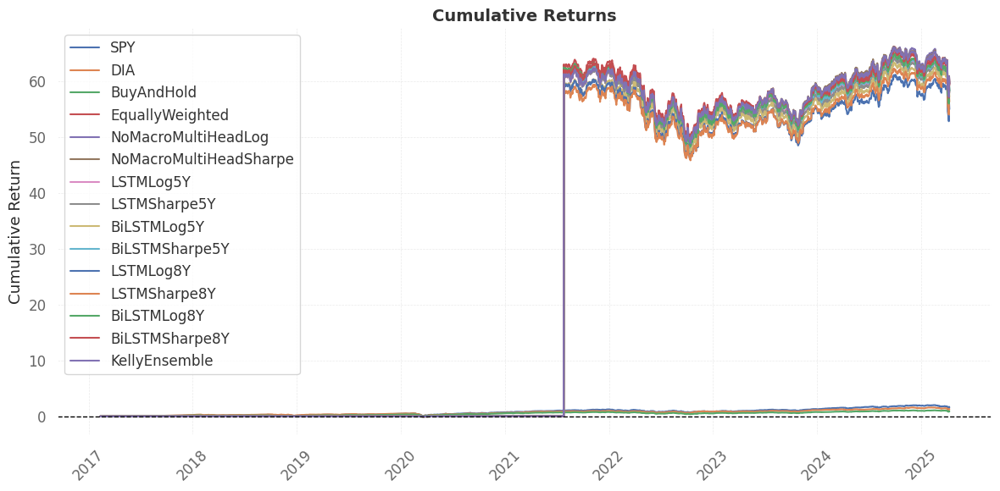

In [ ]:
backtest_tracker.plot_cumulative_returns()

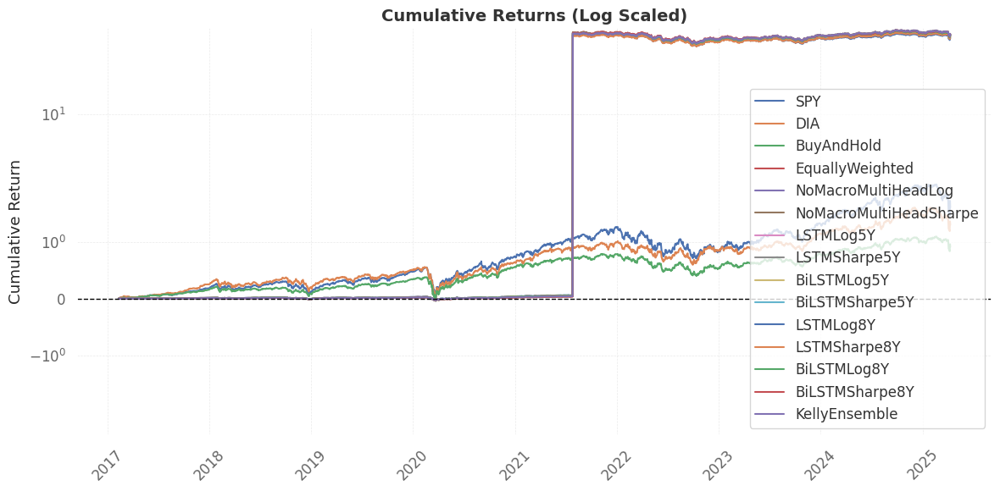

In [ ]:
backtest_tracker.plot_cumulative_returns(log_scale=True)

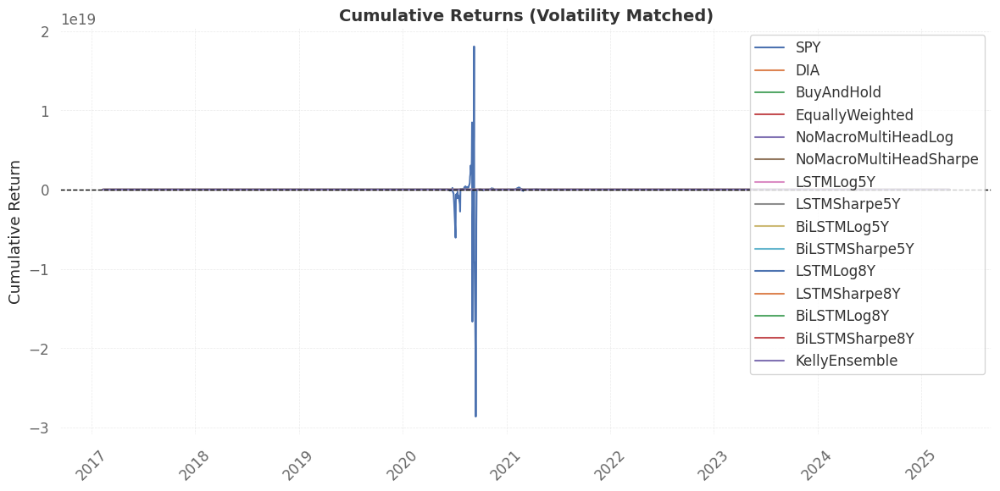

In [ ]:
backtest_tracker.plot_cumulative_returns(match_volatility=True)

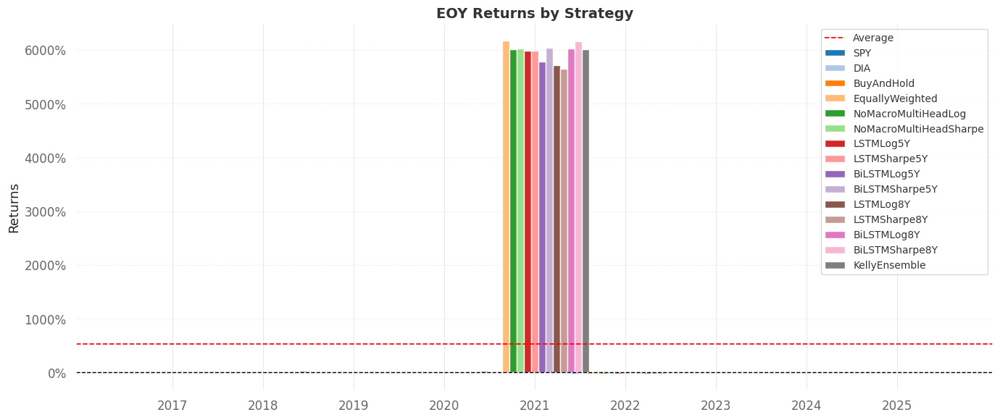

In [ ]:
backtest_tracker.plot_annual_returns()

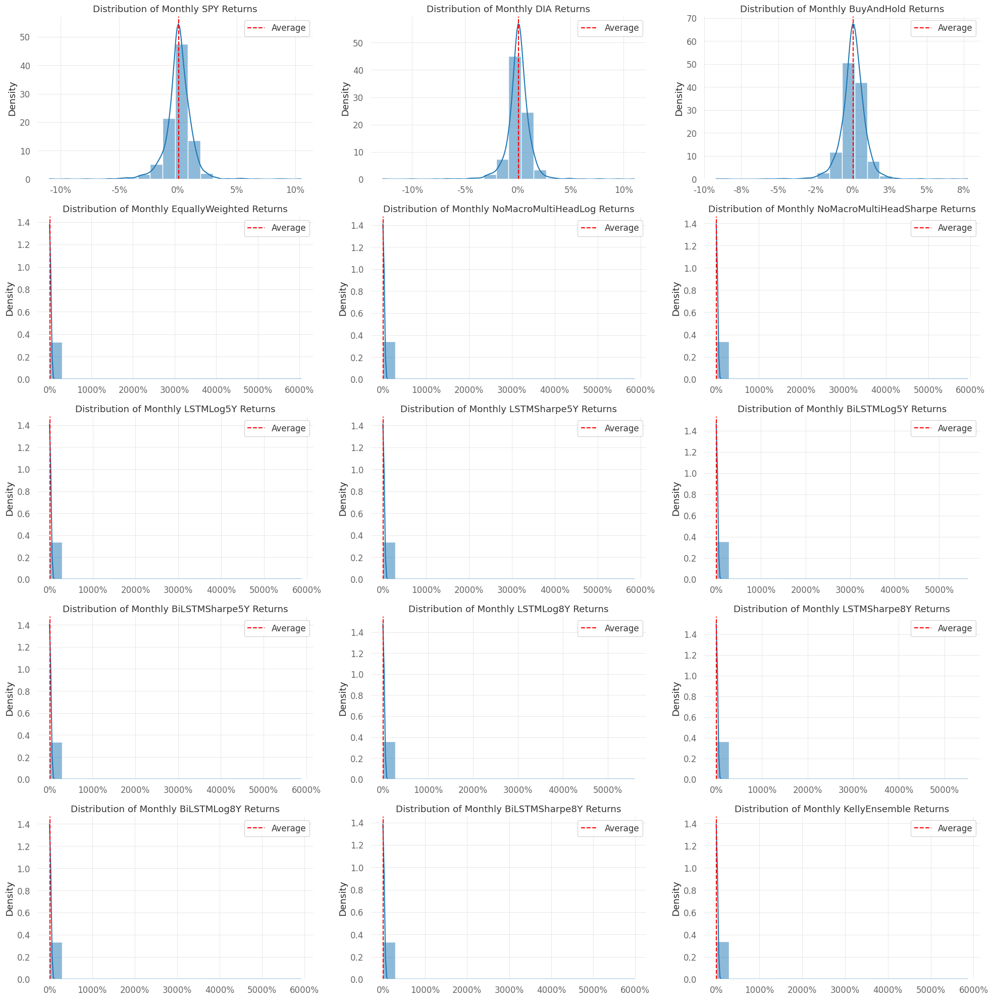

In [ ]:
backtest_tracker.plot_return_distributions()

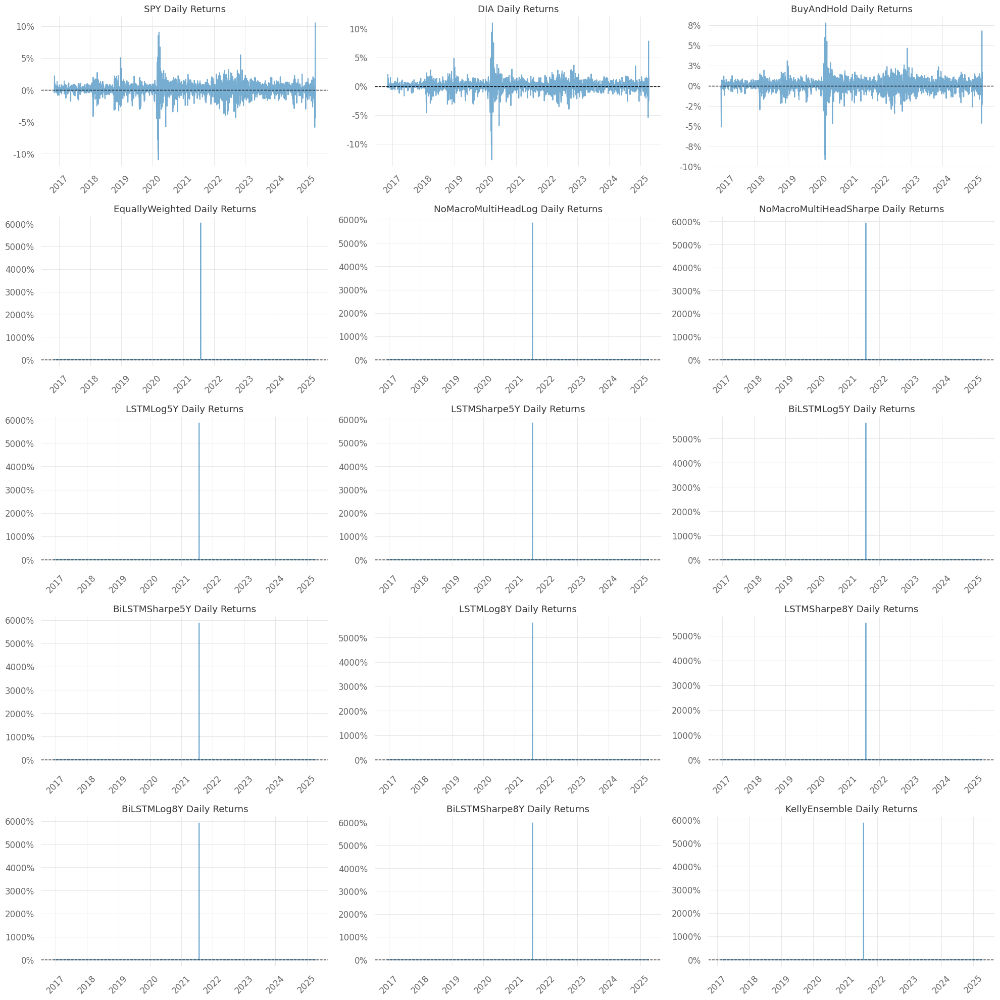

In [ ]:
backtest_tracker.plot_daily_returns()

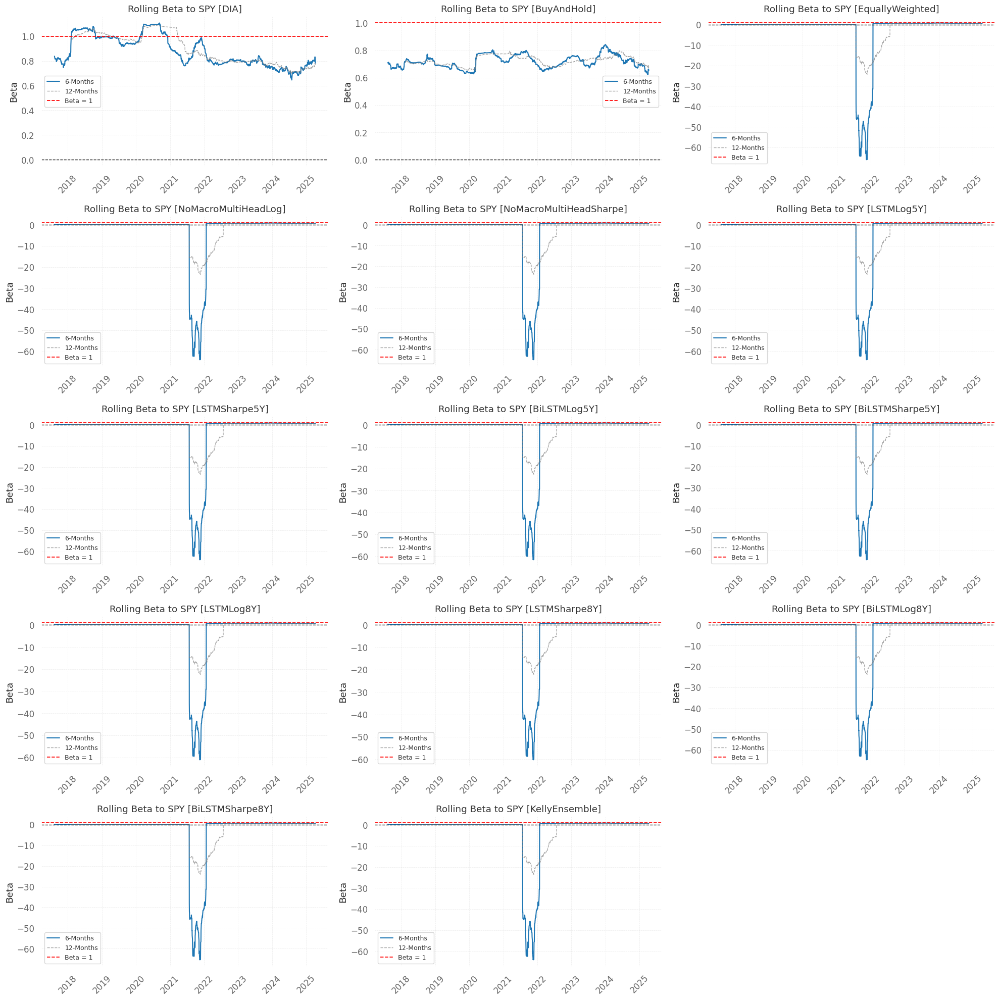

In [ ]:
backtest_tracker.plot_rolling_beta()

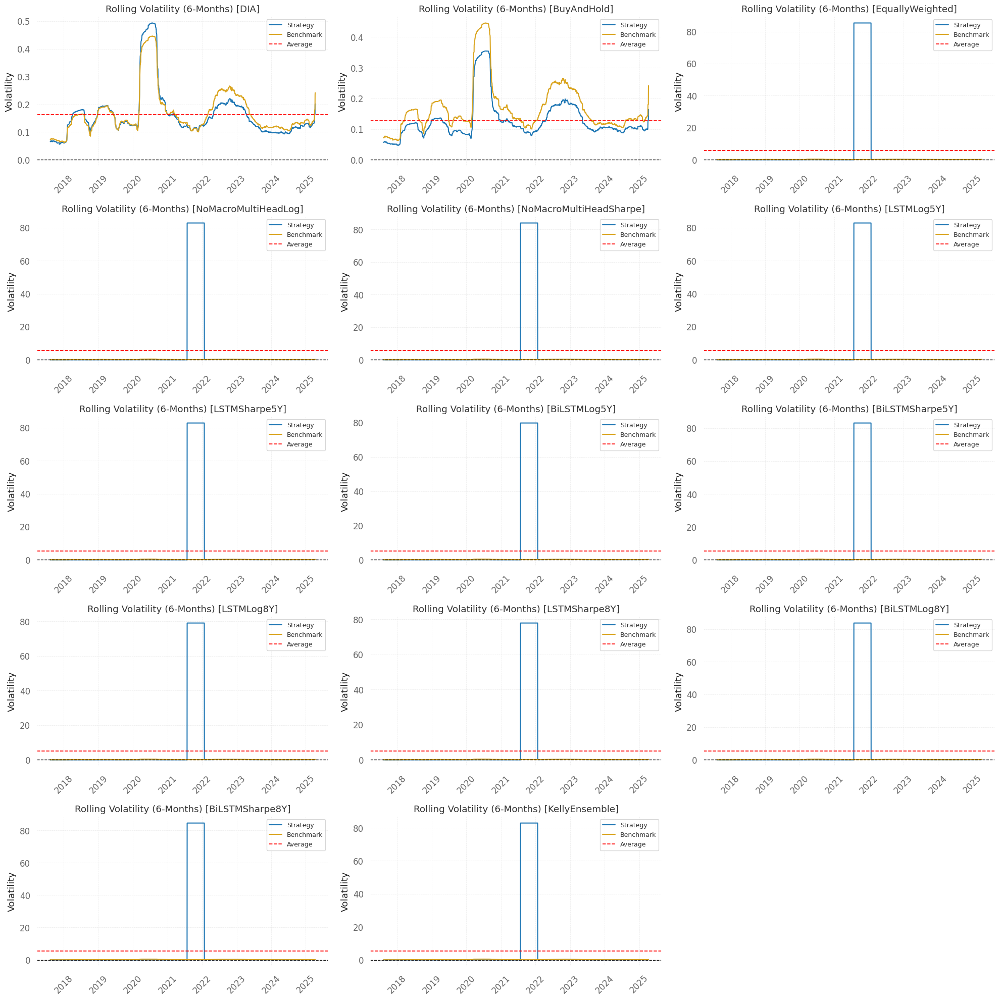

In [ ]:
backtest_tracker.plot_rolling_volatility()

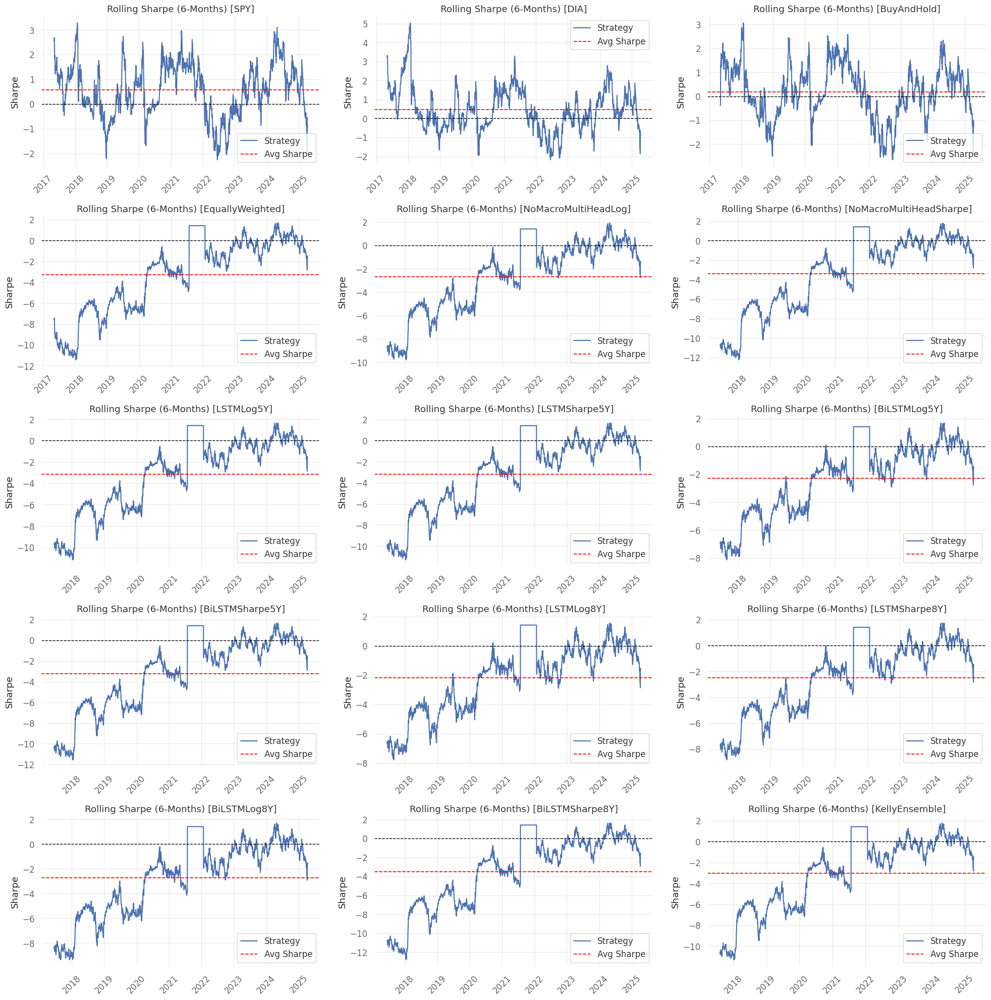

In [ ]:
backtest_tracker.plot_rolling_sharpe()

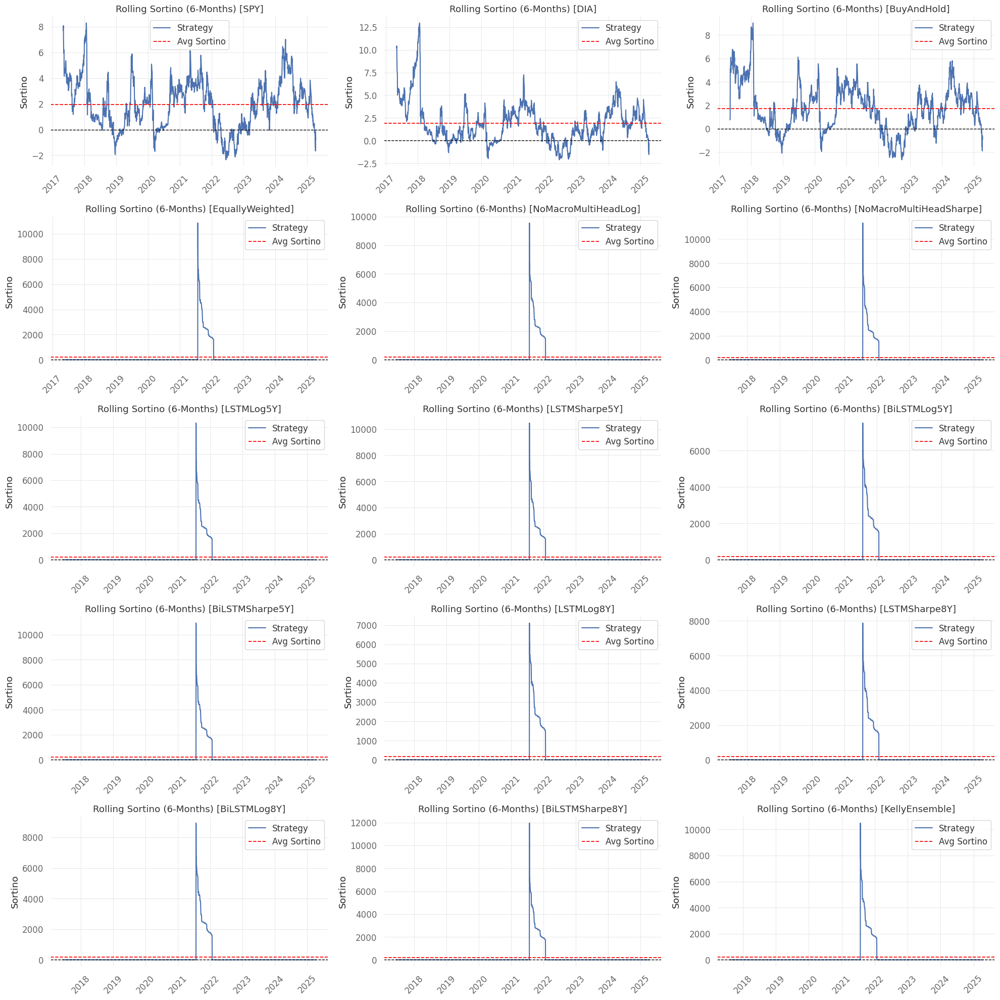

In [ ]:
backtest_tracker.plot_rolling_sortino()

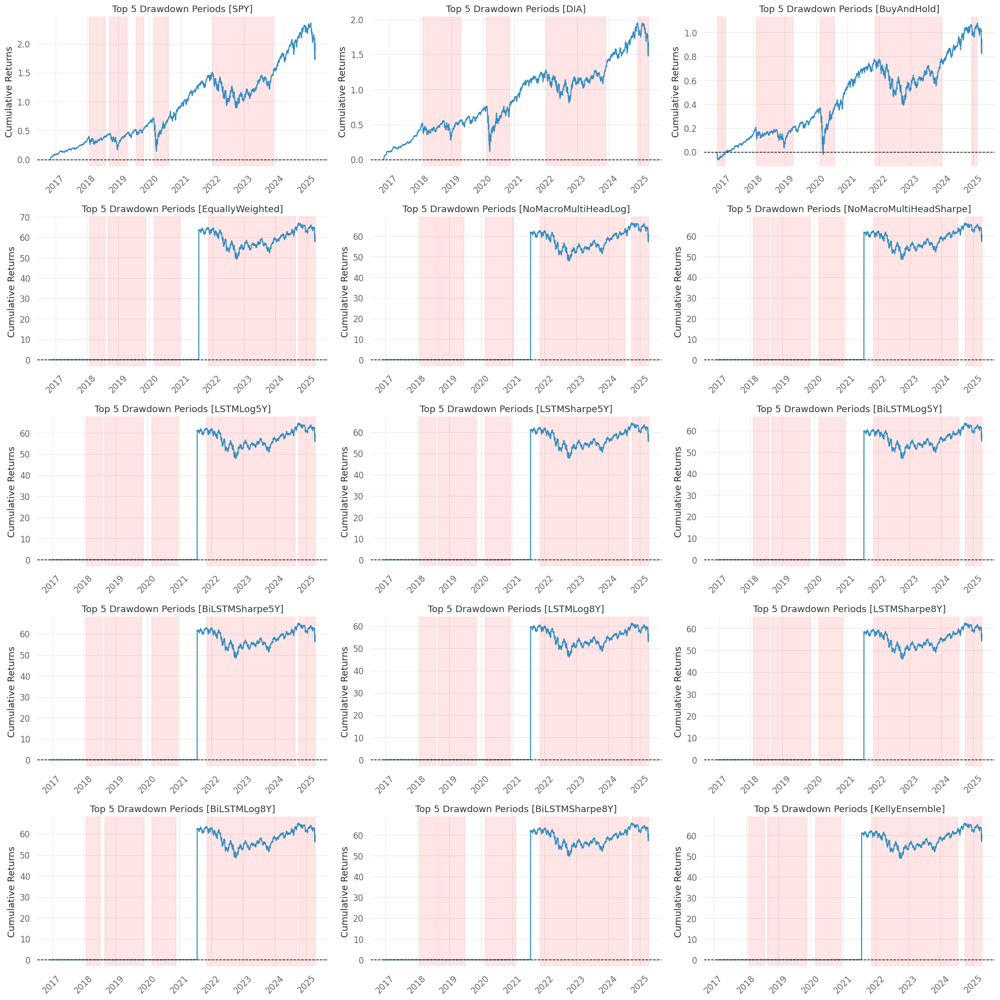

In [ ]:
backtest_tracker.plot_top_drawdowns()

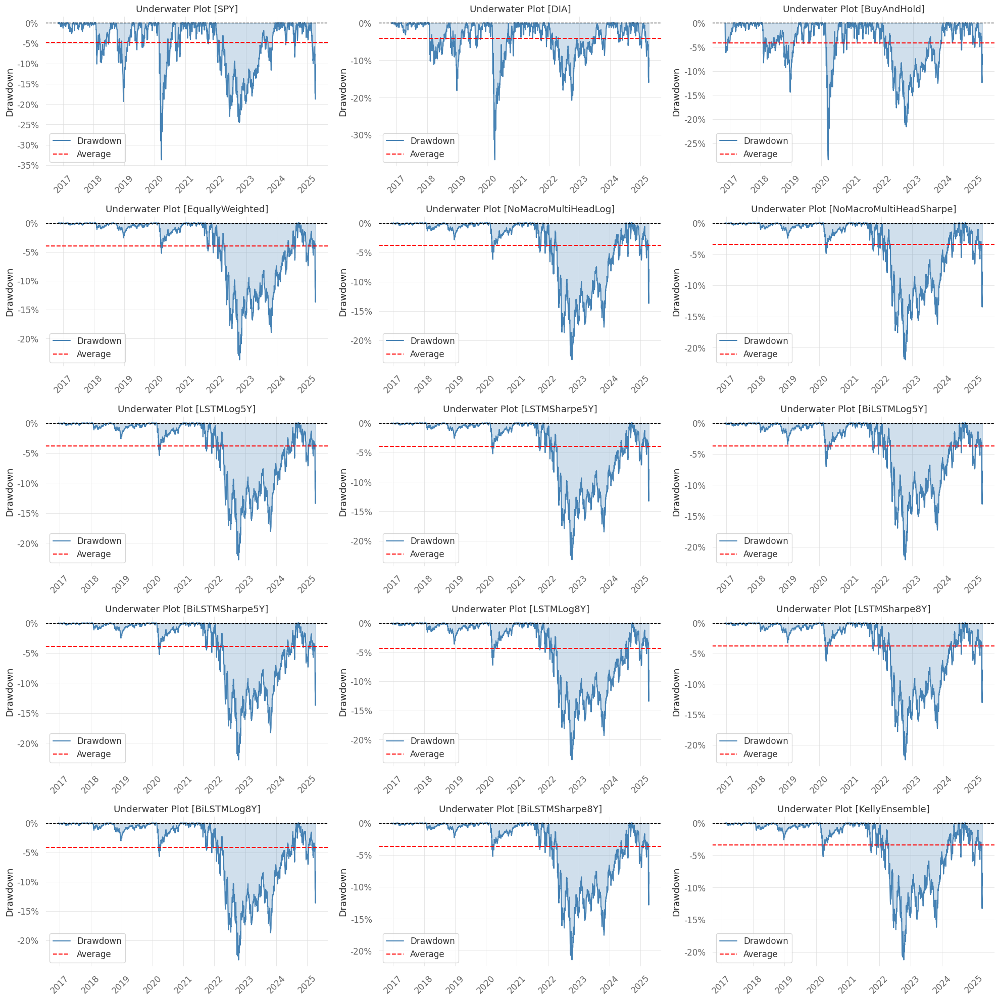

In [ ]:
backtest_tracker.plot_underwater()

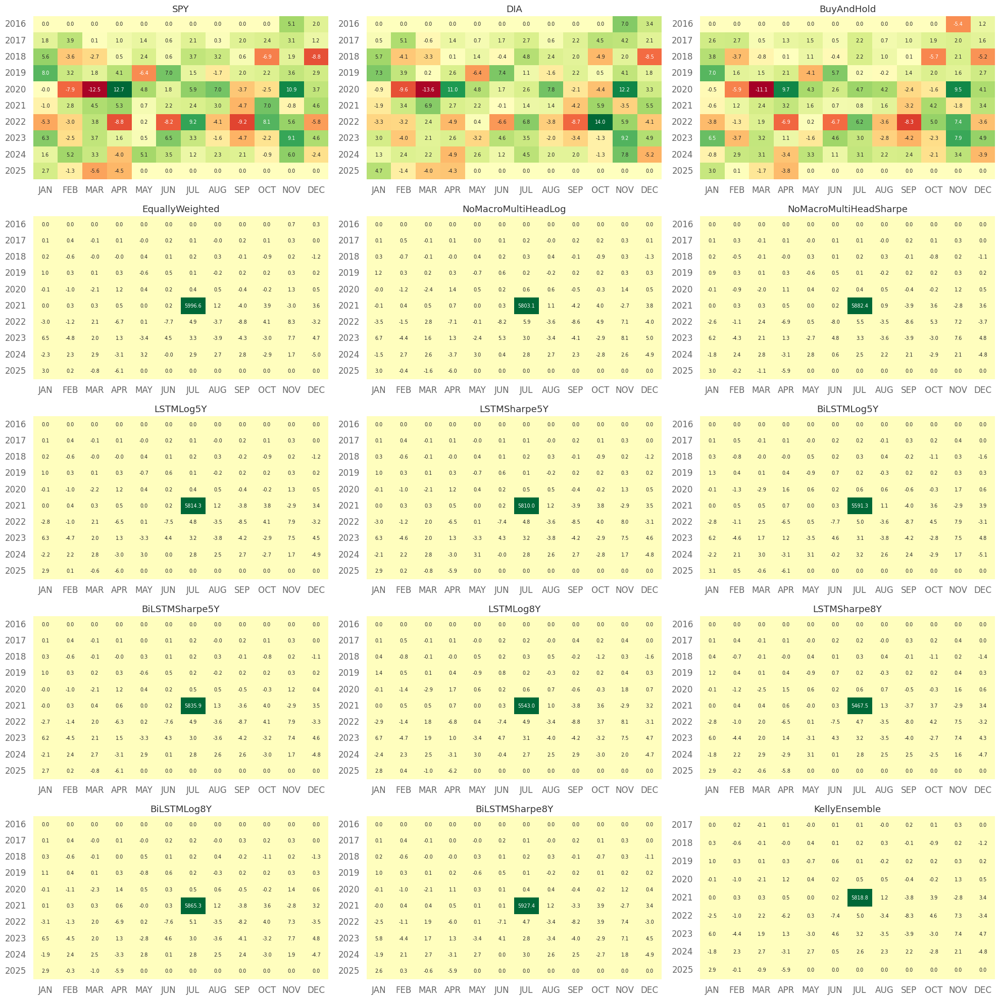

In [ ]:
backtest_tracker.plot_monthly_heatmap()